## 1) Importamos librerias y cargamos los archivos

In [17]:
#Importamos las librerias
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import datetime as datetime
from shapely.geometry import Point
from matplotlib.colors import ListedColormap

%matplotlib inline
plt.style.use('default')
sns.set(style="whitegrid")

In [2]:
#Cargamos el csv
propiedades=pd.read_csv('train.csv')

In [3]:
#Cargamos el .shp de México
url="MexicoPoly0295/MexicoPoly02.shp"
mex=gpd.read_file(url)

In [4]:
#Cargamos el .shp de los municipios de México
url_municipio="muni_2012gw/Muni_2012gw.shp"
mex_municipio=gpd.read_file(url_municipio)

In [5]:
#Establecemos las longitudes extremas de México
lat_maxima=32.718333
lat_minima=14.540833
lng_maxima=-86.710000
lng_minima=-118.366666

### 1.1) Analizamos el set de datos y los .shp de México

In [7]:
#Vista previa del set de Propiedades
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,idzona,lat,lng,fecha,gimnasio,usosmultiples,piscina,escuelascercanas,centroscomercialescercanos,precio
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,23533.0,NaN,NaN,2015-08-23 00:00:00,0.0,0.0,0.0,0.0,0.0,2273000.0
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,24514.0,19.310205,-99.227655,2013-06-28 00:00:00,0.0,0.0,0.0,1.0,1.0,3600000.0
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,48551.0,NaN,NaN,2015-10-17 00:00:00,0.0,0.0,0.0,0.0,0.0,1200000.0
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,53666.0,19.301890,-99.688015,2012-03-09 00:00:00,0.0,0.0,0.0,1.0,1.0,650000.0
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,47835.0,NaN,NaN,2016-06-07 00:00:00,0.0,0.0,0.0,0.0,0.0,1150000.0


In [8]:
#Vista previa del .shp de México
mex.head()

,id,country,name,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254..."
1,2589601,MEX,Baja California,Baja California,Baja California,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449..."
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91...."
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872..."


In [9]:
#Vista previa del .shp de los municipios de México
mex_municipio.head()

,CVE_ENT,CVE_MUN,NOM_MUN,OID_1,cov_,cov_id,geometry
0,01,005,Jesús María,1,1,2,POLYGON ((-102.3356775711372 22.05066521496476...
1,01,011,San Francisco de los Romo,2,2,3,POLYGON ((-102.1527236904711 22.08962165184315...
2,01,001,Aguascalientes,3,3,4,POLYGON ((-102.1064122399267 22.06035441303122...
3,01,008,San José de Gracia,4,4,5,POLYGON ((-102.4561096056242 22.32323223869171...
4,01,007,Rincón de Romos,5,5,6,"POLYGON ((-102.226841597708 22.37392855834552,..."


In [6]:
#Renombramos columnas para poder mergear luego
mex_municipio.rename(columns={'CVE_ENT':'provincia','NOM_MUN':'ciudad'},inplace=True)

In [7]:
#Renombramos columnas y el nombre de algunas provincias para que tengan el mismo nombre que en el set de Datos
mex['locname'].replace({'Baja California':'Baja California Norte','Coahuila de Zaragoza':'Coahuila','Estado de México':'Edo. de México','Ciudad de México':'Distrito Federal','Michoacán de Ocampo':'Michoacán','Veracruz de Ignacio de la Llave':'Veracruz','San Luis Potosí':'San luis Potosí'},inplace=True)
mex.rename(columns={'locname':'provincia'},inplace=True)

In [8]:
#Observamos el tipo de dato que es cada columna y,así mismo, la cantidad de memoria que ocupa
propiedades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240000 entries, 0 to 239999
Data columns (total 23 columns):
id                            240000 non-null int64
titulo                        234613 non-null object
descripcion                   238381 non-null object
tipodepropiedad               239954 non-null object
direccion                     186928 non-null object
ciudad                        239628 non-null object
provincia                     239845 non-null object
antiguedad                    196445 non-null float64
habitaciones                  217529 non-null float64
garages                       202235 non-null float64
banos                         213779 non-null float64
metroscubiertos               222600 non-null float64
metrostotales                 188533 non-null float64
idzona                        211379 non-null float64
lat                           116512 non-null float64
lng                           116512 non-null float64
fecha                         240

In [9]:
#Cambiamos el tipo de dato de algunas columnas para bajar el uso de memoria
propiedades['antiguedad']=propiedades['antiguedad'].astype('int32',errors='ignore')
propiedades['habitaciones']=propiedades['habitaciones'].astype('int32',errors='ignore')
propiedades['banos']=propiedades['banos'].astype('int32',errors='ignore')
propiedades['gimnasio']=propiedades['gimnasio'].astype('int32',errors='ignore')
propiedades['usosmultiples']=propiedades['usosmultiples'].astype('int32',errors='ignore')
propiedades['piscina']=propiedades['piscina'].astype('int32',errors='ignore')
propiedades['escuelascercanas']=propiedades['escuelascercanas'].astype('int32',errors='ignore')
propiedades['centroscomercialescercanos']=propiedades['centroscomercialescercanos'].astype('int32',errors='ignore')

In [10]:
#Verificamos que efectivamente se hicieron los cambios
propiedades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240000 entries, 0 to 239999
Data columns (total 23 columns):
id                            240000 non-null int64
titulo                        234613 non-null object
descripcion                   238381 non-null object
tipodepropiedad               239954 non-null object
direccion                     186928 non-null object
ciudad                        239628 non-null object
provincia                     239845 non-null object
antiguedad                    196445 non-null float64
habitaciones                  217529 non-null float64
garages                       202235 non-null float64
banos                         213779 non-null float64
metroscubiertos               222600 non-null float64
metrostotales                 188533 non-null float64
idzona                        211379 non-null float64
lat                           116512 non-null float64
lng                           116512 non-null float64
fecha                         240

In [23]:
#Verificamos si hay algún elemento nulo en las columnas, lo cual efectivamente es cierto
propiedades.isnull().any()

id                            False
titulo                         True
descripcion                    True
tipodepropiedad                True
direccion                      True
ciudad                         True
provincia                      True
antiguedad                     True
habitaciones                   True
garages                        True
banos                          True
metroscubiertos                True
metrostotales                  True
idzona                         True
lat                            True
lng                            True
fecha                         False
gimnasio                      False
usosmultiples                 False
piscina                       False
escuelascercanas              False
centroscomercialescercanos    False
precio                        False
dtype: bool

In [24]:
#Vemos cuantos elementos nulos hay por columna
propiedades.isnull().sum()

id                                 0
titulo                          5387
descripcion                     1619
tipodepropiedad                   46
direccion                      53072
ciudad                           372
provincia                        155
antiguedad                     43555
habitaciones                   22471
garages                        37765
banos                          26221
metroscubiertos                17400
metrostotales                  51467
idzona                         28621
lat                           123488
lng                           123488
fecha                              0
gimnasio                           0
usosmultiples                      0
piscina                            0
escuelascercanas                   0
centroscomercialescercanos         0
precio                             0
dtype: int64

## 2) Fechas

Comenzamos analizando las fechas, como se dice en el enunciado del trabajo, las fechas comprendidas son desde el 2012 hasta el 2016, la idea es verificar que efectivamente es cierto y luego, analizar de manera mas minuciosa para ver que conclusiones se pueden obtener

In [11]:
#Hacemos la conversión de fechas
propiedades['Fecha']=pd.to_datetime(propiedades['fecha'])
propiedades.drop(columns={'fecha'},inplace=True)

In [12]:
#Generamos las columnas de Año, Mes y Dia
propiedades['Anio']=propiedades['Fecha'].dt.year
propiedades['Mes']=propiedades['Fecha'].dt.month
propiedades['Dia']=propiedades['Fecha'].dt.day
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,gimnasio,usosmultiples,piscina,escuelascercanas,centroscomercialescercanos,precio,Fecha,Anio,Mes,Dia
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,0,0,0,0,0,2273000.0,2015-08-23,2015,8,23
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,0,0,0,1,1,3600000.0,2013-06-28,2013,6,28
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,0,0,0,0,0,1200000.0,2015-10-17,2015,10,17
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,0,0,0,1,1,650000.0,2012-03-09,2012,3,9
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,0,0,0,0,0,1150000.0,2016-06-07,2016,6,7


In [13]:
#Creamos una función que según el mes y el dia, nos devuelve en que estación se encuentra
def fechaEstacion(mes,dia):
    if((mes==1) | (mes==2)):
        return 'Invierno'
    if(mes==3):
        if(dia<21):
            return 'Invierno'
        if(dia>=21):
            return 'Primavera'
    if((mes==4) | (mes==5)):
        return 'Primavera'
    if(mes==6):
        if(dia<21):
            return 'Primavera'
        if(dia>=21):
            return 'Verano'
    if((mes==7) | (mes==8)):
        return 'Verano'
    if(mes==9):
        if(dia<21):
            return 'Verano'
        if(dia>=21):
            return 'Otonio'
    if((mes==10) | (mes==11)):
        return 'Otonio'
    if(mes==12):
        if(dia<21):
            return 'Otonio'
        if(dia>=21):
            return 'Invierno'

In [14]:
#Aplicamos la función en cuestión
propiedades['Estacion']=propiedades.apply(lambda x: fechaEstacion(x['Mes'],x['Dia']),axis=1)
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,usosmultiples,piscina,escuelascercanas,centroscomercialescercanos,precio,Fecha,Anio,Mes,Dia,Estacion
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,0,0,0,0,2273000.0,2015-08-23,2015,8,23,Verano
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,0,0,1,1,3600000.0,2013-06-28,2013,6,28,Verano
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,0,0,0,0,1200000.0,2015-10-17,2015,10,17,Otonio
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,0,0,1,1,650000.0,2012-03-09,2012,3,9,Invierno
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,0,0,0,0,1150000.0,2016-06-07,2016,6,7,Primavera


In [15]:
#Generamos una columna que tenga la diferencia entre los Metros Totales y los Curbiertos
propiedades['difmetros']=propiedades['metrostotales']-propiedades['metroscubiertos']
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,piscina,escuelascercanas,centroscomercialescercanos,precio,Fecha,Anio,Mes,Dia,Estacion,difmetros
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,0,0,0,2273000.0,2015-08-23,2015,8,23,Verano,0.0
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,0,1,1,3600000.0,2013-06-28,2013,6,28,Verano,-88.0
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,0,0,0,1200000.0,2015-10-17,2015,10,17,Otonio,22.0
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,0,1,1,650000.0,2012-03-09,2012,3,9,Invierno,4.0
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,0,0,0,1150000.0,2016-06-07,2016,6,7,Primavera,0.0


### 2.1) Años

Text(0,0.5,'Años')

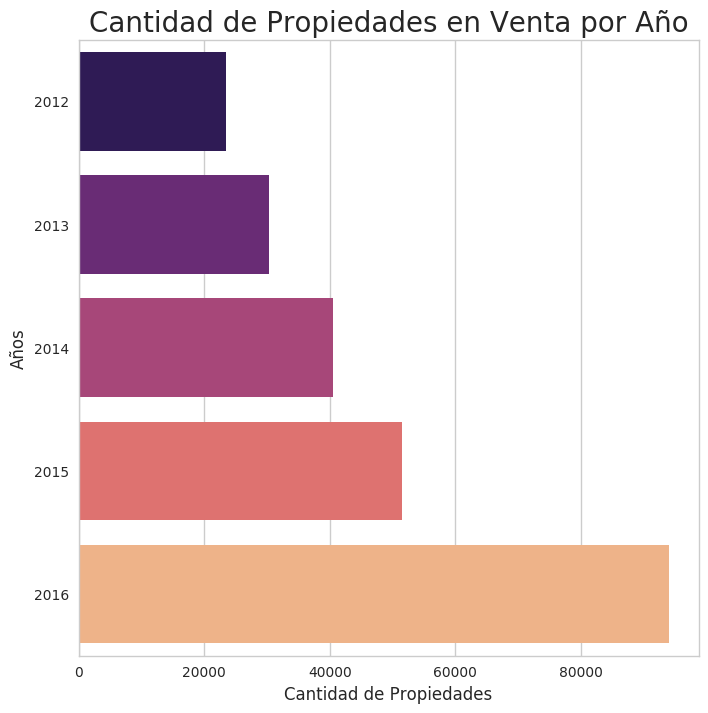

In [18]:
cantidad_prop_anio=propiedades['Anio'].value_counts().sort_index()
plt.subplots(figsize=(8,8))
grafico_anio=sns.barplot(x=cantidad_prop_anio.values,y=cantidad_prop_anio.index,orient='h',palette='magma')
grafico_anio.set_title("Cantidad de Propiedades en Venta por Año",fontsize=20)
grafico_anio.set_xlabel("Cantidad de Propiedades",fontsize=12)
grafico_anio.set_ylabel("Años",fontsize=12)

Se puede observar que con el correr de los años la cantidad de propiedades aumentaron considerablemente, asi mismo, veificamos que las fechas son efectivamente desde el 2012 al 2016, no habiendo ningun tipo de anomalía en esta cuestión

### 2.2) Mes

Text(0,0.5,'Cantidad de Propiedades')

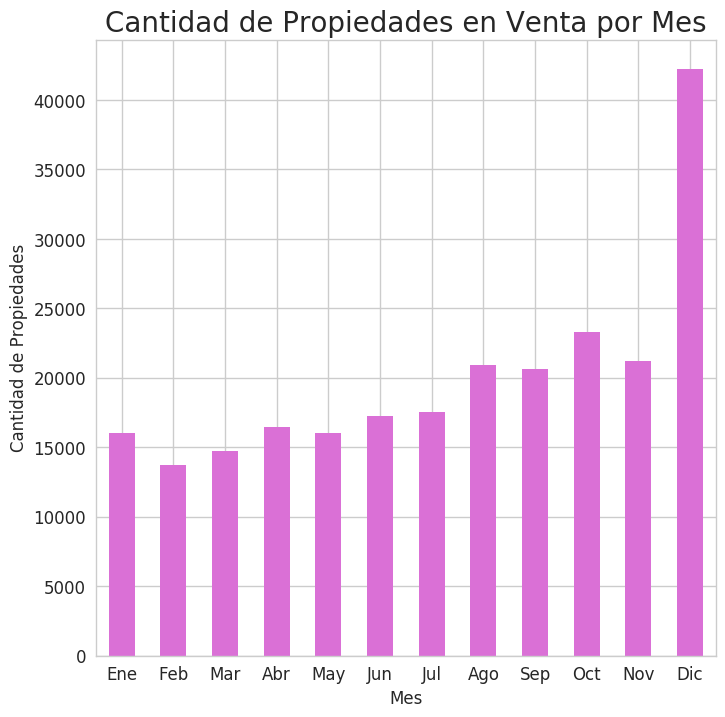

In [22]:
cantidad_prop_mes=propiedades['Mes'].value_counts().sort_index().reset_index()
cantidad_prop_mes['index'].replace({1:'Ene',2:'Feb',3:'Mar',4:'Abr',5:'May',6:'Jun',7:'Jul',8:'Ago',9:'Sep',10:'Oct',11:'Nov',12:'Dic'},inplace=True)
cantidad_prop_mes.set_index(['index'],inplace=True)
grafico_mes=cantidad_prop_mes.plot(kind='bar',color='orchid',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_mes.set_title("Cantidad de Propiedades en Venta por Mes",fontsize=20)
grafico_mes.set_xlabel("Mes",fontsize=12)
grafico_mes.set_ylabel("Cantidad de Propiedades",fontsize=12)

En cuanto a los meses, se puede ver que en el mes de diciembre es donde mayor cantidad de propiedades fue en diciembre mientras que la de menos cantidad es la de febrero. También se puede ver que hay poca actividad en los meses de Junio y Julio, lo cual no parece extraño ya que, al ser propiedades ubicadas en México, en esa fecha es verano, lo cual tiene sentido

### 2.3) Días

ACLARACIÓN: Para los días solamente tomamos 30 días, el dia 31 decidimos no incluirlo ya que no se puede analizar con profundidad al no tener todos los datos como los otros dias

Text(0,0.5,'Cantidad de Propiedades')

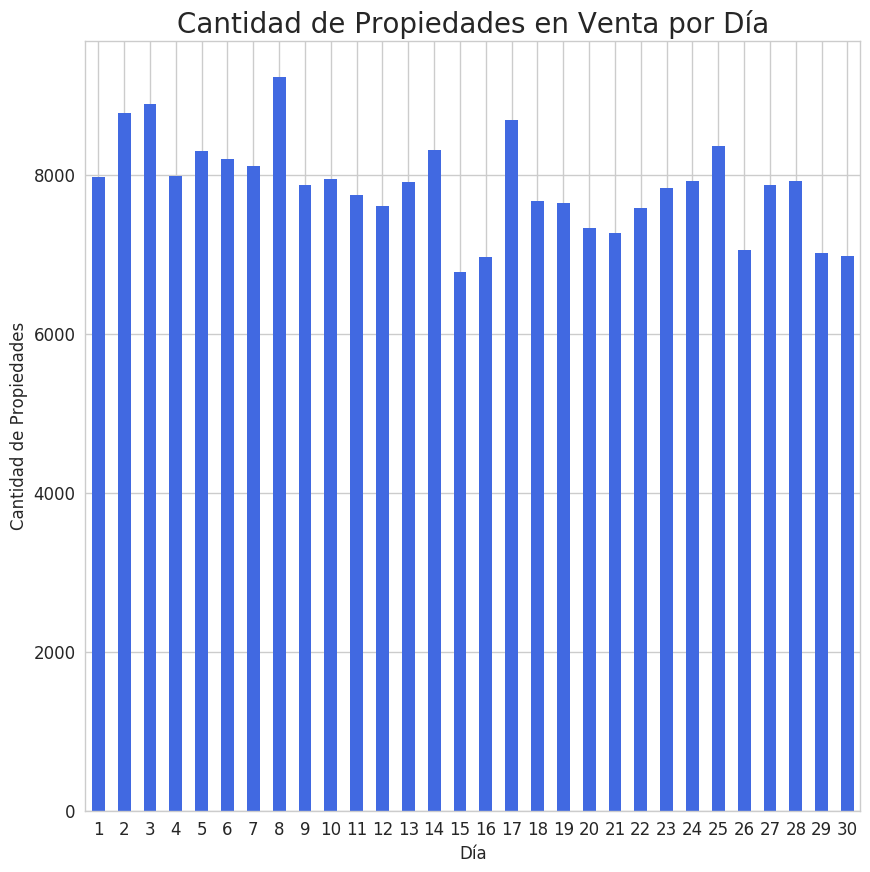

In [23]:
cantidad_prop_dia=propiedades['Dia'].value_counts().sort_index().head(30)
grafico_dia=cantidad_prop_dia.plot(kind='bar',color='royalblue',fontsize=12,figsize=(10,10),rot=0)
grafico_dia.set_title("Cantidad de Propiedades en Venta por Día",fontsize=20)
grafico_dia.set_xlabel("Día",fontsize=12)
grafico_dia.set_ylabel("Cantidad de Propiedades",fontsize=12)

Podemos observar que a mitad de mes, mas especificamente los días 15 y 16 son los que menor cantidad de propiedades hubo. Cabe aclarar que el día 31 fue descartado por el simple hecho de que no todos los meses tienen dicho dia, por lo que se hubiera notado alguna anomalía con dicho número

### 2.4) Relaciones entre Fechas

#### 2.4.1) Relación entre Año y Mes

In [41]:
fecha_propiedades=propiedades[['Anio','Mes','Dia']].copy()
fecha_propiedades['Valor']=1
anio_mes=fecha_propiedades.pivot_table(index='Mes',columns='Anio',values='Valor',aggfunc='count')
anio_mes.rename(index={1:'Ene',2:'Feb',3:'Mar',4:'Abr',5:'May',6:'Jun',7:'Jul',8:'Ago',9:'Sep',10:'Oct',11:'Nov',12:'Dic'},inplace=True)
anio_mes

Anio,2012,2013,2014,2015,2016
Mes,,,,,
Ene,1528,1993,2403,4310,5775
Feb,1327,1401,2534,3869,4592
Mar,1103,1734,2916,3957,5022
Abr,1434,1829,2780,3783,6640
May,1857,2000,3071,3696,5438
Jun,1524,2016,3082,3804,6795
Jul,1973,2524,3125,3875,6013
Ago,3971,2374,3583,4526,6443
Sep,2598,3321,3911,4863,5929


[Text(0,0.5,'Ene'),
 Text(0,1.5,'Feb'),
 Text(0,2.5,'Mar'),
 Text(0,3.5,'Abr'),
 Text(0,4.5,'May'),
 Text(0,5.5,'Jun'),
 Text(0,6.5,'Jul'),
 Text(0,7.5,'Ago'),
 Text(0,8.5,'Sep'),
 Text(0,9.5,'Oct'),
 Text(0,10.5,'Nov'),
 Text(0,11.5,'Dic')]

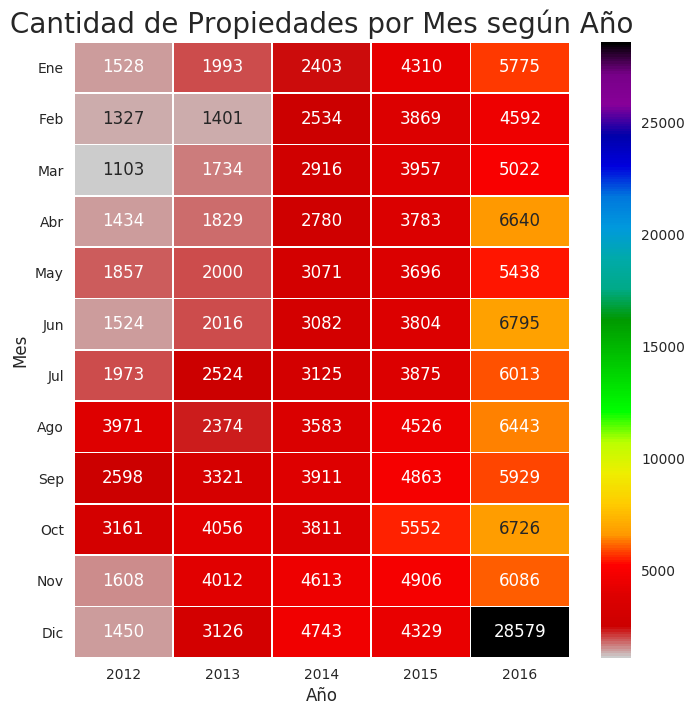

In [42]:
plt.subplots(figsize=(8,8))
grafico_anio_mes=sns.heatmap(anio_mes,linewidths=.5,fmt="d",annot=True,cmap="nipy_spectral_r")
grafico_anio_mes.set_title("Cantidad de Propiedades por Mes según Año",fontsize=20)
grafico_anio_mes.set_xlabel("Año",fontsize=12)
grafico_anio_mes.set_ylabel("Mes",fontsize=12)
grafico_anio_mes.set_yticklabels(grafico_anio_mes.get_yticklabels(),rotation=0)

Se puede observar que en el mes de Diciembre del 2016 es donde hay mayor cantidad de propiedades que fueron puestas a la venta, lo cual concuerda con lo visto anteriormente. Sin embargo, aunque en el 2014 también predomina el mes de Diciembre, en los otros años suele haber un cambio, ya que en el año 2012 el mes que presenta mayor cantidad de propiedades es Agosto, en 2013 el mes de Noviembre y en el 2015 Octubre.

#### 2.4.2) Relación entre Mes y Día

In [43]:
mes_dia=fecha_propiedades.pivot_table(index='Mes',columns='Dia',values='Valor',aggfunc='count')
mes_dia.fillna(0,inplace=True)
mes_dia.drop(columns={31},inplace=True)
mes_dia.rename(index={1:'Ene',2:'Feb',3:'Mar',4:'Abr',5:'May',6:'Jun',7:'Jul',8:'Ago',9:'Sep',10:'Oct',11:'Nov',12:'Dic'},inplace=True)
mes_dia

Dia,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
Mes,,,,,,,,,,,,,,,,,,,,,
Ene,330.0,467.0,943.0,638.0,437.0,476.0,377.0,693.0,613.0,450.0,...,429.0,534.0,673.0,525.0,520.0,511.0,534.0,509.0,667.0,474.0
Feb,640.0,570.0,660.0,459.0,634.0,453.0,453.0,506.0,494.0,485.0,...,435.0,439.0,308.0,458.0,400.0,494.0,610.0,470.0,140.0,0.0
Mar,353.0,400.0,471.0,683.0,428.0,491.0,664.0,828.0,453.0,442.0,...,442.0,507.0,367.0,353.0,449.0,369.0,399.0,613.0,480.0,359.0
Abr,439.0,509.0,507.0,534.0,509.0,437.0,520.0,1676.0,406.0,529.0,...,392.0,697.0,342.0,832.0,599.0,480.0,434.0,553.0,650.0,398.0
May,549.0,610.0,539.0,493.0,407.0,637.0,506.0,520.0,581.0,379.0,...,459.0,454.0,517.0,524.0,494.0,517.0,633.0,595.0,522.0,620.0
Jun,462.0,401.0,695.0,538.0,568.0,701.0,825.0,549.0,889.0,766.0,...,625.0,424.0,493.0,647.0,481.0,494.0,540.0,542.0,380.0,452.0
Jul,600.0,516.0,522.0,602.0,434.0,485.0,506.0,640.0,383.0,618.0,...,456.0,788.0,483.0,629.0,671.0,529.0,540.0,461.0,701.0,567.0
Ago,1030.0,602.0,604.0,455.0,635.0,1109.0,629.0,782.0,632.0,580.0,...,612.0,660.0,685.0,638.0,587.0,687.0,618.0,606.0,681.0,678.0
Sep,572.0,709.0,803.0,835.0,865.0,539.0,858.0,481.0,619.0,590.0,...,563.0,578.0,1121.0,714.0,803.0,889.0,700.0,503.0,608.0,704.0


[Text(0,0.5,'Ene'),
 Text(0,1.5,'Feb'),
 Text(0,2.5,'Mar'),
 Text(0,3.5,'Abr'),
 Text(0,4.5,'May'),
 Text(0,5.5,'Jun'),
 Text(0,6.5,'Jul'),
 Text(0,7.5,'Ago'),
 Text(0,8.5,'Sep'),
 Text(0,9.5,'Oct'),
 Text(0,10.5,'Nov'),
 Text(0,11.5,'Dic')]

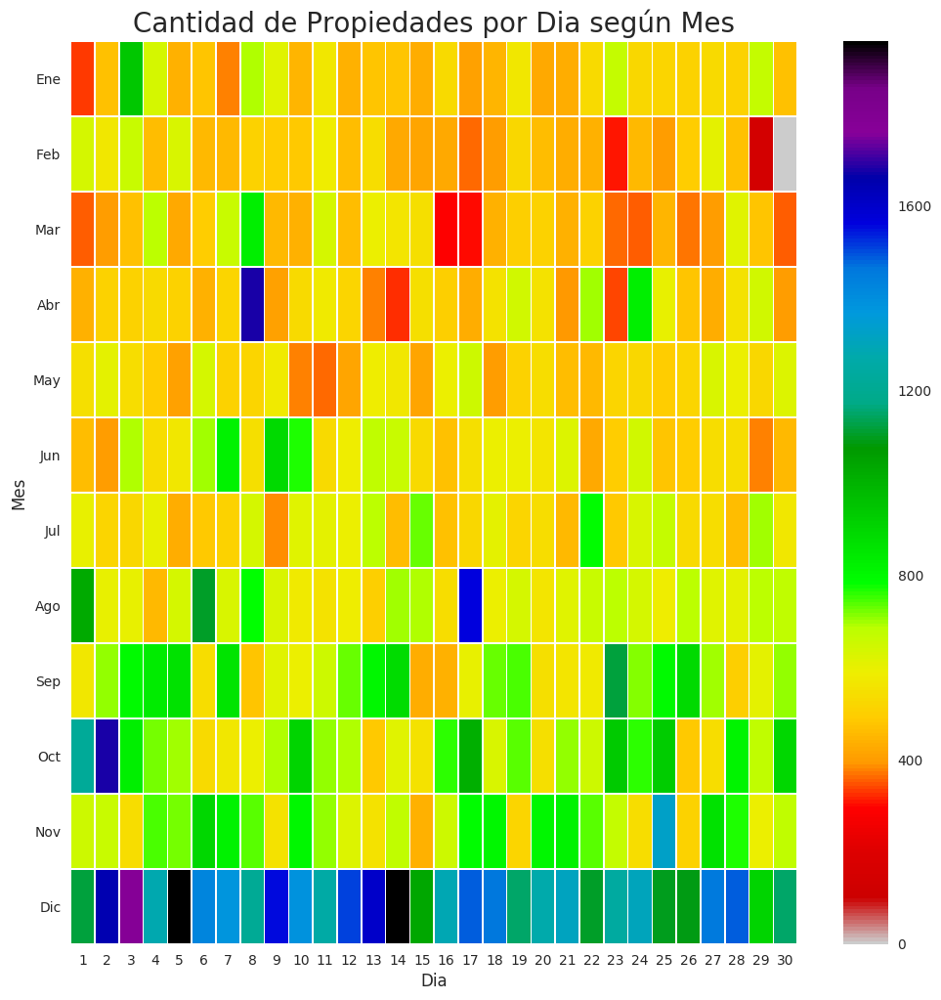

In [44]:
plt.subplots(figsize=(12,12))
grafico_mes_dia=sns.heatmap(mes_dia,linewidths=.5,cmap="nipy_spectral_r")
grafico_mes_dia.set_title("Cantidad de Propiedades por Dia según Mes",fontsize=20)
grafico_mes_dia.set_xlabel("Dia",fontsize=12)
grafico_mes_dia.set_ylabel("Mes",fontsize=12)
grafico_mes_dia.set_yticklabels(grafico_mes_dia.get_yticklabels(),rotation=0)

Podemos ver que sigue imponiendose el mes de Diciembre, y los días 5 como 14 es donde se registran la mayor cantidad de propiedades puestas en venta

### 2.5) Relación de Precio por Año y Mes

In [45]:
precio_anio_mes=propiedades[['Anio','Mes','precio']].copy()
group_precio_anio_mes=precio_anio_mes.pivot_table(index='Mes',columns='Anio',values='precio',aggfunc='mean')
group_precio_anio_mes

Anio,2012,2013,2014,2015,2016
Mes,,,,,
1,1.910287e+06,2.032821e+06,2.194887e+06,2.399791e+06,2.688370e+06
2,1.817815e+06,2.158046e+06,2.327649e+06,2.367704e+06,2.695540e+06
3,1.966355e+06,2.092788e+06,2.268509e+06,2.602794e+06,2.807389e+06
4,2.167271e+06,2.164533e+06,2.360991e+06,2.520666e+06,2.827183e+06
5,1.899124e+06,2.119536e+06,2.312620e+06,2.643570e+06,2.726720e+06
6,1.930387e+06,2.058968e+06,2.357717e+06,2.734104e+06,2.744906e+06
7,1.827299e+06,2.221331e+06,2.358130e+06,2.779177e+06,2.882330e+06
8,2.116829e+06,2.197108e+06,2.345646e+06,2.654494e+06,2.880278e+06
9,2.092780e+06,2.112627e+06,2.430109e+06,2.778324e+06,2.918304e+06


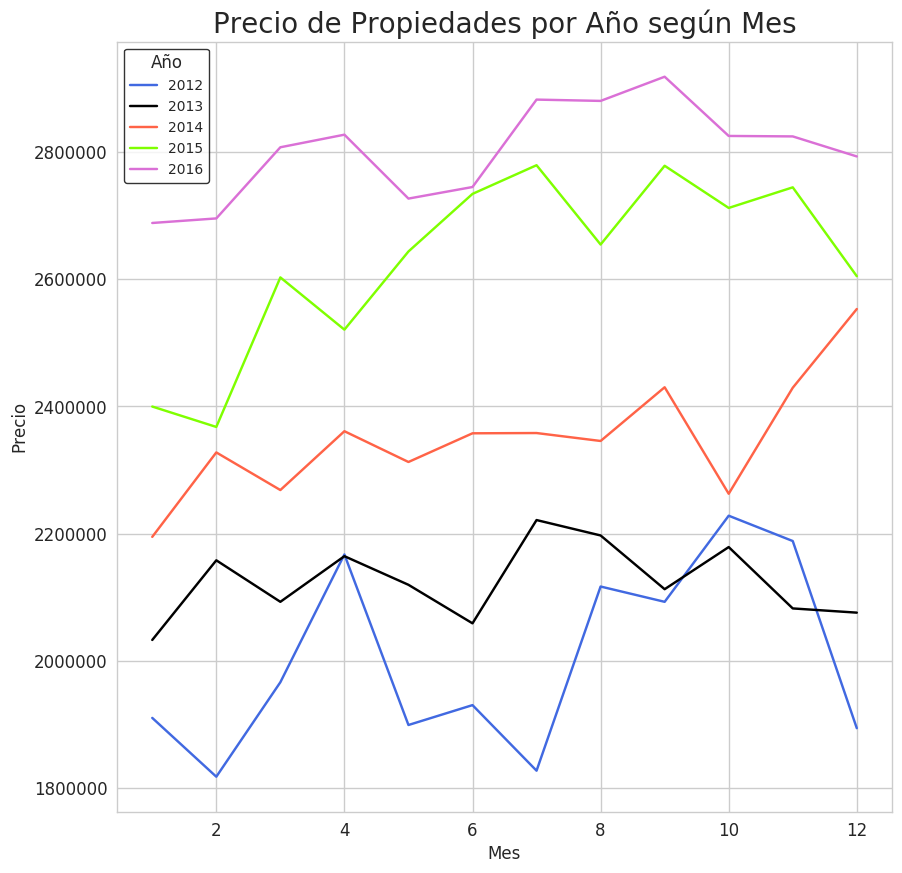

In [46]:
grafico_group_precio_anio_mes=group_precio_anio_mes.plot(kind='line',color=['royalblue','black','tomato','chartreuse','orchid'],figsize=(10,10),fontsize=12)
grafico_group_precio_anio_mes.set_title("Precio de Propiedades por Año según Mes",fontsize=20)
grafico_group_precio_anio_mes.set_xlabel("Mes",fontsize=12)
grafico_group_precio_anio_mes.set_ylabel("Precio",fontsize=12)
leyenda=plt.legend(['2012','2013','2014','2015','2016'],fontsize=10,title='Año',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

Como era de esperarse, en el 2016 es donde los precios son mayores y podemos observar que hay una similitud entre 2016, 2015 y 2014 que el mes donde los precios son mayores fueron en Septiembre, mientras que en el 2012 fue Octubre, superando inclusive al precio de ese mes en el 2013

### 2.6) Relación entre Año y Tipo de Propiedad

In [254]:
tipo_propiedad_top=tipo_precio['tipodepropiedad'].value_counts().head(10).reset_index()
tipo_propiedad_top.drop(columns={'tipodepropiedad'},inplace=True)
tipo_propiedad_top.rename(columns={'index':'tipodepropiedad'},inplace=True)
tipo_propiedad_top

,tipodepropiedad
0,Casa
1,Apartamento
2,Casa en condominio
3,Terreno
4,Local Comercial
5,Oficina comercial
6,Bodega comercial
7,Edificio
8,Terreno comercial
9,Casa uso de suelo


In [100]:
año_tipo=propiedades[['Anio','tipodepropiedad']].copy()
año_tipo.dropna(inplace=True)
año_tipo_top=pd.merge(año_tipo,tipo_propiedad_top,on='tipodepropiedad',how='inner')
año_tipo_top['Valor']=1
cantidad_año_tipo_top=año_tipo_top.pivot_table(index='tipodepropiedad',columns='Anio',values='Valor',aggfunc='sum')
cantidad_año_tipo_top.head()

Anio,2012,2013,2014,2015,2016
tipodepropiedad,,,,,
Apartamento,5071,6716,9698,12780,23076
Bodega comercial,139,158,236,327,546
Casa,13728,19366,24299,29800,54524
Casa en condominio,2835,1960,3042,4095,7365
Casa uso de suelo,114,96,101,141,256


[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Edificio'),
 Text(0,6.5,'Local Comercial'),
 Text(0,7.5,'Oficina comercial'),
 Text(0,8.5,'Terreno'),
 Text(0,9.5,'Terreno comercial')]

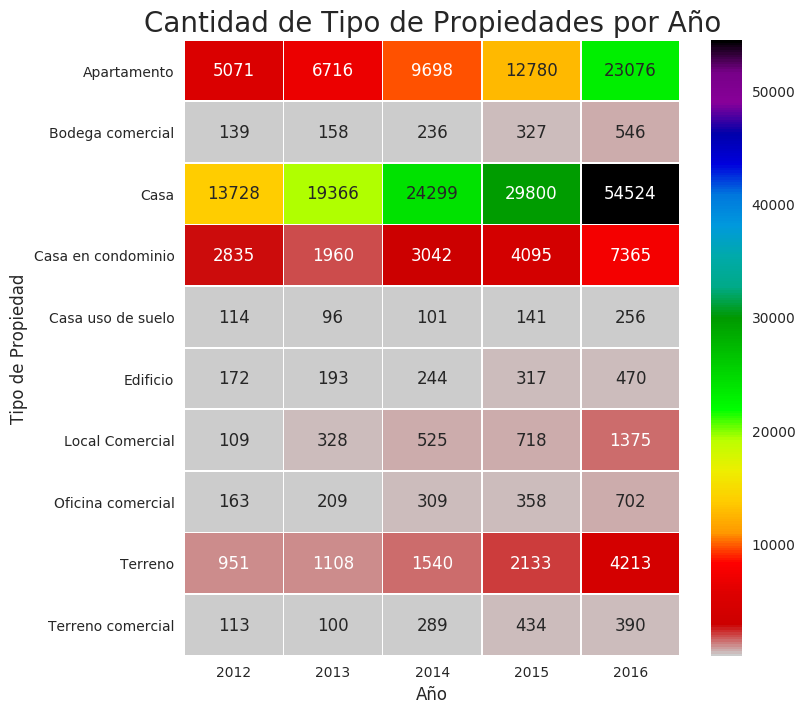

In [101]:
plt.subplots(figsize=(8,8))
grafico_cantidad_año_tipo_top=sns.heatmap(cantidad_año_tipo_top,linewidths=.5,fmt="d",annot=True,cmap="nipy_spectral_r")
grafico_cantidad_año_tipo_top.set_title("Cantidad de Tipo de Propiedades por Año",fontsize=20)
grafico_cantidad_año_tipo_top.set_xlabel("Año",fontsize=12)
grafico_cantidad_año_tipo_top.set_ylabel("Tipo de Propiedad",fontsize=12)
grafico_cantidad_año_tipo_top.set_yticklabels(grafico_cantidad_año_tipo_top.get_yticklabels(),rotation=0)

## 3) Provincias

### 3.1) Cantidad de Propiedades por Provincia

In [42]:
cantidad_propiedades=propiedades['provincia'].value_counts().reset_index()
cantidad_propiedades.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_propiedades

,provincia,cantidad
0,Distrito Federal,58790
1,Edo. de México,41607
2,Jalisco,21238
3,Querétaro,16988
4,Nuevo León,15324
5,Puebla,10421
6,San luis Potosí,8447
7,Yucatán,7928
8,Morelos,7337
9,Veracruz,5762


In [25]:
cantidad_propiedades_provicia=pd.merge(mex,cantidad_propiedades,on='provincia',how='left')
cantidad_propiedades_provicia.fillna(0,inplace=True)
cantidad_propiedades_provicia.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",1753
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",3220
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",263
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,1126
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",4590


Text(0.5,1,'Cantidad de Propiedades en Venta por Estado')

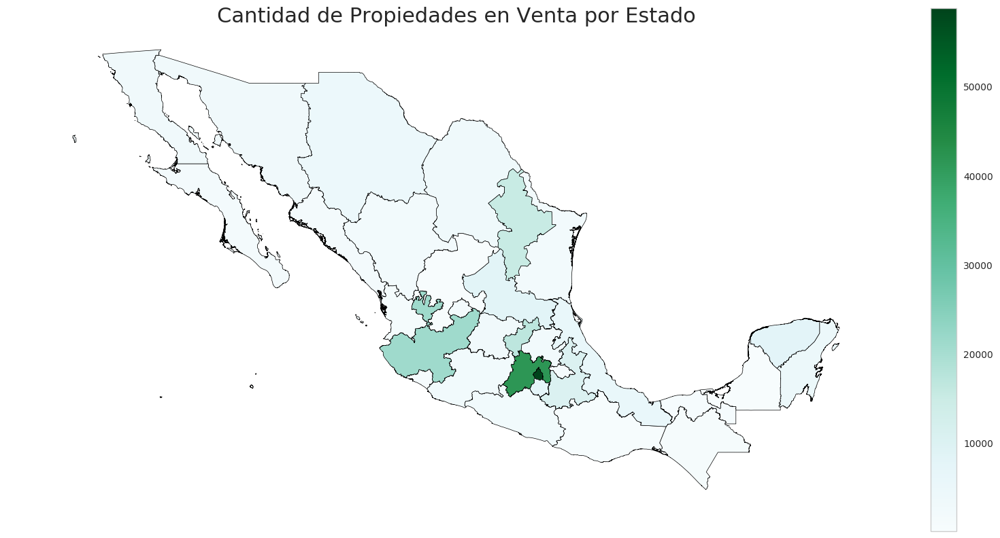

In [34]:
fig, grafico_cantidad_propiedades_provicia = plt.subplots(1, figsize=(20, 10))
cantidad_propiedades_provicia.plot(column='cantidad',cmap='BuGn', edgecolor='black',ax=grafico_cantidad_propiedades_provicia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_propiedades_provicia.axis('off')
grafico_cantidad_propiedades_provicia.set_title("Cantidad de Propiedades en Venta por Estado",fontsize=22)

Se puede observar que en la capital de México (Distrito Federal) es dnnde se encuentran la mayor cantidad  de propiedades en venta, seguida por el Estado de México. Luego puede verse que le sigue Jalisco pero ya con una gran diferencia respecto a los otros dos.

### 3.2) Precio por Provincia

In [35]:
precio_provincia=propiedades.groupby(['provincia']).agg({'precio':'mean'})
precio_provincia=precio_provincia.reset_index()
precio_provincia

,provincia,precio
0,Aguascalientes,1.477189e+06
1,Baja California Norte,7.674418e+05
2,Baja California Sur,1.216453e+06
3,Campeche,1.570918e+06
4,Chiapas,1.924126e+06
5,Chihuahua,1.744531e+06
6,Coahuila,1.505305e+06
7,Colima,1.531380e+06
8,Distrito Federal,3.471705e+06
9,Durango,1.210389e+06


In [36]:
precio_provincia_mex=pd.merge(mex,precio_provincia,on='provincia',how='left')
precio_provincia_mex.fillna(0,inplace=True)
precio_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,precio
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",1.477189e+06
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",7.674418e+05
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",1.570918e+06
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,1.924126e+06
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",1.744531e+06


Text(0.5,1,'Precio Promedio por Estado')

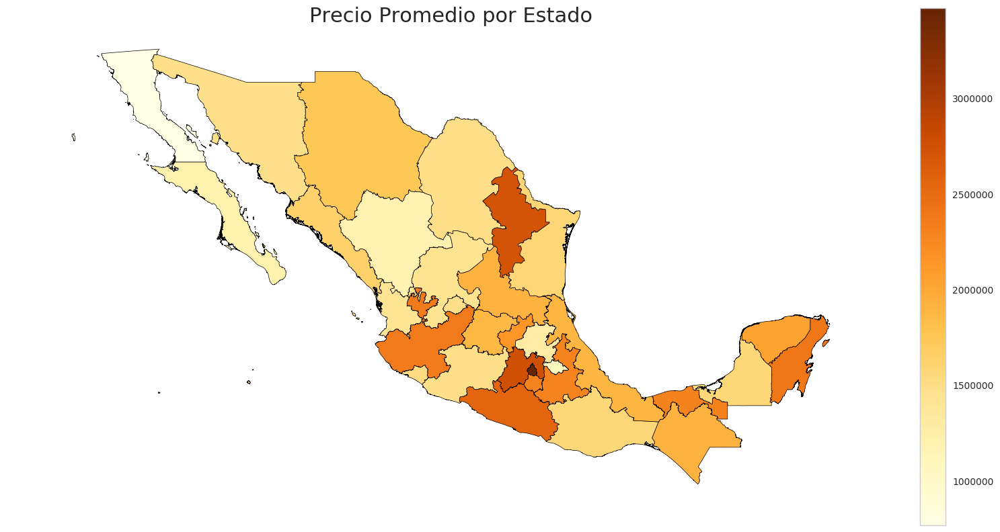

In [56]:
fig, grafico_precio_provincia_mex = plt.subplots(1, figsize=(20, 10))
precio_provincia_mex.plot(column='precio',cmap='YlOrBr', edgecolor='black',ax=grafico_precio_provincia_mex,legend=True,figsize=(30,30),linewidth=0.5)
grafico_precio_provincia_mex.axis('off')
grafico_precio_provincia_mex.set_title("Precio Promedio por Estado",fontsize=22)

Se sigue la tendencia vista en el gráfico anterior, el Distrito Federal es donde se encuentran las propiedades con mayor precio, lo cual tiene sentido ya que estamos hablando de la capital del país. Luego podemos ver que tanto como el Estado de México y Nuevo Leon presentan precios elevados, lo cual resulta peculiar para el segundo ya que, como vimos en el gráfico anterior, no presenta muchas propiedades en venta, por lo cual podemos decir que son las propiedades de Nuevo Leon pueden ser las más costosas.

### 3.3) Precio Promedio de Propiedades por Provincia

In [43]:
cantidad_propiedades.set_index(['provincia'],inplace=True)
cantidad_propiedades.sort_index(inplace=True)
cantidad_propiedades.reset_index(inplace=True)

In [48]:
cantidad_propiedades_precio=pd.merge(cantidad_propiedades,precio_provincia,on='provincia',how='inner')
cantidad_propiedades_precio['precio_propiedad']=cantidad_propiedades_precio['precio']/cantidad_propiedades_precio['cantidad']
cantidad_propiedades_precio.drop(columns={'cantidad','precio'},inplace=True)
cantidad_propiedades_precio

,provincia,precio_propiedad
0,Aguascalientes,842.663303
1,Baja California Norte,238.335947
2,Baja California Sur,715.560483
3,Campeche,5973.071564
4,Chiapas,1708.815027
5,Chihuahua,380.072029
6,Coahuila,407.389837
7,Colima,1519.226351
8,Distrito Federal,59.052646
9,Durango,532.039113


In [49]:
precio_propiedad_provincia_mex=pd.merge(mex,cantidad_propiedades_precio,on='provincia',how='left')
precio_propiedad_provincia_mex.fillna(0,inplace=True)
precio_propiedad_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,precio_propiedad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",842.663303
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",238.335947
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",5973.071564
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,1708.815027
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",380.072029


Text(0.5,1,'Precio Promedio de Propiedades por Estado')

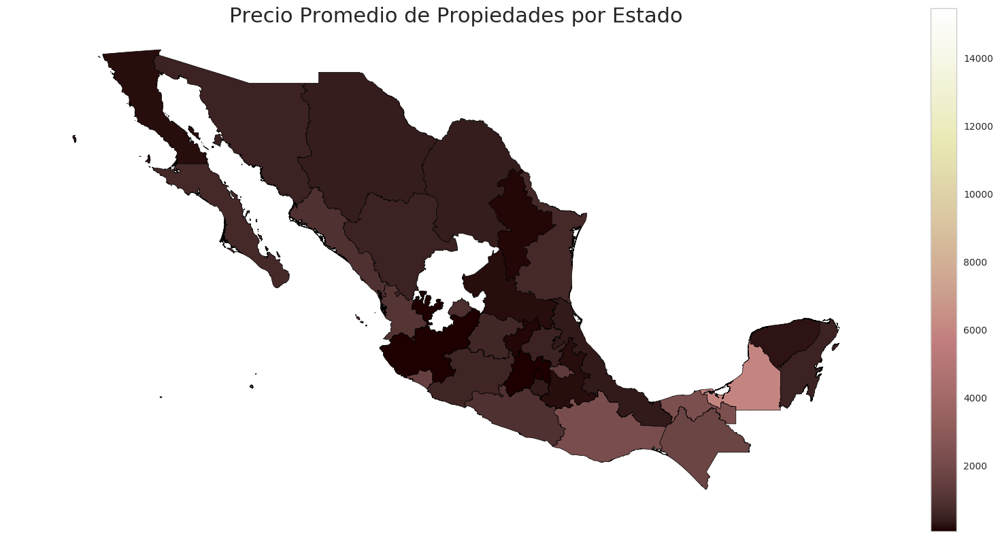

In [55]:
fig, grafico_precio_propiedad_provincia_mex= plt.subplots(1, figsize=(20, 10))
precio_propiedad_provincia_mex.plot(column='precio_propiedad',cmap='pink', edgecolor='black',ax=grafico_precio_propiedad_provincia_mex,legend=True,figsize=(30,30),linewidth=0.5)
grafico_precio_propiedad_provincia_mex.axis('off')
grafico_precio_propiedad_provincia_mex.set_title("Precio Promedio de Propiedades por Estado",fontsize=22)

### 3.4) Tipo de Propiedad por Provincia

#### 3.4.1) Casa

In [57]:
casa=propiedades[(propiedades['tipodepropiedad']=='Casa')]
cantidad_casa_provincia=casa['provincia'].value_counts().reset_index()
cantidad_casa_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_casa_provincia

,provincia,cantidad
0,Edo. de México,25938
1,Distrito Federal,15812
2,Jalisco,14196
3,Nuevo León,11477
4,Querétaro,11396
5,Puebla,6577
6,Yucatán,6472
7,San luis Potosí,5612
8,Morelos,4626
9,Veracruz,4445


In [58]:
cantidad_casa_provincia_mex=pd.merge(mex,cantidad_casa_provincia,on='provincia',how='left')
cantidad_casa_provincia_mex.fillna(0,inplace=True)
cantidad_casa_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",1340
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",2769
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",210
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,903
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",3891


Text(0.5,1,'Cantidad de Casas en Venta por Estado')

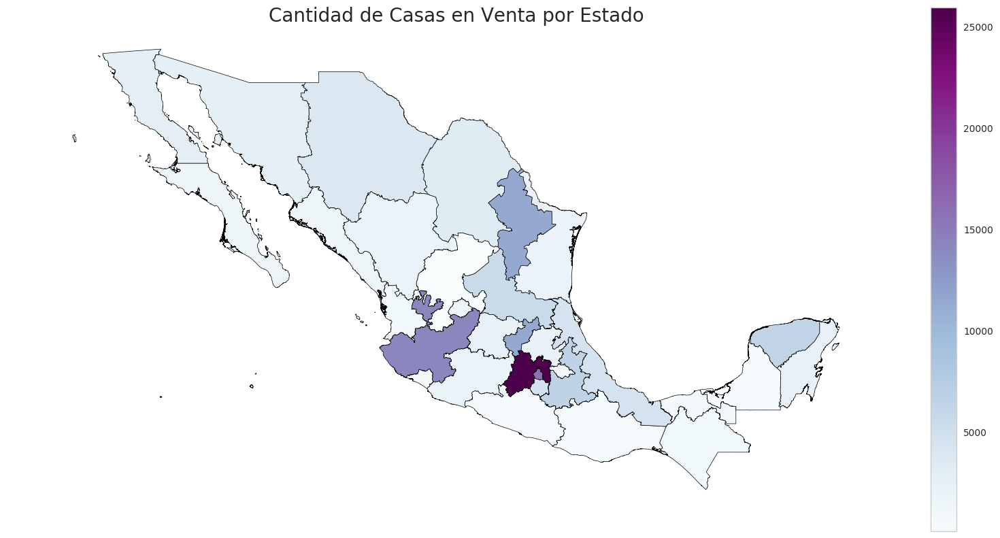

In [59]:
fig, grafico_cantidad_casa_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_casa_provincia_mex.plot(column='cantidad',cmap='BuPu', edgecolor='black',ax=grafico_cantidad_casa_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_casa_provincia.axis('off')
grafico_cantidad_casa_provincia.set_title("Cantidad de Casas en Venta por Estado",fontsize=20)

Podemos observar que en el Estado de México es donde se encuentran la mayor cantidad de casas puestas a la venta, mientras que el Distrito Federal le sigue, lo cual tiene sentido ya que el centro de una Ciudad (y también pais en este caso) se encuentra asociado a que se encuentren mayor cantidad de Apartamentos y/o Edificios, mientras que en la perfisferia suelen encontrarse mayor cantidad de casas, caso similar ocurre en la Argentina.

#### 3.4.2) Apartamento

In [61]:
apartamento=propiedades[(propiedades['tipodepropiedad']=='Apartamento')]
cantidad_apartamento_provincia=apartamento['provincia'].value_counts().reset_index()
cantidad_apartamento_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_apartamento_provincia

,provincia,cantidad
0,Distrito Federal,33839
1,Edo. de México,8297
2,Jalisco,2638
3,Nuevo León,1847
4,San luis Potosí,1686
5,Guerrero,1586
6,Puebla,1522
7,Quintana Roo,1273
8,Querétaro,1084
9,Morelos,859


In [62]:
cantidad_apartamento_provincia_mex=pd.merge(mex,cantidad_apartamento_provincia,on='provincia',how='left')
cantidad_apartamento_provincia_mex.fillna(0,inplace=True)
cantidad_apartamento_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",47
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",196
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",7
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,52
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",41


Text(0.5,1,'Cantidad de Apartamentos en Venta por Estado')

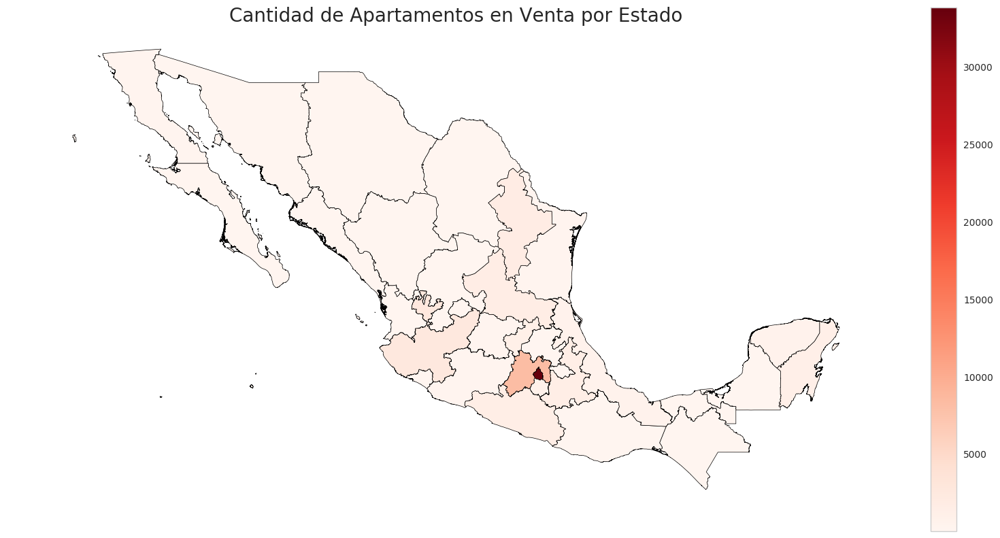

In [63]:
fig, grafico_cantidad_apartamento_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_apartamento_provincia_mex.plot(column='cantidad',cmap='Reds', edgecolor='black',ax=grafico_cantidad_apartamento_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_apartamento_provincia.axis('off')
grafico_cantidad_apartamento_provincia.set_title("Cantidad de Apartamentos en Venta por Estado",fontsize=20)

Como lo habíamos imaginado, en relación a los Apartamentos, el Distrito Federal se impone por mucho con las demas provincias, lo cuál confirma lo que habíamos previsto en el gráfico anterior. Luego le sigue el Estado De México, lo cuál también tiene sentido ya que se encuentra en la perfisferia de la capital del país.

#### 3.4.3) Edificio

In [64]:
edificio=propiedades[(propiedades['tipodepropiedad']=='Edificio')]
cantidad_edificio_provincia=edificio['provincia'].value_counts().reset_index()
cantidad_edificio_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_edificio_provincia

,provincia,cantidad
0,Distrito Federal,616
1,Edo. de México,246
2,Jalisco,65
3,Quintana Roo,61
4,Veracruz,56
5,Nuevo León,52
6,Querétaro,34
7,Chihuahua,27
8,Puebla,26
9,Sinaloa,17


In [65]:
cantidad_edificio_provincia_mex=pd.merge(mex,cantidad_edificio_provincia,on='provincia',how='left')
cantidad_edificio_provincia_mex.fillna(0,inplace=True)
cantidad_edificio_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",6.0
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",0.0
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",1.0
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,13.0
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",27.0


Text(0.5,1,'Cantidad de Edificios en Venta por Estado')

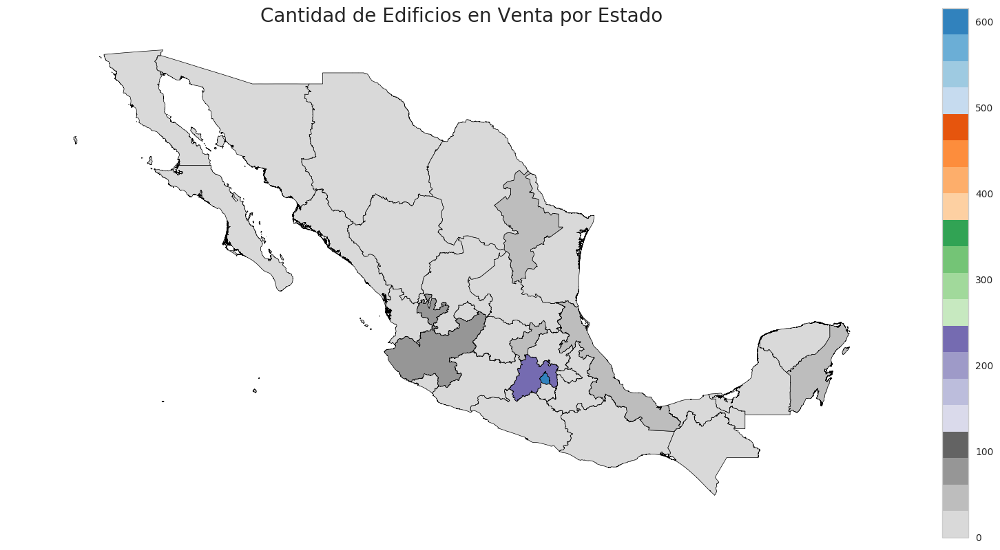

In [66]:
fig, grafico_cantidad_edificio_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_edificio_provincia_mex.plot(column='cantidad',cmap='tab20c_r', edgecolor='black',ax=grafico_cantidad_edificio_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_edificio_provincia.axis('off')
grafico_cantidad_edificio_provincia.set_title("Cantidad de Edificios en Venta por Estado",fontsize=20)

Sigue con la tendencia vista en los Apartamentos, predomina el Distrito Federal, seguido pero desde muy lejos por el Estado de México.

#### 3.4.4) Terreno

In [67]:
terreno=propiedades[(propiedades['tipodepropiedad']=='Terreno')]
cantidad_terreno_provincia=terreno['provincia'].value_counts().reset_index()
cantidad_terreno_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_terreno_provincia

,provincia,cantidad
0,Distrito Federal,1677
1,Jalisco,1237
2,Querétaro,1223
3,Edo. de México,1156
4,Nuevo León,624
5,Puebla,603
6,Veracruz,422
7,San luis Potosí,390
8,Quintana Roo,284
9,Yucatán,250


In [68]:
cantidad_terreno_provincia_mex=pd.merge(mex,cantidad_terreno_provincia,on='provincia',how='left')
cantidad_terreno_provincia_mex.fillna(0,inplace=True)
cantidad_terreno_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",86
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",24
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",20
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,100
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",230


Text(0.5,1,'Cantidad de Terrenos en Venta por Estado')

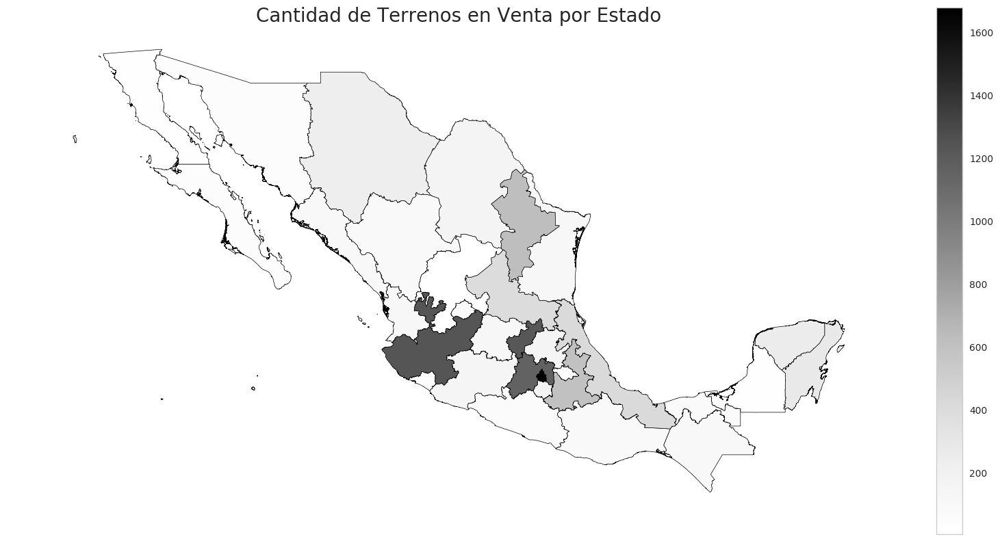

In [69]:
fig, grafico_cantidad_terreno_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_terreno_provincia_mex.plot(column='cantidad',cmap='Greys', edgecolor='black',ax=grafico_cantidad_terreno_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_terreno_provincia.axis('off')
grafico_cantidad_terreno_provincia.set_title("Cantidad de Terrenos en Venta por Estado",fontsize=20)

En este caso, resulta extraño que la mayor cantidad de Terrenos puestos en venta se encuentren en el Distito Federal pero, a la vez, no es extraño en lo absoluto, debido a que tiene sentido que se quiera vender el Terreno, ya que puede ser vendido a ciertas empresas que lo utilizarían para realizar tanto Apartamentos como Edificios o tambien para ser utilizado como Oficinas.

#### 3.4.5) Local Comercial

In [74]:
local_comercial=propiedades[(propiedades['tipodepropiedad']=='Local Comercial')]
cantidad_local_comercial=local_comercial['provincia'].value_counts().reset_index()
cantidad_local_comercial.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_local_comercial

,provincia,cantidad
0,Distrito Federal,471
1,Nuevo León,421
2,Jalisco,397
3,Edo. de México,292
4,Querétaro,235
5,Chihuahua,223
6,Puebla,110
7,San luis Potosí,102
8,Yucatán,98
9,Quintana Roo,90


In [75]:
cantidad_local_comercial_provincia_mex=pd.merge(mex,cantidad_local_comercial,on='provincia',how='left')
cantidad_local_comercial_provincia_mex.fillna(0,inplace=True)
cantidad_local_comercial_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",31
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",17
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",7
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,16
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",223


Text(0.5,1,'Cantidad de Locales Comerciales en Venta por Estado')

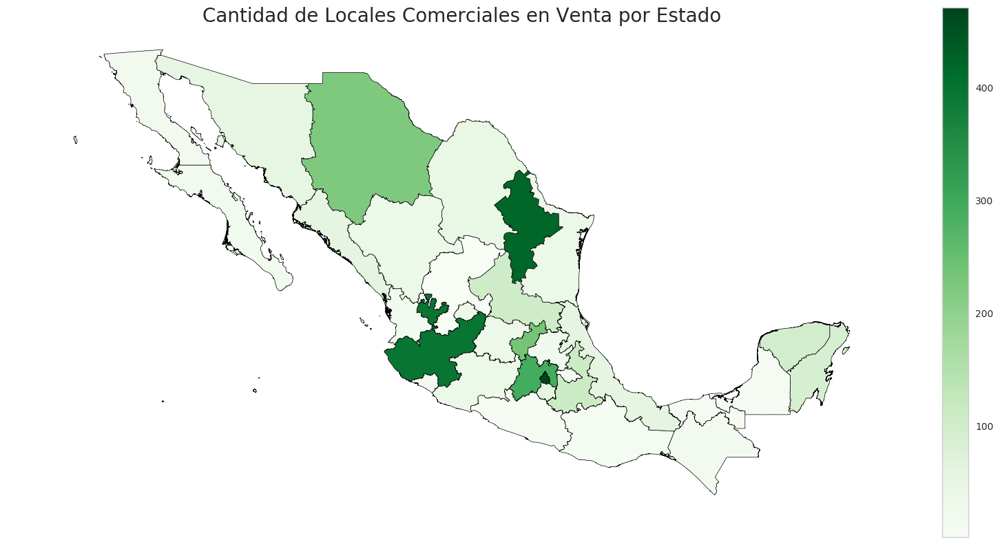

In [76]:
fig, grafico_cantidad_local_comercial_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_local_comercial_provincia_mex.plot(column='cantidad',cmap='Greens', edgecolor='black',ax=grafico_cantidad_local_comercial_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_local_comercial_provincia.axis('off')
grafico_cantidad_local_comercial_provincia.set_title("Cantidad de Locales Comerciales en Venta por Estado",fontsize=20)

Ningún tipo de sopresa alguna, siguen imponiendose los mismas provincias de siempre pero aquí se agrega la provincia de Chihuahua.

#### 3.4.5) Oficinas Comerciales

In [80]:
oficina_comercial=propiedades[(propiedades['tipodepropiedad']=='Oficina comercial')]
cantidad_oficina_comercial=oficina_comercial['provincia'].value_counts().reset_index()
cantidad_oficina_comercial.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_oficina_comercial

,provincia,cantidad
0,Distrito Federal,736
1,Nuevo León,164
2,Edo. de México,145
3,Jalisco,137
4,Querétaro,119
5,Puebla,74
6,Yucatán,62
7,San luis Potosí,62
8,Chihuahua,34
9,Veracruz,31


In [81]:
cantidad_oficina_comercial_provincia_mex=pd.merge(mex,cantidad_oficina_comercial,on='provincia',how='left')
cantidad_oficina_comercial_provincia_mex.fillna(0,inplace=True)
cantidad_oficina_comercial_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",3.0
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",0.0
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",0.0
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,5.0
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",34.0


Text(0.5,1,'Cantidad de Oficinas Comerciales en Venta por Estado')

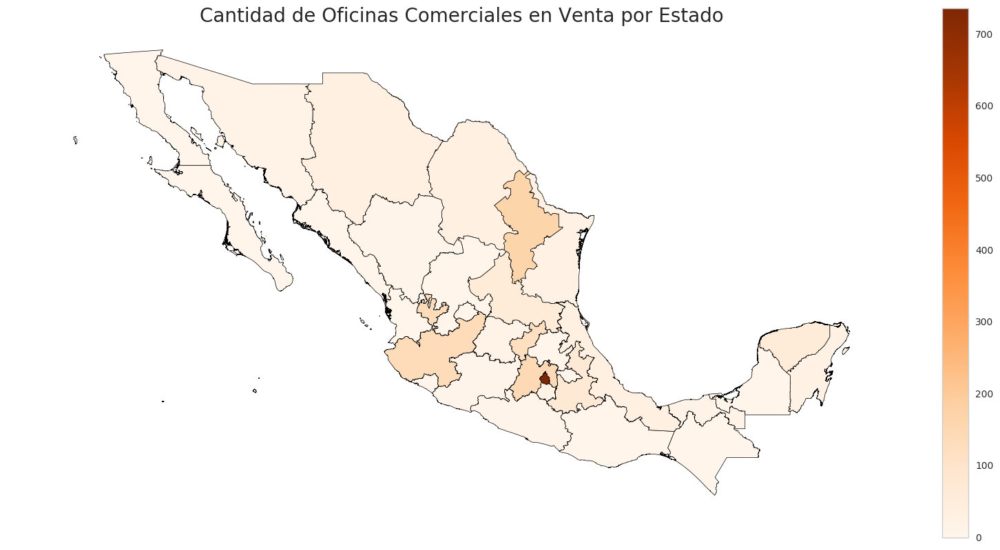

In [82]:
fig, grafico_cantidad_oficina_comercial_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_oficina_comercial_provincia_mex.plot(column='cantidad',cmap='Oranges', edgecolor='black',ax=grafico_cantidad_oficina_comercial_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_oficina_comercial_provincia.axis('off')
grafico_cantidad_oficina_comercial_provincia.set_title("Cantidad de Oficinas Comerciales en Venta por Estado",fontsize=20)

Como lo habíamos previsto, la mayor cantidad de oficinas en venta se encuentra en el Distrito Federal.

#### 3.4.6) Duplex

In [84]:
duplex=propiedades[(propiedades['tipodepropiedad']=='Duplex')]
cantidad_duplex=duplex['provincia'].value_counts().reset_index()
cantidad_duplex.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_duplex

,provincia,cantidad
0,Edo. de México,148
1,Jalisco,46
2,Distrito Federal,43
3,Querétaro,27
4,Baja California Norte,23
5,Puebla,21
6,Michoacán,9
7,Morelos,7
8,Nuevo León,5
9,Hidalgo,4


In [85]:
cantidad_duplex_provincia_mex=pd.merge(mex,cantidad_duplex,on='provincia',how='left')
cantidad_duplex_provincia_mex.fillna(0,inplace=True)
cantidad_duplex_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",0.0
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",23.0
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",0.0
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,1.0
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",0.0


Text(0.5,1,'Cantidad de Duplex en Venta por Estado')

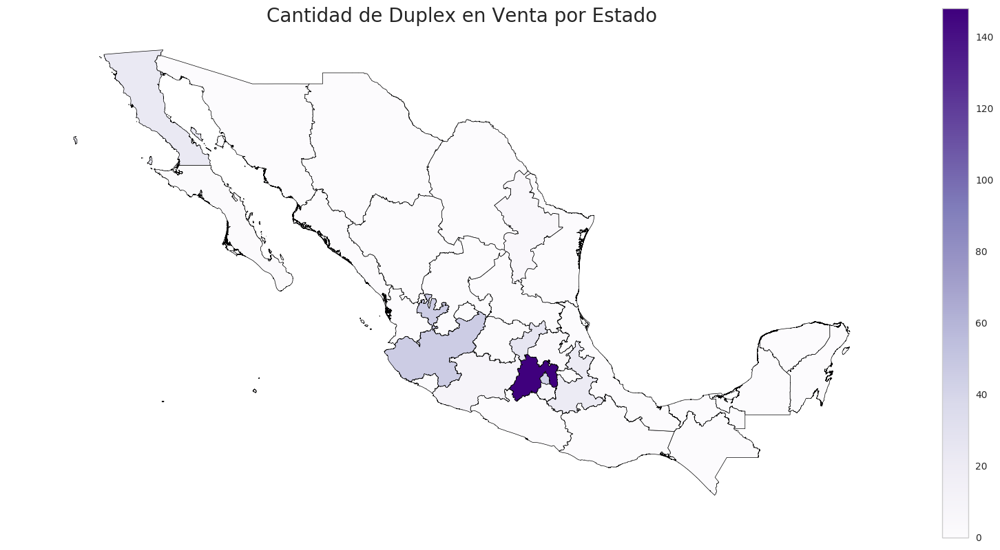

In [86]:
fig, grafico_cantidad_duplex_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_duplex_provincia_mex.plot(column='cantidad',cmap='Purples', edgecolor='black',ax=grafico_cantidad_duplex_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_duplex_provincia.axis('off')
grafico_cantidad_duplex_provincia.set_title("Cantidad de Duplex en Venta por Estado",fontsize=20)

Se puede ver que la provincia que tiene la mayor cantidad de Duplex en venta es el Estado de México, lo cual nuevamente, no parece que sea al azar.

### 3.5) Antigüedad por Provincia

In [126]:
antiguedad=propiedades[['provincia','antiguedad']].copy()
antiguedad.dropna(inplace=True)
antiguedad_provincia=antiguedad.groupby(['provincia']).agg({'antiguedad':'mean'})
antiguedad_provincia.reset_index(inplace=True)
antiguedad_provincia

,provincia,antiguedad
0,Aguascalientes,7.524580
1,Baja California Norte,5.788405
2,Baja California Sur,2.459770
3,Campeche,3.914573
4,Chiapas,5.412871
5,Chihuahua,6.518198
6,Coahuila,6.306214
7,Colima,5.674877
8,Distrito Federal,12.189608
9,Durango,4.993980


In [127]:
antiguedad_provincias_mex=pd.merge(mex,antiguedad_provincia,on='provincia',how='left')
antiguedad_provincias_mex.fillna(0,inplace=True)
antiguedad_provincias_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,antiguedad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",7.524580
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",5.788405
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",3.914573
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,5.412871
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",6.518198


Text(0.5,1,'Promedio de Antigüedad de las Propiedades por Estado')

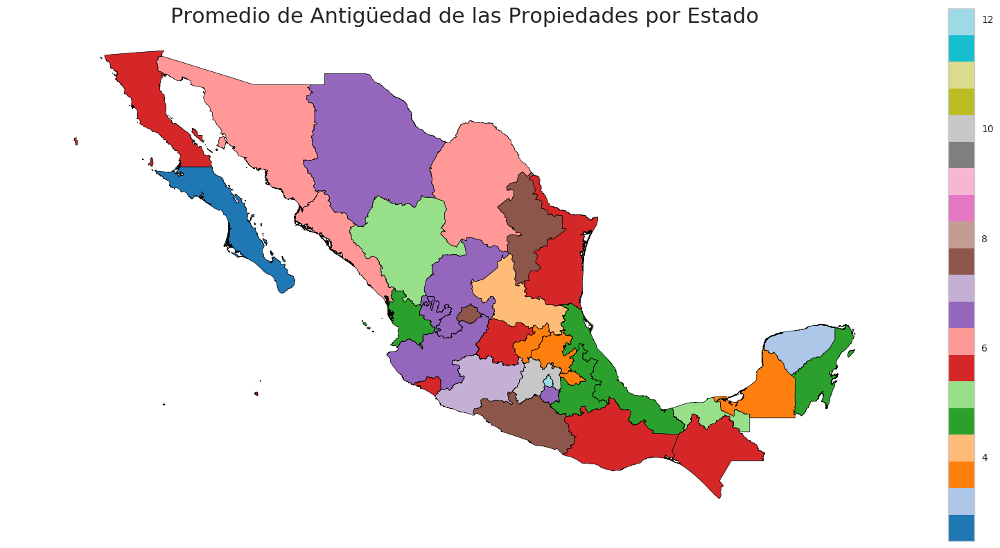

In [128]:
fig, grafico_antiguedad_provincias = plt.subplots(1, figsize=(20, 10))
antiguedad_provincias_mex.plot(column='antiguedad',cmap='tab20', edgecolor='black',ax=grafico_antiguedad_provincias,legend=True,figsize=(30,30),linewidth=0.5)
grafico_antiguedad_provincias.axis('off')
grafico_antiguedad_provincias.set_title("Promedio de Antigüedad de las Propiedades por Estado",fontsize=22)

## 4) Anexos

Ahora haremos un análisis acerca de las cosas que puden o no tener las propiedades o que cosas tienen próximas o no.

### 4.1) Análisis General

In [87]:
#Contamos la cantidad de cada uno
cant_sum=propiedades['usosmultiples'].value_counts().sort_index().reset_index()
cant_gim=propiedades['gimnasio'].value_counts().sort_index().reset_index()
cant_piscina=propiedades['piscina'].value_counts().sort_index().reset_index()
cant_escuelas=propiedades['escuelascercanas'].value_counts().sort_index().reset_index()
cant_centros=propiedades['centroscomercialescercanos'].value_counts().sort_index().reset_index()

In [89]:
#Los juntmos todos en un solo dataframe
cantidad_total=pd.merge(cant_sum,cant_gim,on='index',how='inner')
cantidad_total=pd.merge(cantidad_total,cant_piscina,on='index',how='inner')
cantidad_total=pd.merge(cantidad_total,cant_escuelas,on='index',how='inner')
cantidad_total=pd.merge(cantidad_total,cant_centros,on='index',how='inner')

In [90]:
#Renombramos los index y reemplazamos los valores para que tengan sentido
cantidad_total['index'].replace({0.0:'NO',1.0:'SI'},inplace=True)
cantidad_total.rename(columns={'index':'Hay','usosmultiples':'SUM','gimnasio':'Gimnasio','piscina':'Piscina','escuelascercanas':'Escuelas','centroscomercialescercanos':'Centros'},inplace=True)
cantidad_total.set_index('Hay',inplace=True)
cantidad_total

,SUM,Gimnasio,Piscina,Escuelas,Centros
Hay,,,,,
NO,226778,225006,219028,133406,144832
SI,13222,14994,20972,106594,95168


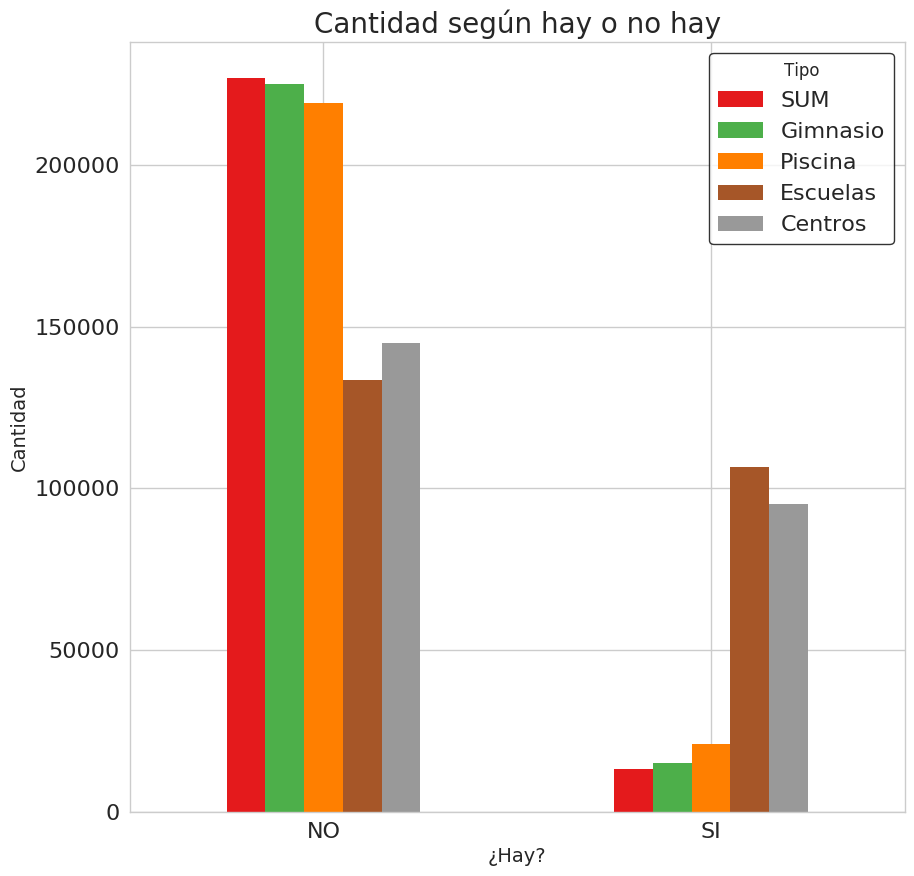

In [91]:
grafico_cantidad_total=cantidad_total.plot(kind='bar',cmap='Set1',figsize=(10,10),fontsize=16,rot=0)
grafico_cantidad_total.set_title("Cantidad según hay o no hay",fontsize=20)
grafico_cantidad_total.set_xlabel("¿Hay?",fontsize=14)
grafico_cantidad_total.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(fontsize=16,title='Tipo',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

Se puede ver que en la mayoria predomina el no, en los anexos más extraños, tales como el SUM o el Gimnasio, la brecha entre el No y el Si es muy grande mientras que en algo más común, como las Escuelas Cercanas o los Centros Comerciales cercanos suele haber una diferencia más pequeña. Ahora analizaremos cada uno individualmente.

### 4.2) Análisis Individual

#### 4.2.1) Piscina

In [107]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
piscina=propiedades[['lat','lng','piscina']].copy()
piscina.dropna(inplace=True)
piscina_cerca=piscina[(piscina['piscina']==1.0)]
filtrado_piscina_cerca=piscina_cerca[(piscina_cerca['lat']<=lat_maxima) & (piscina_cerca['lat']>=lat_minima) & (piscina_cerca['lng']<=lng_maxima) & (piscina_cerca['lng']>=lng_minima)]
filtrado_piscina_cerca.head()

,lat,lng,piscina
64,19.334247,-99.242254,1
68,18.799324,-99.202627,1
82,20.646004,-100.352765,1
101,18.932857,-99.230038,1
135,19.415436,-99.170290,1


In [109]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_piscina_cerca['lng'], filtrado_piscina_cerca['lat'])]
coordenadas_piscina_cerca = gpd.GeoDataFrame(filtrado_piscina_cerca, geometry=geometry)   
coordenadas_piscina_cerca.head()

,lat,lng,piscina,geometry
64,19.334247,-99.242254,1,POINT (-99.24225350577393 19.33424659180134)
68,18.799324,-99.202627,1,POINT (-99.20262683809813 18.79932411040545)
82,20.646004,-100.352765,1,POINT (-100.3527645060547 20.6460038109047)
101,18.932857,-99.230038,1,POINT (-99.2300376 18.932856566667)
135,19.415436,-99.170290,1,POINT (-99.1702903126892 19.41543640641217)


Text(0.5,1,'Distribución de Propiedades con Piscina por Estado')

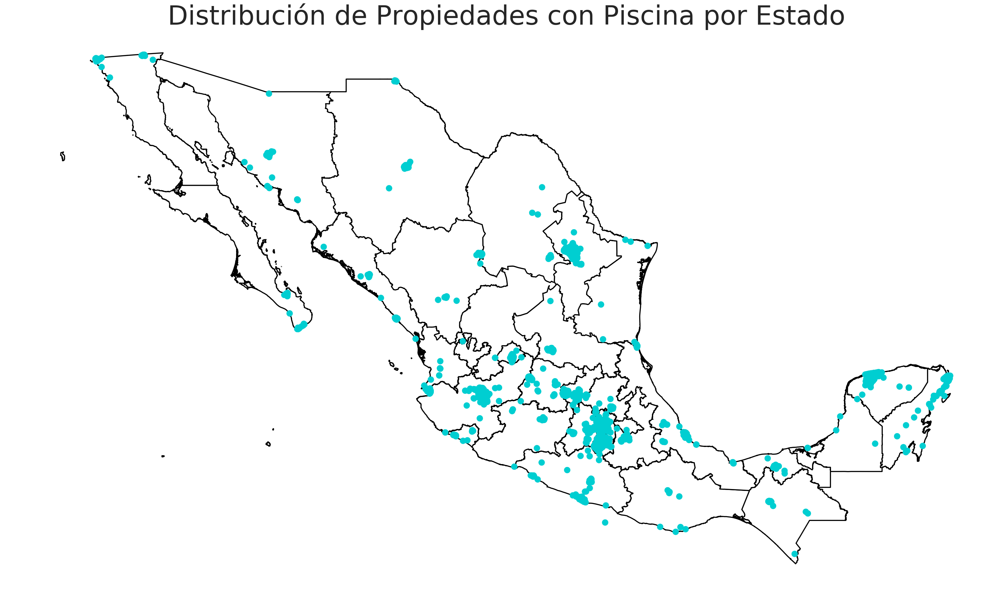

In [110]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_piscinas=coordenadas_piscina_cerca.plot(column='piscina',cmap=ListedColormap('darkturquoise'),ax=ax,markersize=200)
grafico_piscinas.set_title("Distribución de Propiedades con Piscina por Estado",fontsize=60)

Podemos ver que la mayor cantidad de propiedades con Piscina se encuentran en el Distrito Federal y Estado de México. Así mismo, también se hay varias en Jalisco, Nuevo León, Yucatán y Quintana Roo.

#### 4.2.2) Escuelas Cercanas

In [111]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
escuelas=propiedades[['lat','lng','escuelascercanas']].copy()
escuelas.dropna(inplace=True)
escuelas_cerca=escuelas[(escuelas['escuelascercanas']==1.0)]
filtrado_escuelas_cerca=escuelas_cerca[(escuelas_cerca['lat']<=lat_maxima) & (escuelas_cerca['lat']>=lat_minima) & (escuelas_cerca['lng']<=lng_maxima) & (escuelas_cerca['lng']>=lng_minima)]
filtrado_escuelas_cerca.head()

,lat,lng,escuelascercanas
1,19.310205,-99.227655,1
3,19.301890,-99.688015,1
10,22.195878,-101.018956,1
12,20.682878,-100.317503,1
16,20.708760,-100.459303,1


In [112]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_escuelas_cerca['lng'], filtrado_escuelas_cerca['lat'])]
coordenadas_escuelas_cerca = gpd.GeoDataFrame(filtrado_escuelas_cerca, geometry=geometry)   
coordenadas_escuelas_cerca.head()

,lat,lng,escuelascercanas,geometry
1,19.310205,-99.227655,1,POINT (-99.2276548 19.3102045)
3,19.301890,-99.688015,1,POINT (-99.6880151 19.3018899)
10,22.195878,-101.018956,1,POINT (-101.0189558599075 22.19587786422682)
12,20.682878,-100.317503,1,POINT (-100.3175029752441 20.68287811087097)
16,20.708760,-100.459303,1,POINT (-100.45930315734 20.708759543088)


Text(0.5,1,'Distribución de Propiedades con Escuelas Cercanas por Estado')

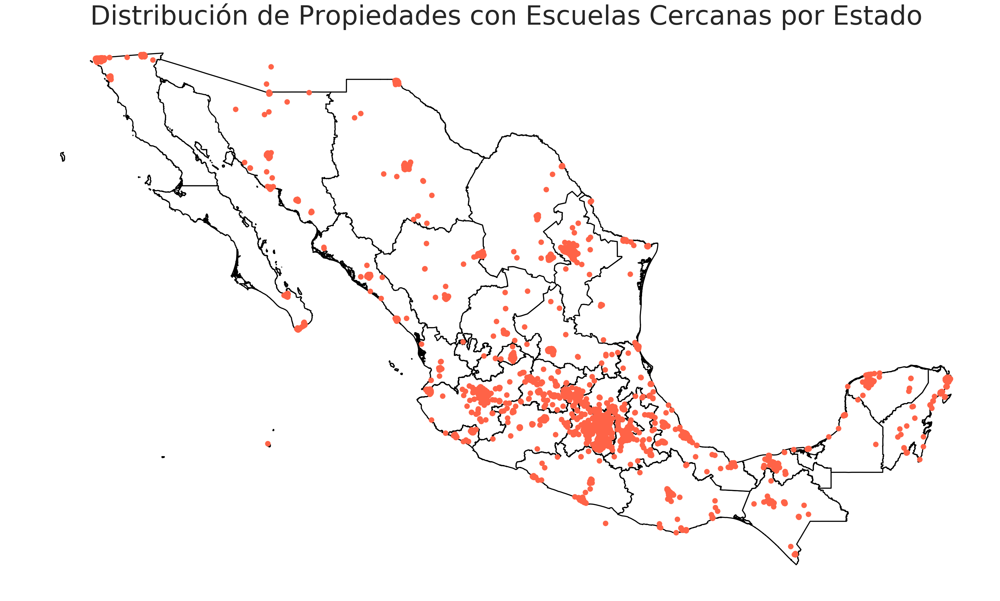

In [113]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_escuelas=coordenadas_escuelas_cerca.plot(column='escuelascercanas',cmap=ListedColormap('tomato'),ax=ax,markersize=150)
grafico_escuelas.set_title("Distribución de Propiedades con Escuelas Cercanas por Estado",fontsize=60)

Se puede ver que cuanto más cerca se encuentran del centro del País, mayor probabilidad de tener una Escuela Cerca hay, a medida que nos vamos alejando podemos ver que ya la cantidad de Escuelas disminuye. Así mismo, se puede ver que donde menor cantidad de Escuelas Cercanas hay es en la frontera entre Baja California Norte y Sur, ya que se encuentran solamente en la parte Sur de Baja California Sur y en el Norte de Baja California Norte.

#### 4.2.3) Centros Comerciales Cercanos

In [114]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
centros_comerciales=propiedades[['lat','lng','centroscomercialescercanos']].copy()
centros_comerciales.dropna(inplace=True)
centros_comerciales_cerca=centros_comerciales[(centros_comerciales['centroscomercialescercanos']==1.0)]
filtrado_centros_comerciales_cerca=centros_comerciales_cerca[(centros_comerciales_cerca['lat']<=lat_maxima) & (centros_comerciales_cerca['lat']>=lat_minima) & (centros_comerciales_cerca['lng']<=lng_maxima) & (centros_comerciales_cerca['lng']>=lng_minima)]
filtrado_centros_comerciales_cerca.head()

,lat,lng,centroscomercialescercanos
1,19.310205,-99.227655,1
3,19.301890,-99.688015,1
5,19.300612,-99.148475,1
10,22.195878,-101.018956,1
12,20.682878,-100.317503,1


In [115]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_centros_comerciales_cerca['lng'], filtrado_centros_comerciales_cerca['lat'])]
coordenadas_centros_comerciales_cerca = gpd.GeoDataFrame(filtrado_centros_comerciales_cerca, geometry=geometry)   
coordenadas_centros_comerciales_cerca.head()

,lat,lng,centroscomercialescercanos,geometry
1,19.310205,-99.227655,1,POINT (-99.2276548 19.3102045)
3,19.301890,-99.688015,1,POINT (-99.6880151 19.3018899)
5,19.300612,-99.148475,1,POINT (-99.14847480000005 19.300612)
10,22.195878,-101.018956,1,POINT (-101.0189558599075 22.19587786422682)
12,20.682878,-100.317503,1,POINT (-100.3175029752441 20.68287811087097)


Text(0.5,1,'Distribución de Propiedades con Centros Comerciales Cercanos por Estado')

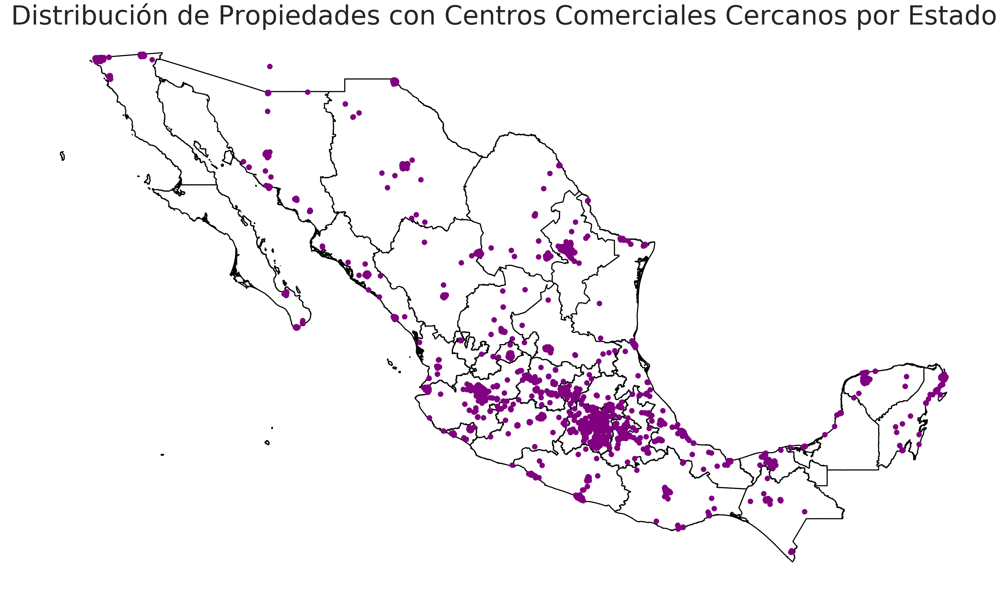

In [116]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_centros_comerciales=coordenadas_centros_comerciales_cerca.plot(column='centroscomercialescercanos',cmap=ListedColormap('purple'),ax=ax,markersize=150)
grafico_centros_comerciales.set_title("Distribución de Propiedades con Centros Comerciales Cercanos por Estado",fontsize=60)

Se puede ver que sigue la misma tendencia que se vió con las Escuelas, cuanto más cerca la propiedad se encuentra del centro del País, mayor es la probabilidad de que tenga un Centro Comercial cerca.

#### 4.2.4) Gimnasio

In [119]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
gimnasio=propiedades[['lat','lng','gimnasio']].copy()
gimnasio.dropna(inplace=True)
gimnasio_cerca=gimnasio[(gimnasio['gimnasio']==1)]
filtrado_gimnasio_cerca=gimnasio_cerca[(gimnasio_cerca['lat']<=lat_maxima) & (gimnasio_cerca['lat']>=lat_minima) & (gimnasio_cerca['lng']<=lng_maxima) & (gimnasio_cerca['lng']>=lng_minima)]
filtrado_gimnasio_cerca.head()

,lat,lng,gimnasio
64,19.334247,-99.242254,1
100,19.339452,-99.238162,1
135,19.415436,-99.170290,1
138,19.459710,-99.180036,1
166,20.572958,-103.465309,1


In [120]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_gimnasio_cerca['lng'], filtrado_gimnasio_cerca['lat'])]
coordenadas_gimnasio_cerca = gpd.GeoDataFrame(filtrado_gimnasio_cerca, geometry=geometry)   
coordenadas_gimnasio_cerca.head()

,lat,lng,gimnasio,geometry
64,19.334247,-99.242254,1,POINT (-99.24225350577393 19.33424659180134)
100,19.339452,-99.238162,1,POINT (-99.23816190000002 19.3394521)
135,19.415436,-99.170290,1,POINT (-99.1702903126892 19.41543640641217)
138,19.459710,-99.180036,1,POINT (-99.18003640000001 19.4597103)
166,20.572958,-103.465309,1,POINT (-103.4653090294434 20.5729581695714)


Text(0.5,1,'Distribución de Propiedades con Gimnasio por Estado')

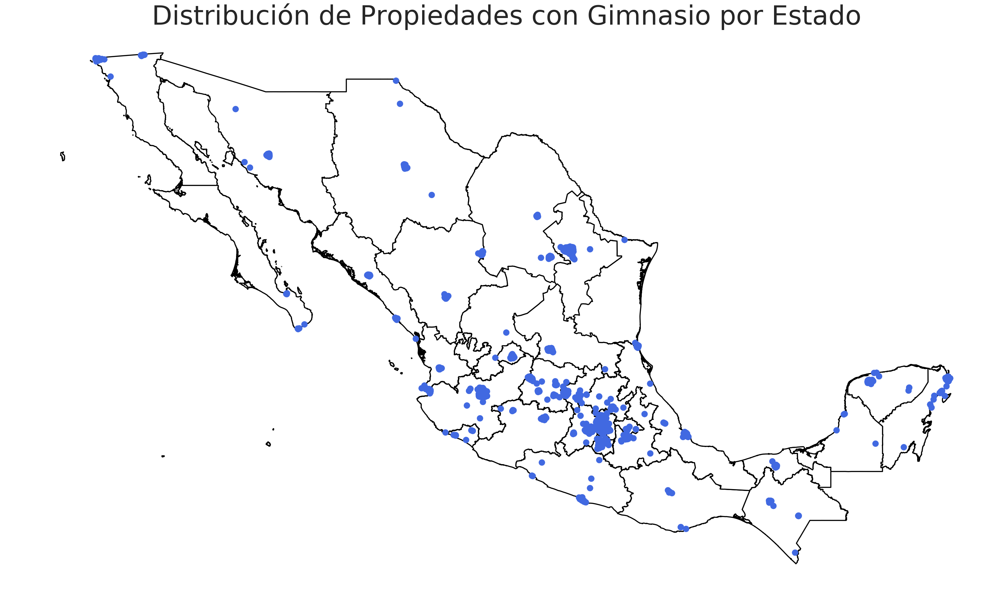

In [121]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_gimnasio=coordenadas_gimnasio_cerca.plot(column='gimnasio',cmap=ListedColormap('royalblue'),ax=ax,markersize=200)
grafico_gimnasio.set_title("Distribución de Propiedades con Gimnasio por Estado",fontsize=60)

#### 4.2.5) SUM

In [122]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
SUM=propiedades[['lat','lng','usosmultiples']].copy()
SUM.dropna(inplace=True)
SUM_cerca=SUM[(SUM['usosmultiples']==1)]
filtrado_SUM_cerca=SUM_cerca[(SUM_cerca['lat']<=lat_maxima) & (SUM_cerca['lat']>=lat_minima) & (SUM_cerca['lng']<=lng_maxima) & (SUM_cerca['lng']>=lng_minima)]
filtrado_SUM_cerca.head()

,lat,lng,usosmultiples
12,20.682878,-100.317503,1
31,18.969631,-98.238497,1
34,19.408373,-99.267617,1
64,19.334247,-99.242254,1
82,20.646004,-100.352765,1


In [123]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_SUM_cerca['lng'], filtrado_SUM_cerca['lat'])]
coordenadas_SUM_cerca = gpd.GeoDataFrame(filtrado_SUM_cerca, geometry=geometry)   
coordenadas_SUM_cerca.head()

,lat,lng,usosmultiples,geometry
12,20.682878,-100.317503,1,POINT (-100.3175029752441 20.68287811087097)
31,18.969631,-98.238497,1,POINT (-98.23849673333299 18.969630533333)
34,19.408373,-99.267617,1,POINT (-99.2676171 19.4083735)
64,19.334247,-99.242254,1,POINT (-99.24225350577393 19.33424659180134)
82,20.646004,-100.352765,1,POINT (-100.3527645060547 20.6460038109047)


Text(0.5,1,'Distribución de Propiedades con SUM por Estado')

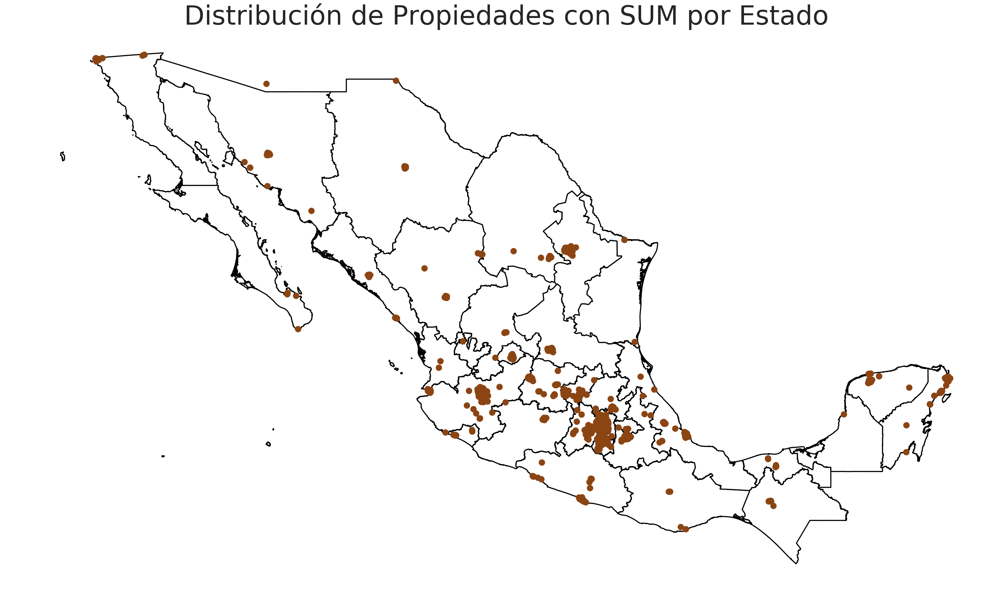

In [124]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_SUM=coordenadas_SUM_cerca.plot(column='usosmultiples',cmap=ListedColormap('saddlebrown'),ax=ax,markersize=200)
grafico_SUM.set_title("Distribución de Propiedades con SUM por Estado",fontsize=60)

#### 4.2.6) SUM y Gimnasio

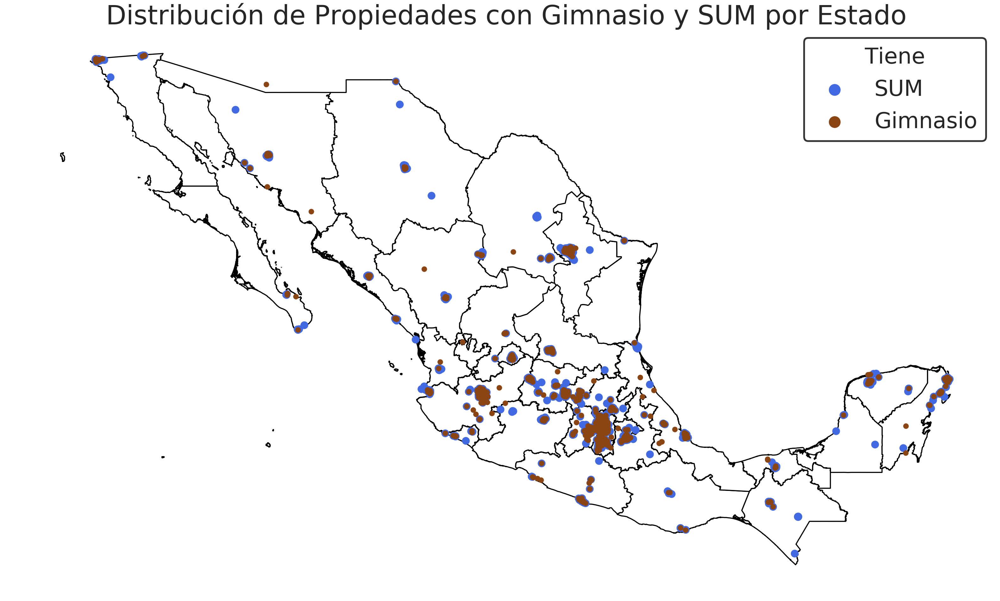

In [125]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_gimnasio=coordenadas_gimnasio_cerca.plot(column='gimnasio',cmap=ListedColormap('royalblue'),ax=ax,markersize=300)
grafico_SUM=coordenadas_SUM_cerca.plot(column='usosmultiples',cmap=ListedColormap('saddlebrown'),ax=ax,markersize=150)
grafico_gimnasio.set_title("Distribución de Propiedades con Gimnasio y SUM por Estado",fontsize=60)
leyenda=plt.legend(['SUM','Gimnasio'],fontsize=50,frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.set_title("Tiene",prop=dict(size=50))
leyenda.legendHandles[0]._sizes = [700]
leyenda.legendHandles[1]._sizes = [700]
leyenda.get_frame().set_linewidth(4.0)

## 5) Precio

### 5.1) Por Tipo de Propiedad

In [97]:
#Nos quedamos con el precio de solamente los 10 primeros tipo
tipo_precio=propiedades[['tipodepropiedad','precio']].copy()
tipo_precio.dropna(subset=['tipodepropiedad'],inplace=True)
tipo_precio_top=pd.merge(tipo_precio,tipo_propiedad_top,on='tipodepropiedad',how='inner')
tipo_precio_top.head()

,tipodepropiedad,precio
0,Apartamento,2273000.0
1,Apartamento,1150000.0
2,Apartamento,1100000.0
3,Apartamento,310000.0
4,Apartamento,7200000.0


Text(0.5,0,'Tipo de Propiedad')

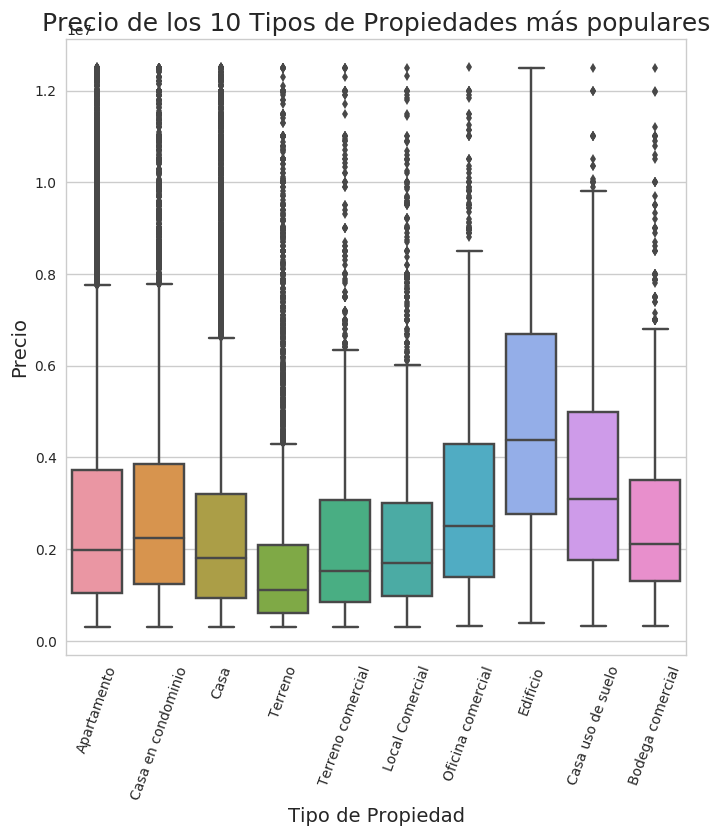

In [98]:
plt.subplots(figsize=(8,8))
grafico_tipo_precio_top=sns.boxplot(y=tipo_precio_top['precio'],x=tipo_precio_top['tipodepropiedad'])
grafico_tipo_precio_top.set_xticklabels(grafico_tipo_precio_top.get_xticklabels(),rotation=70)
grafico_tipo_precio_top.set_title("Precio de los 10 Tipos de Propiedades más populares",fontsize=18)
grafico_tipo_precio_top.set_ylabel("Precio",fontsize=14)
grafico_tipo_precio_top.set_xlabel("Tipo de Propiedad",fontsize=14)

### 5.2) Por Antigüedad

In [27]:
antiguedad_precio=propiedades[['antiguedad','precio']].copy()
antiguedad_precio.dropna(inplace=True)
group_antiguedad_precio=antiguedad_precio.groupby(['antiguedad']).agg({'precio':'mean'})
group_antiguedad_precio.head()

,precio
antiguedad,
0.0,2.478479e+06
1.0,2.635363e+06
2.0,2.790816e+06
3.0,2.616413e+06
4.0,2.562077e+06


Text(0,0.5,'Precio')

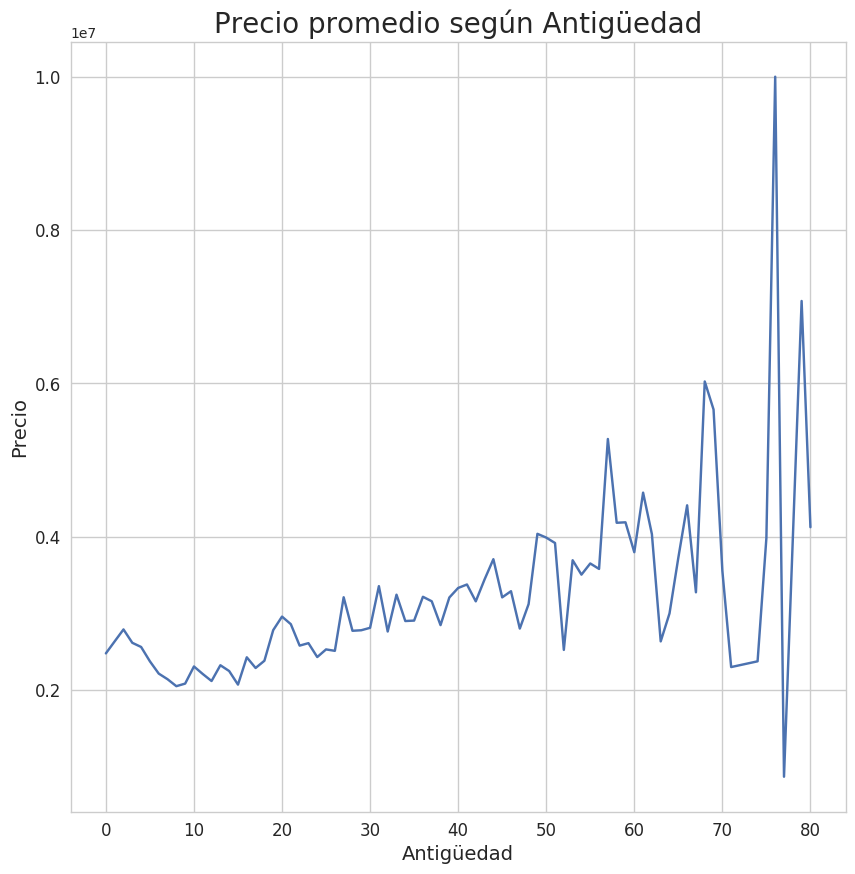

In [31]:
grafico_antiguedad_precio=group_antiguedad_precio.plot(kind='line',figsize=(10,10),fontsize=12,legend=False)
grafico_antiguedad_precio.set_title("Precio promedio según Antigüedad",fontsize=20)
grafico_antiguedad_precio.set_xlabel("Antigüedad",fontsize=14)
grafico_antiguedad_precio.set_ylabel("Precio",fontsize=14)

### 5.3) Por Habitaciones

In [35]:
habitaciones_precio=propiedades[['habitaciones','precio']].copy()
habitaciones_precio.dropna(inplace=True)
habitaciones_precio['habitaciones']=habitaciones_precio['habitaciones'].astype('int32')
group_habitaciones_precio=habitaciones_precio.groupby(['habitaciones']).agg({'precio':'mean'})
group_habitaciones_precio

,precio
habitaciones,
1,1.806075e+06
2,1.616900e+06
3,2.769607e+06
4,3.494389e+06
5,3.284972e+06
6,3.165559e+06
7,3.562564e+06
8,3.432464e+06
9,3.936174e+06


Text(0,0.5,'Precio')

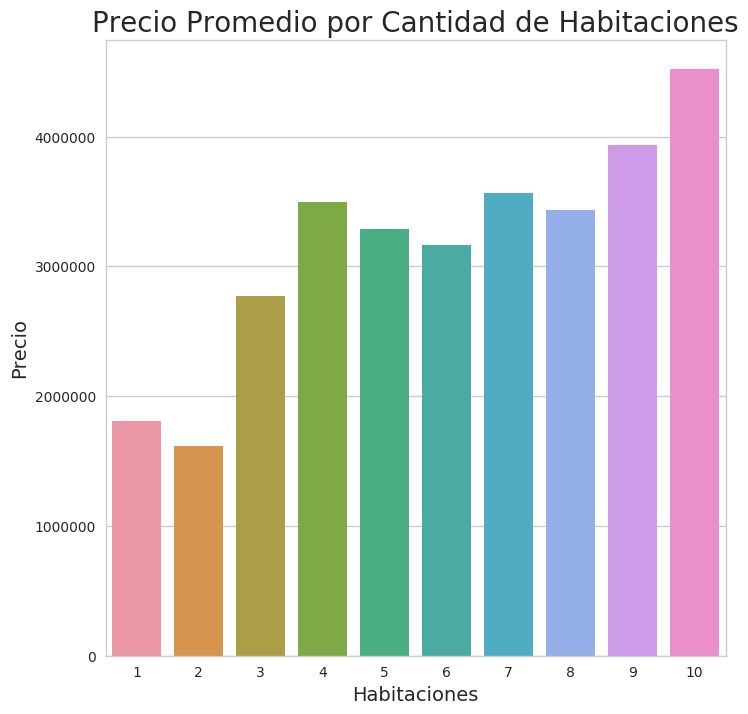

In [37]:
plt.subplots(figsize=(8,8))
grafico_habitaciones_precio=sns.barplot(y=group_habitaciones_precio['precio'],x=group_habitaciones_precio.index)
grafico_habitaciones_precio.set_title("Precio Promedio por Cantidad de Habitaciones",fontsize=20)
grafico_habitaciones_precio.set_xlabel("Habitaciones",fontsize=14)
grafico_habitaciones_precio.set_ylabel("Precio",fontsize=14)

### 5.3) Por Baños

In [38]:
baños_precio=propiedades[['banos','precio']].copy()
baños_precio.dropna(inplace=True)
baños_precio['banos']=baños_precio['banos'].astype('int32')
group_baños_precio=baños_precio.groupby(['banos']).agg({'precio':'mean'})
group_baños_precio

,precio
banos,
1,1.041802e+06
2,2.317530e+06
3,3.701017e+06
4,4.449123e+06


Text(0,0.5,'Baños')

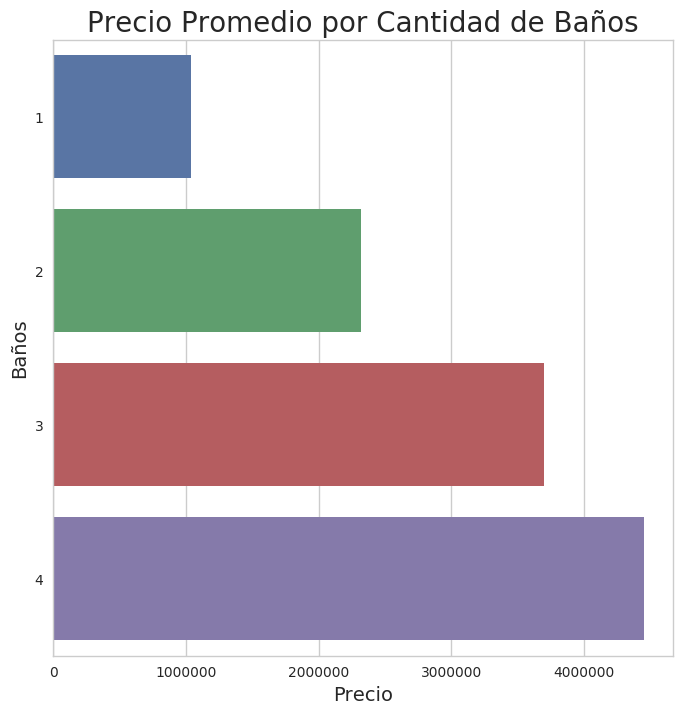

In [41]:
plt.subplots(figsize=(8,8))
grafico_baños_precio=sns.barplot(x=group_baños_precio['precio'],y=group_baños_precio.index,orient='h')
grafico_baños_precio.set_title("Precio Promedio por Cantidad de Baños",fontsize=20)
grafico_baños_precio.set_xlabel("Precio",fontsize=14)
grafico_baños_precio.set_ylabel("Baños",fontsize=14)

### 5.4) Por Garages

In [42]:
garages_precio=propiedades[['garages','precio']].copy()
garages_precio.dropna(inplace=True)
garages_precio['garages']=garages_precio['garages'].astype('int32')
group_garages_precio=garages_precio.groupby(['garages']).agg({'precio':'mean'})
group_garages_precio

,precio
garages,
0,2.033283e+06
1,1.346328e+06
2,2.644485e+06
3,4.293016e+06


Text(0,0.5,'Garages')

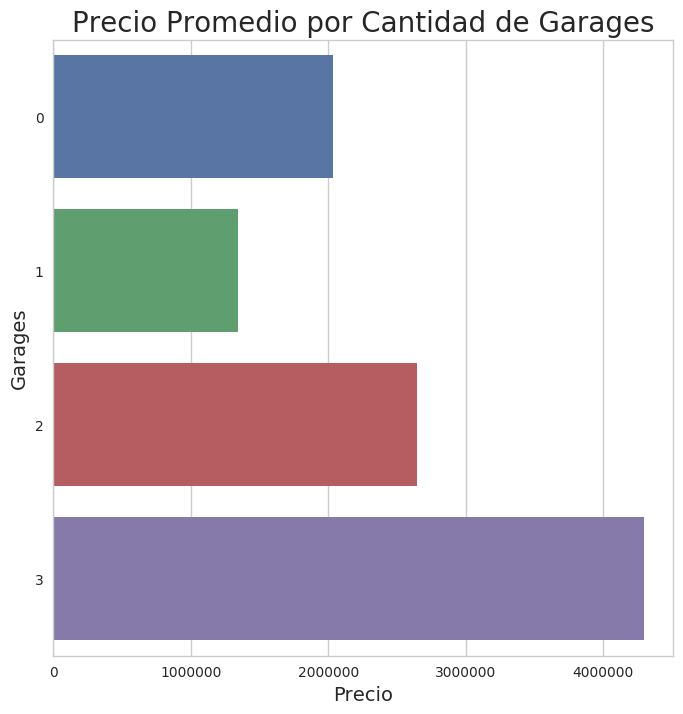

In [43]:
plt.subplots(figsize=(8,8))
grafico_garages_precio=sns.barplot(x=group_garages_precio['precio'],y=group_garages_precio.index,orient='h')
grafico_garages_precio.set_title("Precio Promedio por Cantidad de Garages",fontsize=20)
grafico_garages_precio.set_xlabel("Precio",fontsize=14)
grafico_garages_precio.set_ylabel("Garages",fontsize=14)

### 5.5) Por Piscina

In [48]:
piscina_precio=propiedades[['piscina','precio']].copy()
piscina_precio.dropna(inplace=True)
piscina_precio['piscina'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_piscina_precio=piscina_precio.groupby(['piscina']).agg({'precio':'mean'})
group_piscina_precio

,precio
piscina,
NO,2.455764e+06
SI,3.314903e+06


Text(0,0.5,'¿Tiene Piscina?')

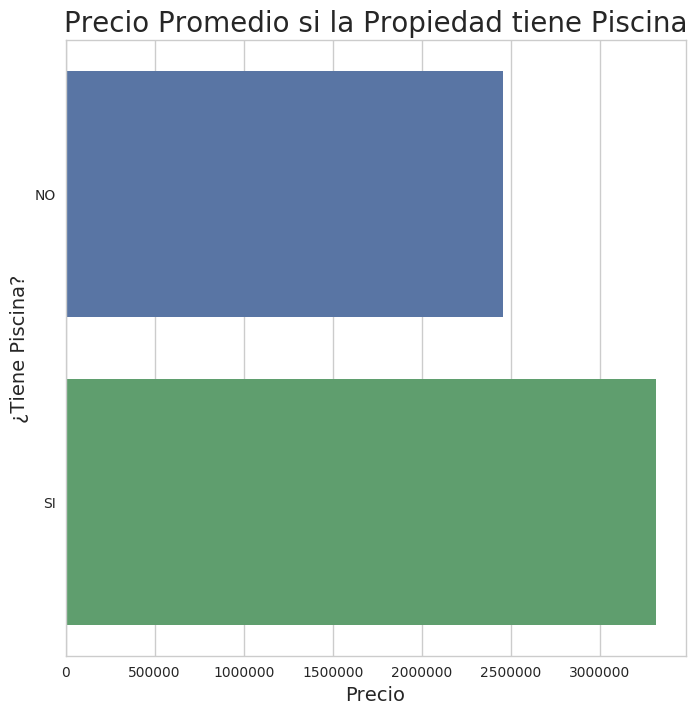

In [69]:
plt.subplots(figsize=(8,8))
grafico_piscina_precio=sns.barplot(x=group_piscina_precio['precio'],y=group_piscina_precio.index,orient='h')
grafico_piscina_precio.set_title("Precio Promedio si la Propiedad tiene Piscina",fontsize=20)
grafico_piscina_precio.set_xlabel("Precio",fontsize=14)
grafico_piscina_precio.set_ylabel("¿Tiene Piscina?",fontsize=14)

### 5.6) Por Escuelas Cercanas

In [51]:
escuelas_precio=propiedades[['escuelascercanas','precio']].copy()
escuelas_precio.dropna(inplace=True)
escuelas_precio['escuelascercanas'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_escuelas_precio=escuelas_precio.groupby(['escuelascercanas']).agg({'precio':'mean'})
group_escuelas_precio

,precio
escuelascercanas,
NO,2.528554e+06
SI,2.533698e+06


Text(0,0.5,'¿Tiene Escuela Cercana?')

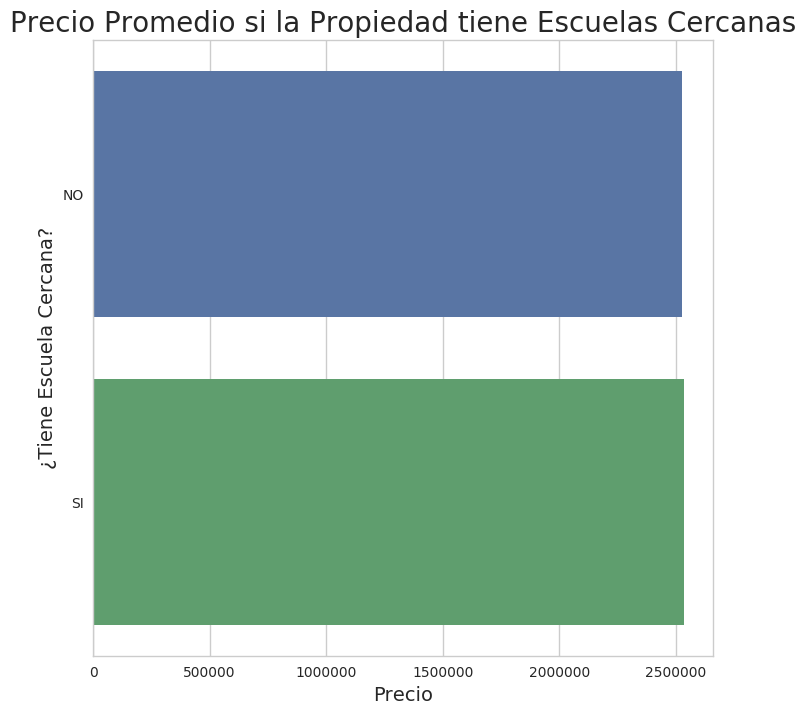

In [68]:
plt.subplots(figsize=(8,8))
grafico_escuelas_precio=sns.barplot(x=group_escuelas_precio['precio'],y=group_escuelas_precio.index,orient='h')
grafico_escuelas_precio.set_title("Precio Promedio si la Propiedad tiene Escuelas Cercanas",fontsize=20)
grafico_escuelas_precio.set_xlabel("Precio",fontsize=14)
grafico_escuelas_precio.set_ylabel("¿Tiene Escuela Cercana?",fontsize=14)

### 5.7) Por Gimansio

In [54]:
gimnasio_precio=propiedades[['gimnasio','precio']].copy()
gimnasio_precio.dropna(inplace=True)
gimnasio_precio['gimnasio'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_gimnasio_precio=gimnasio_precio.groupby(['gimnasio']).agg({'precio':'mean'})
group_gimnasio_precio

,precio
gimnasio,
NO,2.445322e+06
SI,3.814127e+06


Text(0,0.5,'¿Tiene Gimnasio?')

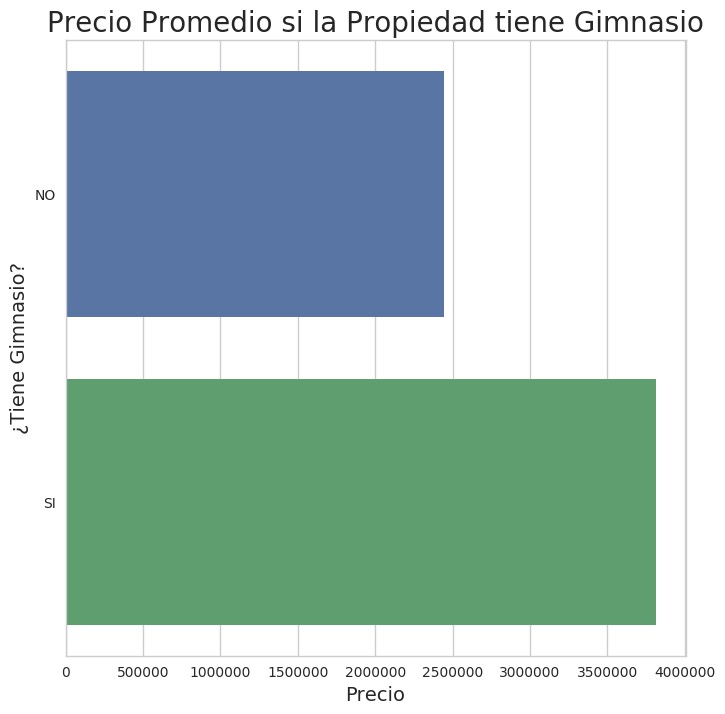

In [67]:
plt.subplots(figsize=(8,8))
grafico_gimnasio_precio=sns.barplot(x=group_gimnasio_precio['precio'],y=group_gimnasio_precio.index,orient='h')
grafico_gimnasio_precio.set_title("Precio Promedio si la Propiedad tiene Gimnasio",fontsize=20)
grafico_gimnasio_precio.set_xlabel("Precio",fontsize=14)
grafico_gimnasio_precio.set_ylabel("¿Tiene Gimnasio?",fontsize=14)

### 5.8) Por SUM

In [59]:
sum_precio=propiedades[['usosmultiples','precio']].copy()
sum_precio.dropna(inplace=True)
sum_precio['usosmultiples'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_sum_precio=sum_precio.groupby(['usosmultiples']).agg({'precio':'mean'})
group_sum_precio

,precio
usosmultiples,
NO,2.455262e+06
SI,3.827091e+06


Text(0,0.5,'¿Tiene SUM?')

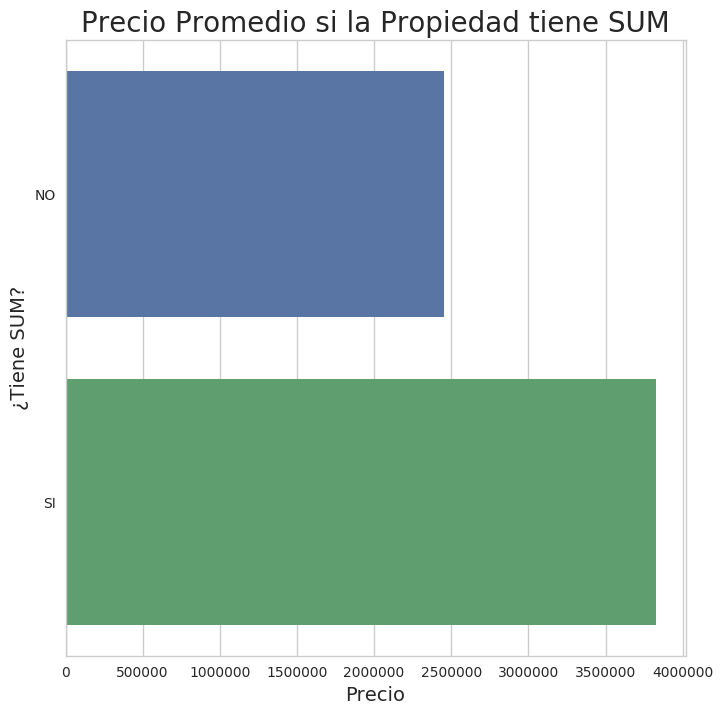

In [66]:
plt.subplots(figsize=(8,8))
grafico_sum_precio=sns.barplot(x=group_sum_precio['precio'],y=group_sum_precio.index,orient='h')
grafico_sum_precio.set_title("Precio Promedio si la Propiedad tiene SUM",fontsize=20)
grafico_sum_precio.set_xlabel("Precio",fontsize=14)
grafico_sum_precio.set_ylabel("¿Tiene SUM?",fontsize=14)

### 5.9) Por Centros Comerciales Cercanos

In [62]:
centros_precio=propiedades[['centroscomercialescercanos','precio']].copy()
centros_precio.dropna(inplace=True)
centros_precio['centroscomercialescercanos'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_centros_precio=centros_precio.groupby(['centroscomercialescercanos']).agg({'precio':'mean'})
group_centros_precio

,precio
centroscomercialescercanos,
NO,2.481760e+06
SI,2.605529e+06


Text(0,0.5,'¿Tiene Centros Comerciales Cercanos?')

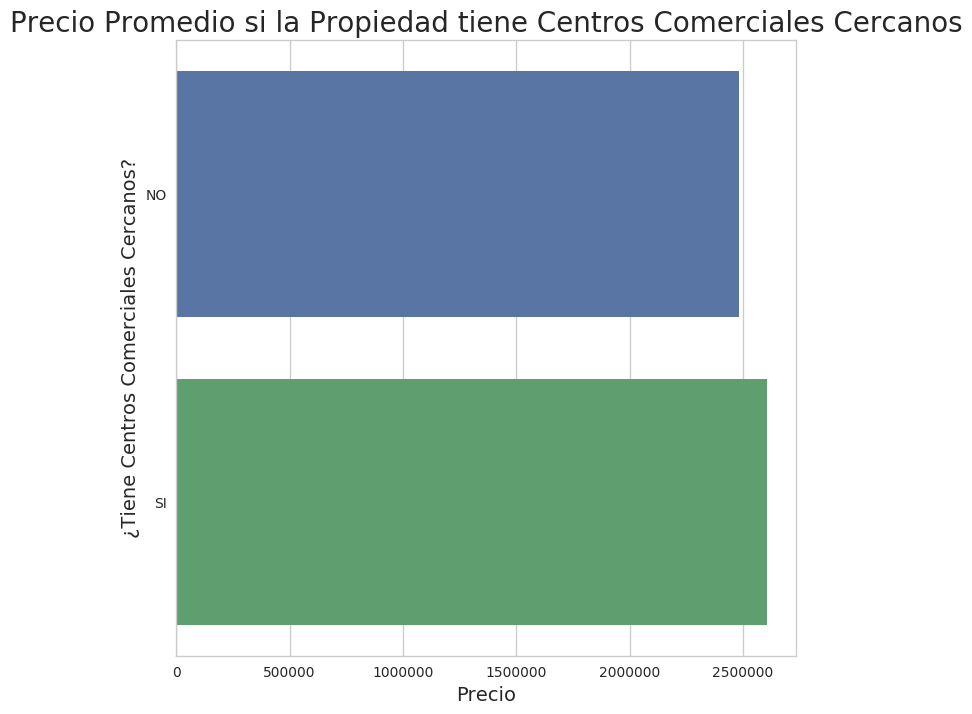

In [64]:
plt.subplots(figsize=(8,8))
grafico_centros_precio=sns.barplot(x=group_centros_precio['precio'],y=group_centros_precio.index,orient='h')
grafico_centros_precio.set_title("Precio Promedio si la Propiedad tiene Centros Comerciales Cercanos",fontsize=20)
grafico_centros_precio.set_xlabel("Precio",fontsize=14)
grafico_centros_precio.set_ylabel("¿Tiene Centros Comerciales Cercanos?",fontsize=14)

## 6) Estaciones

### 6.1) Tipos de Propiedad

En este caso vamos a dividirlos en dos grupos para poder apreciar los resultados con mayor claridad

#### 6.1.1) Primeros

In [79]:
estacion_tipo=propiedades[['tipodepropiedad','Estacion']].copy()
tipo_propiedad_primeros=tipo_propiedad_top.head(4)
tipo_propiedad_resto=tipo_propiedad_top.tail(6)
estacion_tipo_primero=pd.merge(estacion_tipo,tipo_propiedad_primeros,on='tipodepropiedad',how='inner')
estacion_tipo_primero['Valor']=1
pivot_estacion_tipo_primero=estacion_tipo_primero.pivot_table(index='tipodepropiedad',columns='Estacion',values='Valor',aggfunc='count')
pivot_estacion_tipo_primero

Estacion,Invierno,Otonio,Primavera,Verano
tipodepropiedad,,,,
Apartamento,12641,19257,11953,13490
Casa,31714,47771,28691,33541
Casa en condominio,4182,5901,4446,4768
Terreno,2123,3504,1965,2353


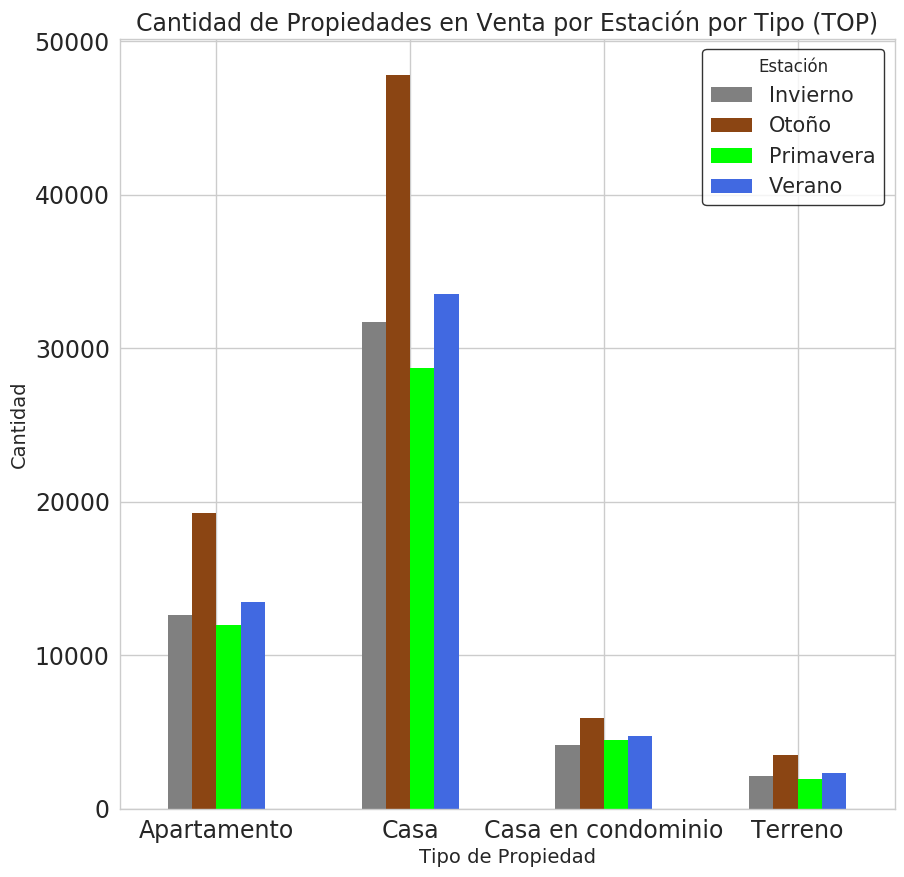

In [82]:
grafico_estaciones_tipo_primero=pivot_estacion_tipo_primero.plot(kind='bar',color=['grey','saddlebrown','lime','royalblue'],fontsize=17,figsize=(10,10),rot=0)
grafico_estaciones_tipo_primero.set_title("Cantidad de Propiedades en Venta por Estación por Tipo (TOP)",fontsize=17)
grafico_estaciones_tipo_primero.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_estaciones_tipo_primero.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(['Invierno','Otoño','Primavera','Verano'],fontsize=15,title='Estación',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

#### 6.1.2) Resto

In [81]:
estacion_tipo_resto=pd.merge(estacion_tipo,tipo_propiedad_resto,on='tipodepropiedad',how='inner')
estacion_tipo_resto['Valor']=1
pivot_estacion_tipo_resto=estacion_tipo_resto.pivot_table(index='tipodepropiedad',columns='Estacion',values='Valor',aggfunc='count')
pivot_estacion_tipo_resto

Estacion,Invierno,Otonio,Primavera,Verano
tipodepropiedad,,,,
Bodega comercial,312,469,269,356
Casa uso de suelo,168,226,147,167
Edificio,318,477,284,317
Local Comercial,645,1141,570,699
Oficina comercial,385,577,357,422
Terreno comercial,294,487,243,302


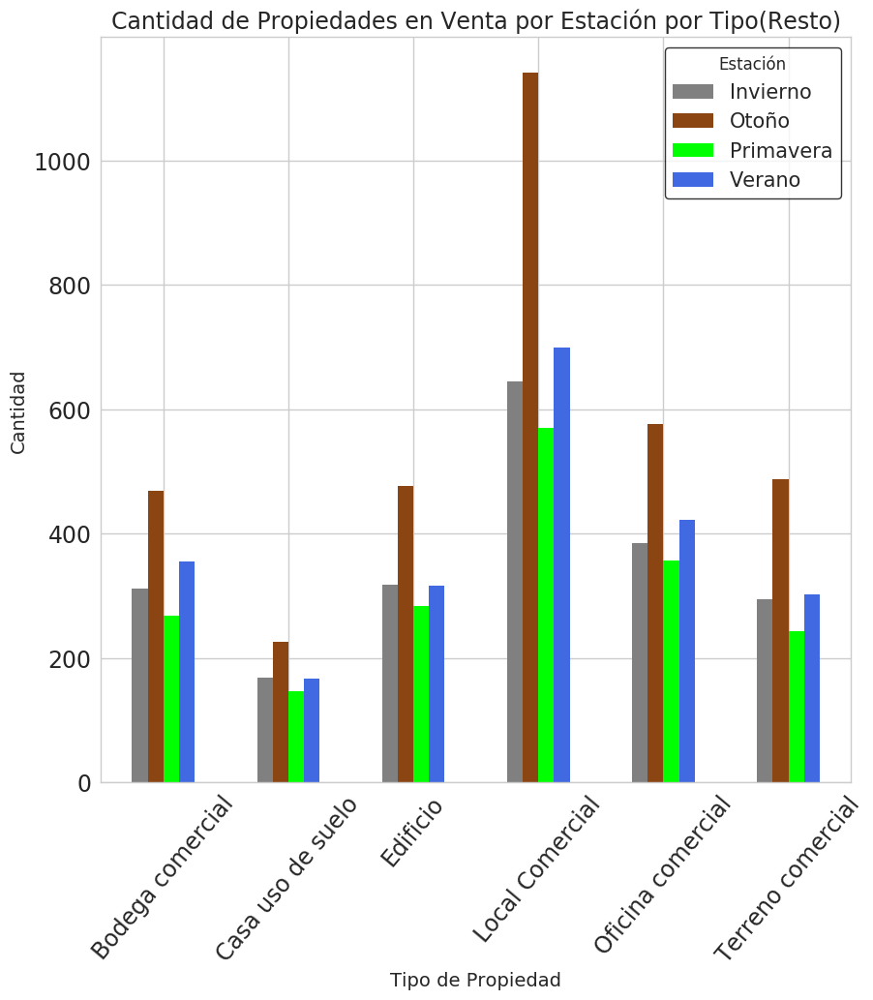

In [86]:
grafico_estaciones_tipo_resto=pivot_estacion_tipo_resto.plot(kind='bar',color=['grey','saddlebrown','lime','royalblue'],fontsize=17,figsize=(10,10),rot=50)
grafico_estaciones_tipo_resto.set_title("Cantidad de Propiedades en Venta por Estación por Tipo(Resto)",fontsize=17)
grafico_estaciones_tipo_resto.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_estaciones_tipo_resto.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(['Invierno','Otoño','Primavera','Verano'],fontsize=15,title='Estación',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

### 6.2) Por Precio

In [87]:
group_precio_estacion=propiedades.groupby(['Estacion']).agg({'precio':'mean'})
group_precio_estacion

,precio
Estacion,
Invierno,2.470583e+06
Otonio,2.578280e+06
Primavera,2.503830e+06
Verano,2.543480e+06


Text(0,0.5,'Precio')

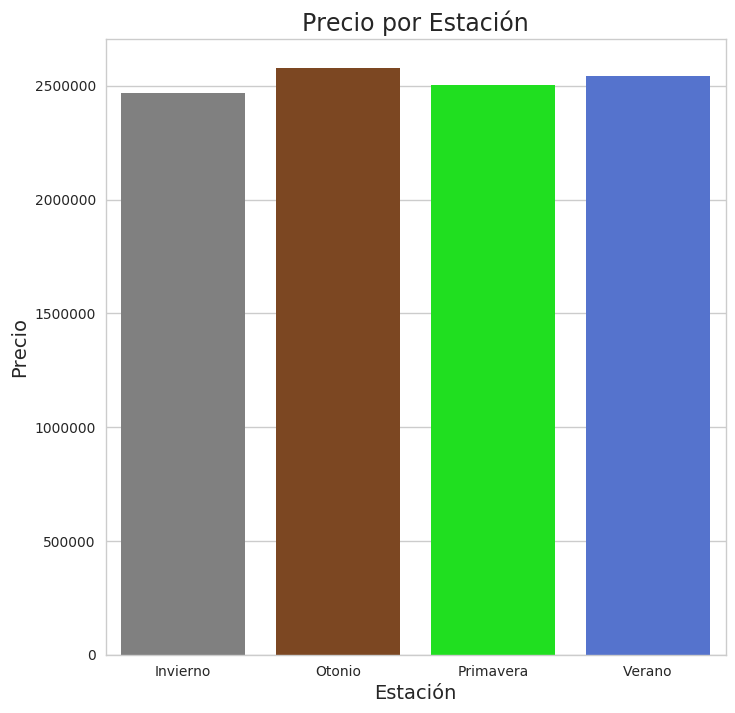

In [94]:
plt.subplots(figsize=(8,8))
grafico_estaciones_precio=sns.barplot(x=group_precio_estacion.index,y=group_precio_estacion['precio'],palette=['grey','saddlebrown','lime','royalblue'])
grafico_estaciones_precio.set_title("Precio por Estación",fontsize=17)
grafico_estaciones_precio.set_xlabel("Estación",fontsize=14)
grafico_estaciones_precio.set_ylabel("Precio",fontsize=14)

## 7) Distrito Federal

In [102]:
#Creamos los labels necesarios para la Leyenda 
AL = mpatches.Patch(color='white',label='00 - Azcapotzalco')
GM = mpatches.Patch(color='white',label='01 - Gustavo A. Madero')
MH = mpatches.Patch(color='white',label='02 - Miguel Hidalgo')
IZ = mpatches.Patch(color='white',label='03 - Iztacalco')
VC = mpatches.Patch(color='white',label='04 - Venustiano Carranza')
IP = mpatches.Patch(color='white',label='05 - Iztapalapa')
TL = mpatches.Patch(color='white',label='06 - Tlalpan')
XO = mpatches.Patch(color='white',label='07 - Xochimilco')
MC = mpatches.Patch(color='white',label='08 - La Magdalena Contreras')
BJ = mpatches.Patch(color='white',label='09 - Benito Juárez')
CT = mpatches.Patch(color='white',label='10 - Cuauhtémoc')
AO = mpatches.Patch(color='white',label='11 - Álvaro Obregón')
CM = mpatches.Patch(color='white',label='12 - Cuajimalpa de Morelos')
CY = mpatches.Patch(color='white',label='13 - Coyoacán')
TH = mpatches.Patch(color='white',label='14 - Tláhuac')
MA = mpatches.Patch(color='white',label='15 - Milpa Alta')

### 7.1) Cantidad

In [103]:
#Nos quedamos con los municipios del Distrito Federal
muni_df=mex_municipio[(mex_municipio['provincia']=='09')]
muni_df.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry
336,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...
337,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...
338,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ..."
339,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...
340,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...


In [130]:
df=propiedades[(propiedades['provincia']=='Distrito Federal')]
distrito=df['ciudad'].value_counts().head(16).reset_index()
distrito.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
distrito['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
muni_df_cantidad=pd.merge(muni_df,distrito,on='ciudad',how='left')
muni_df_cantidad.fillna(0,inplace=True)
muni_df_cantidad.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,1972
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,3141
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",5795
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,1207
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,1456


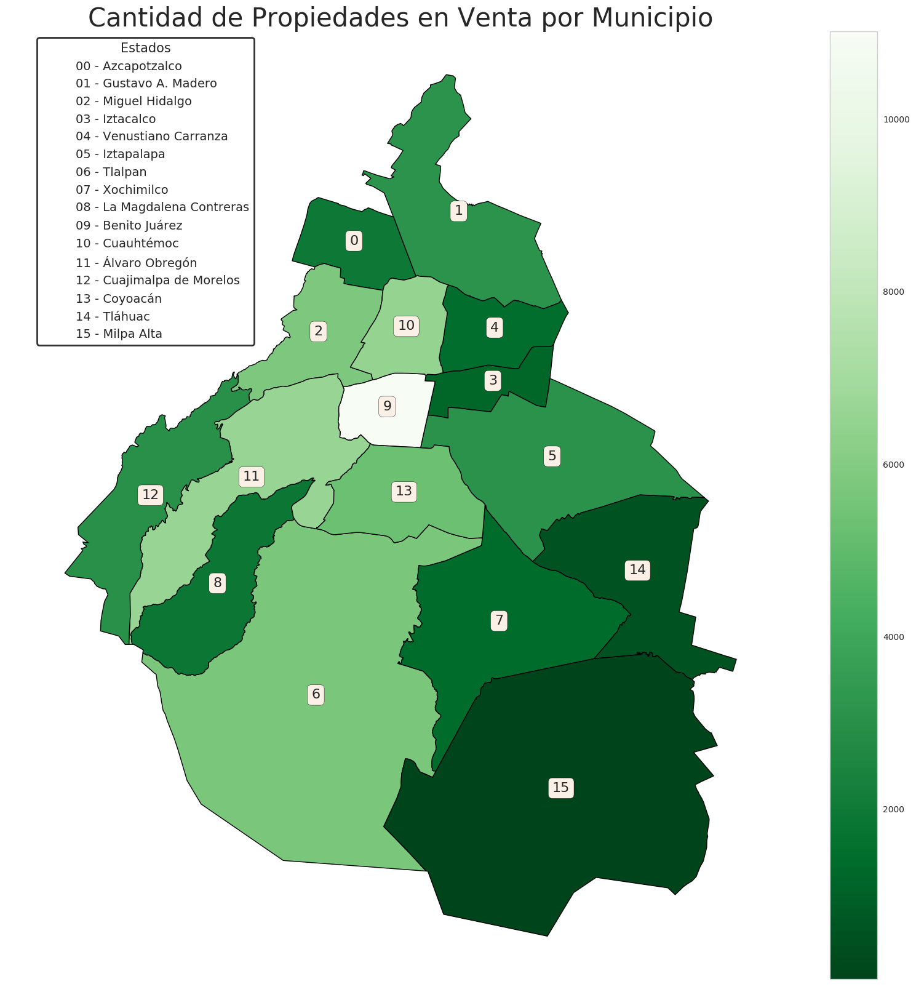

In [121]:
fig, grafico_distrito_ciudad = plt.subplots(1, figsize=(25, 20))
grafico_cantidad=muni_df_cantidad.plot(column='cantidad',cmap='Greens_r', edgecolor='black',ax=grafico_distrito_ciudad,legend=True,figsize=(30,30),linewidth=1.0)
grafico_distrito_ciudad.axis('off')
grafico_distrito_ciudad.set_title("Cantidad de Propiedades en Venta por Municipio",fontsize=30)
for punto in muni_df_cantidad.iterrows():
    grafico_cantidad.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)    

### 7.2) Precio

In [129]:
precio_ciudad=df.groupby(['ciudad']).agg({'precio':'mean'})
precio_ciudad=precio_ciudad.reset_index().head(16)
precio_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
muni_df_precio=pd.merge(muni_df,precio_ciudad,on='ciudad',how='left')
muni_df_precio.fillna(0,inplace=True)
muni_df_precio.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,precio
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,1.966497e+06
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,2.593199e+06
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",4.496526e+06
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,2.157887e+06
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,1.943751e+06


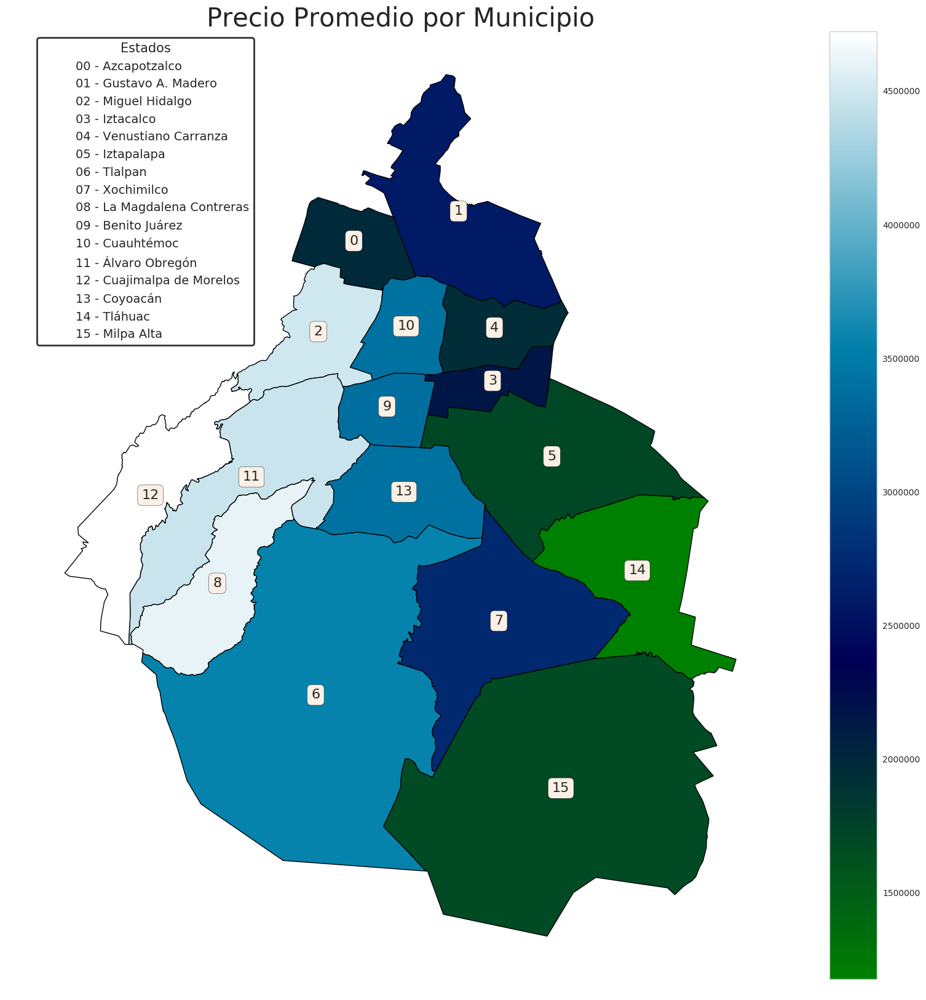

In [120]:
fig, grafico_distrito_ciudad_precio = plt.subplots(1, figsize=(25, 20))
grafico_precio=muni_df_precio.plot(column='precio',cmap='ocean', edgecolor='black',ax=grafico_distrito_ciudad_precio,legend=True,figsize=(30,30),linewidth=1.0)
grafico_distrito_ciudad_precio.axis('off')
grafico_distrito_ciudad_precio.set_title("Precio Promedio por Municipio",fontsize=30)
for punto in muni_df_precio.iterrows():
    grafico_precio.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)

### 7.3) Tipos de Propiedad

#### 7.3.1) Casa

In [131]:
df_casa=df[(df['tipodepropiedad']=='Casa')]
df_casa_ciudad=df_casa['ciudad'].value_counts().reset_index()
df_casa_ciudad.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
df_casa_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
df_casa_muni=pd.merge(muni_df,df_casa_ciudad,on='ciudad',how='left')
df_casa_muni.fillna(0,inplace=True)
df_casa_muni.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,576
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,1582
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",534
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,480
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,423


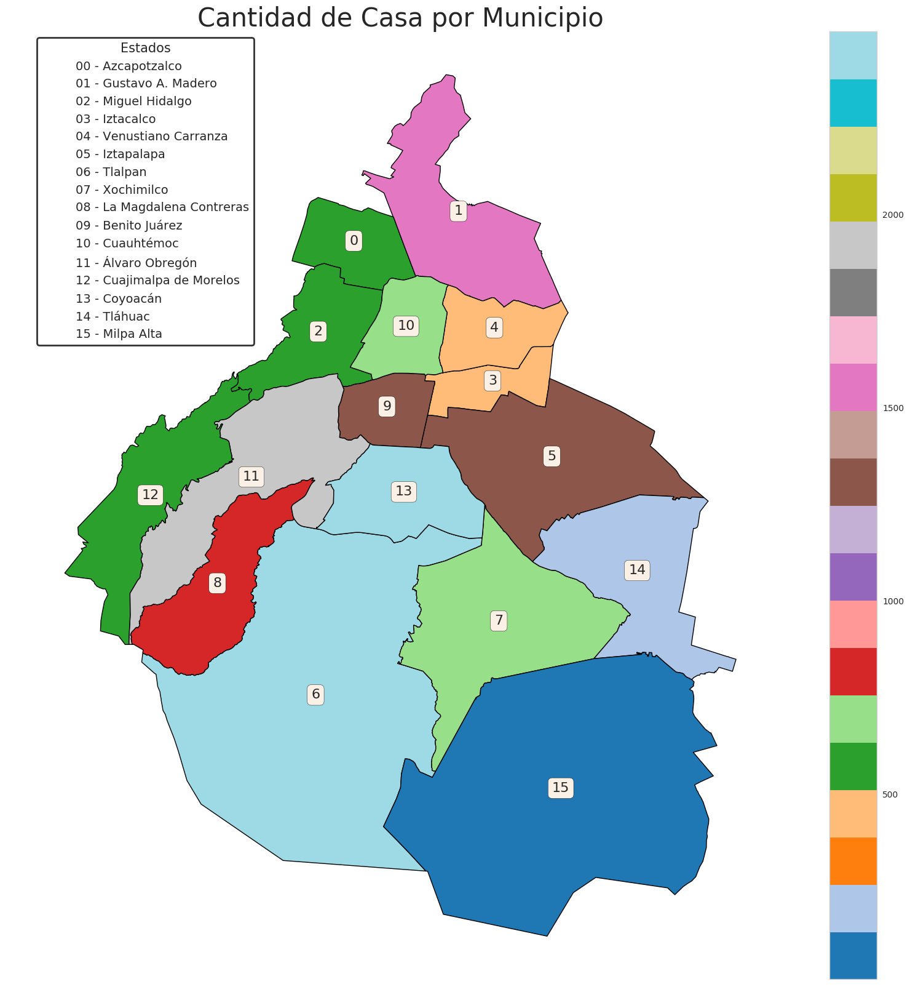

In [123]:
fig, grafico_casa_distrito = plt.subplots(1, figsize=(25, 20))
grafico_casa=df_casa_muni.plot(column='cantidad',cmap='tab20', edgecolor='black',ax=grafico_casa_distrito,legend=True,figsize=(30,30),linewidth=1.0)
grafico_casa_distrito.axis('off')
grafico_casa_distrito.set_title("Cantidad de Casa por Municipio",fontsize=30)
for punto in df_casa_muni.iterrows():
    grafico_casa.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)    

#### 7.3.2) Apartamento

In [125]:
df_apartamento=df[(df['tipodepropiedad']=='Apartamento')]
df_apartamento_ciudad=df_apartamento['ciudad'].value_counts().reset_index()
df_apartamento_ciudad.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
df_apartamento_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
df_apartamento_muni=pd.merge(muni_df,df_apartamento_ciudad,on='ciudad',how='left')
df_apartamento_muni.fillna(0,inplace=True)
df_apartamento_muni.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,1178.0
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,1105.0
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",4767.0
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,577.0
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,794.0


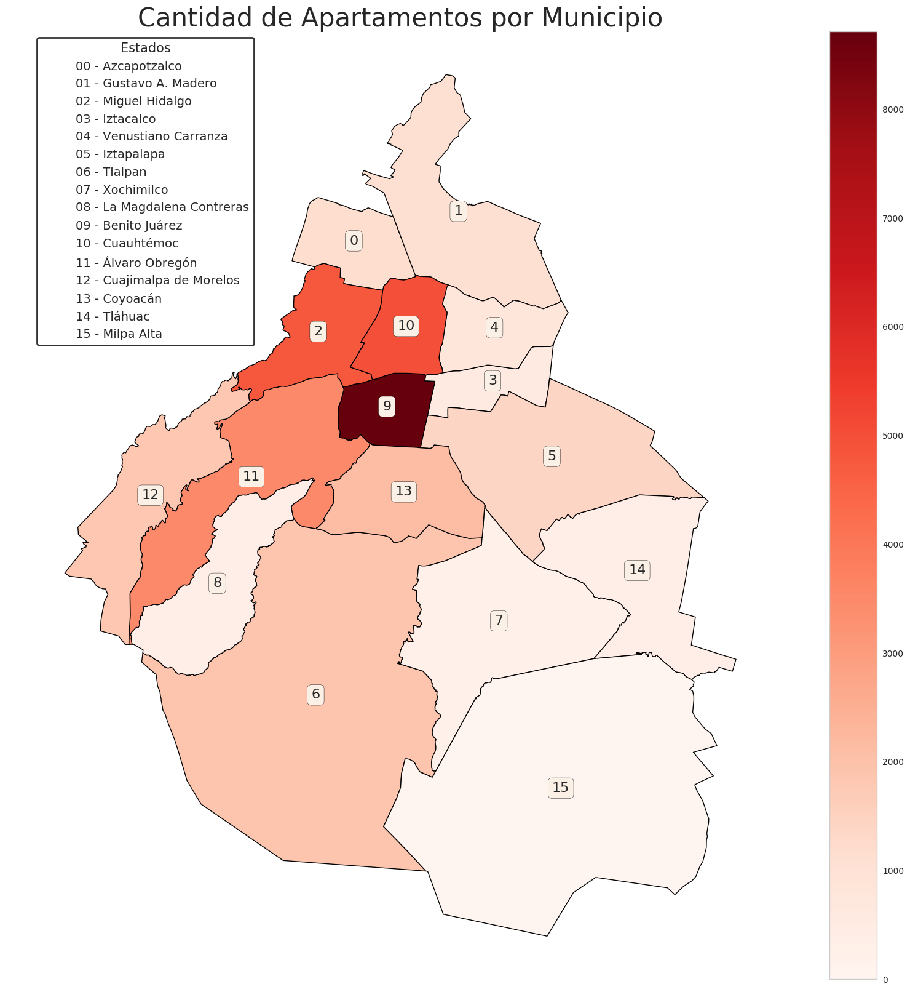

In [132]:
fig, grafico_apartamento_distrito = plt.subplots(1, figsize=(25, 20))
grafico_apartamento=df_apartamento_muni.plot(column='cantidad',cmap='Reds', edgecolor='black',ax=grafico_apartamento_distrito,legend=True,figsize=(30,30),linewidth=1.0)
grafico_apartamento_distrito.axis('off')
grafico_apartamento_distrito.set_title("Cantidad de Apartamentos por Municipio",fontsize=30)
for punto in df_apartamento_muni.iterrows():
    grafico_apartamento.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)    

#### 7.3.3) Edificio

In [134]:
df_edificio=df[(df['tipodepropiedad']=='Edificio')]
df_edificio_ciudad=df_edificio['ciudad'].value_counts().reset_index()
df_edificio_ciudad.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
df_edificio_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
df_edificio_muni=pd.merge(muni_df,df_edificio_ciudad,on='ciudad',how='left')
df_edificio_muni.fillna(0,inplace=True)
df_edificio_muni.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,40.0
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,115.0
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",53.0
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,29.0
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,49.0


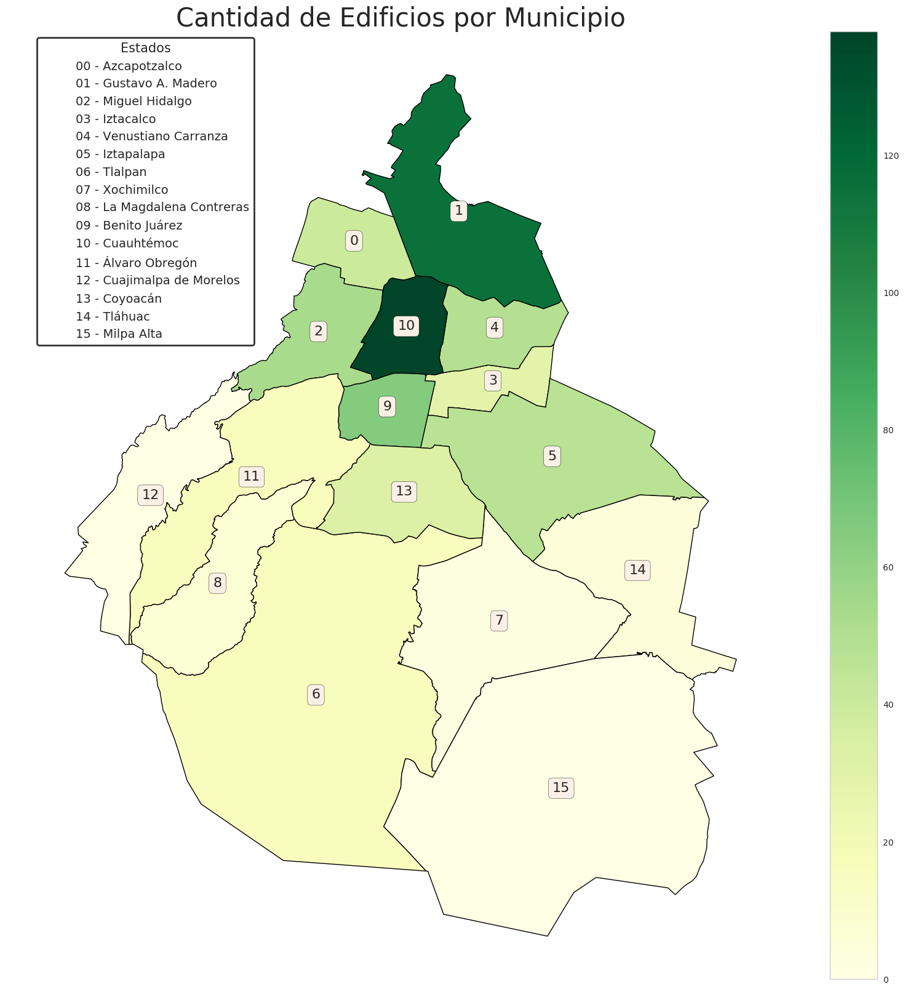

In [135]:
fig, grafico_edificio_distrito = plt.subplots(1, figsize=(25, 20))
grafico_edificio=df_edificio_muni.plot(column='cantidad',cmap='YlGn', edgecolor='black',ax=grafico_edificio_distrito,legend=True,figsize=(30,30),linewidth=1.0)
grafico_edificio_distrito.axis('off')
grafico_edificio_distrito.set_title("Cantidad de Edificios por Municipio",fontsize=30)
for punto in df_edificio_muni.iterrows():
    grafico_edificio.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)    

#### 7.3.4) Terrenos

In [136]:
df_terreno=df[(df['tipodepropiedad']=='Terreno')]
df_terreno_ciudad=df_terreno['ciudad'].value_counts().reset_index()
df_terreno_ciudad.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
df_terreno_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
df_terreno_muni=pd.merge(muni_df,df_terreno_ciudad,on='ciudad',how='left')
df_terreno_muni.fillna(0,inplace=True)
df_terreno_muni.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,82
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,114
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",152
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,49
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,74


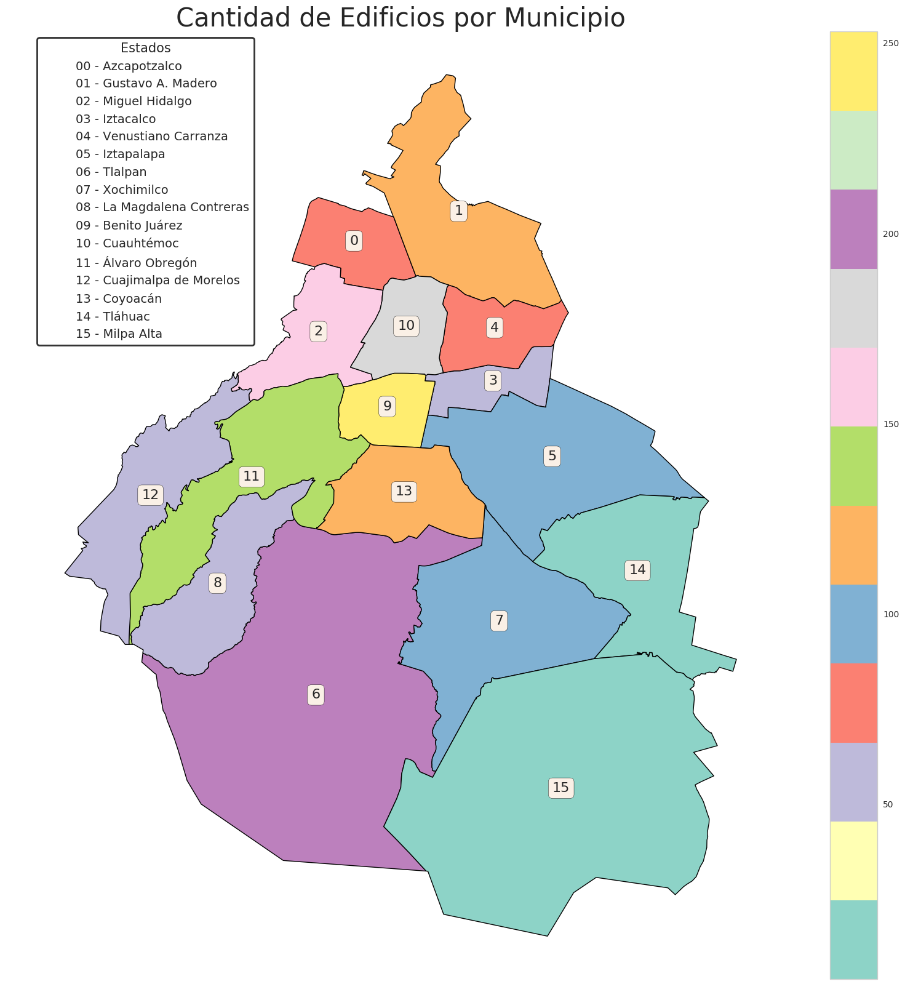

In [137]:
fig, grafico_terreno_distrito = plt.subplots(1, figsize=(25, 20))
grafico_terreno=df_terreno_muni.plot(column='cantidad',cmap='Set3', edgecolor='black',ax=grafico_terreno_distrito,legend=True,figsize=(30,30),linewidth=1.0)
grafico_terreno_distrito.axis('off')
grafico_terreno_distrito.set_title("Cantidad de Edificios por Municipio",fontsize=30)
for punto in df_terreno_muni.iterrows():
    grafico_terreno.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)   

#### 7.3.5) Locales Comerciales

In [138]:
df_locales=df[(df['tipodepropiedad']=='Local Comercial')]
df_locales_ciudad=df_locales['ciudad'].value_counts().reset_index()
df_locales_ciudad.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
df_locales_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
df_locales_muni=pd.merge(muni_df,df_locales_ciudad,on='ciudad',how='left')
df_locales_muni.fillna(0,inplace=True)
df_locales_muni.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,13
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,28
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",46
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,13
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,27


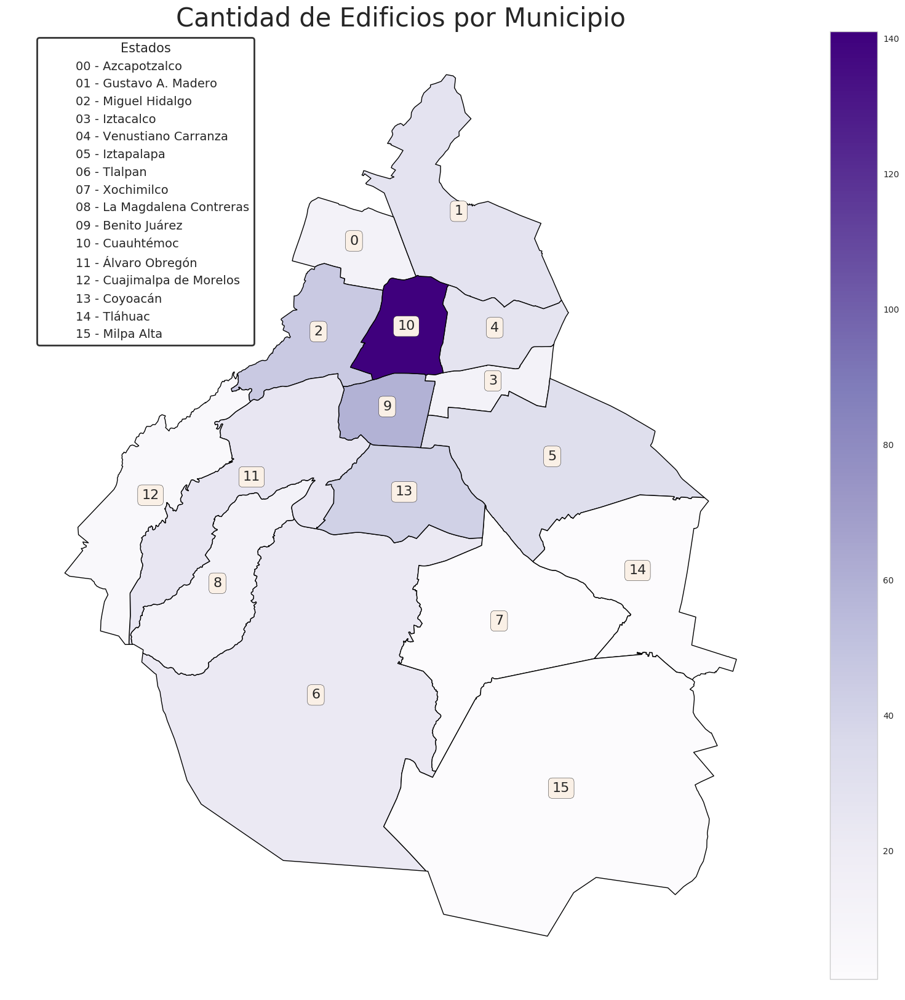

In [139]:
fig, grafico_locales_distrito = plt.subplots(1, figsize=(25, 20))
grafico_locales=df_locales_muni.plot(column='cantidad',cmap='Purples', edgecolor='black',ax=grafico_locales_distrito,legend=True,figsize=(30,30),linewidth=1.0)
grafico_locales_distrito.axis('off')
grafico_locales_distrito.set_title("Cantidad de Edificios por Municipio",fontsize=30)
for punto in df_locales_muni.iterrows():
    grafico_locales.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)   

#### 7.3.6) Oficinas Comerciales

In [140]:
df_oficina=df[(df['tipodepropiedad']=='Oficina comercial')]
df_oficina_ciudad=df_oficina['ciudad'].value_counts().reset_index()
df_oficina_ciudad.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
df_oficina_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
df_oficina_muni=pd.merge(muni_df,df_oficina_ciudad,on='ciudad',how='left')
df_oficina_muni.fillna(0,inplace=True)
df_oficina_muni.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,8.0
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,13.0
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",109.0
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,3.0
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,11.0


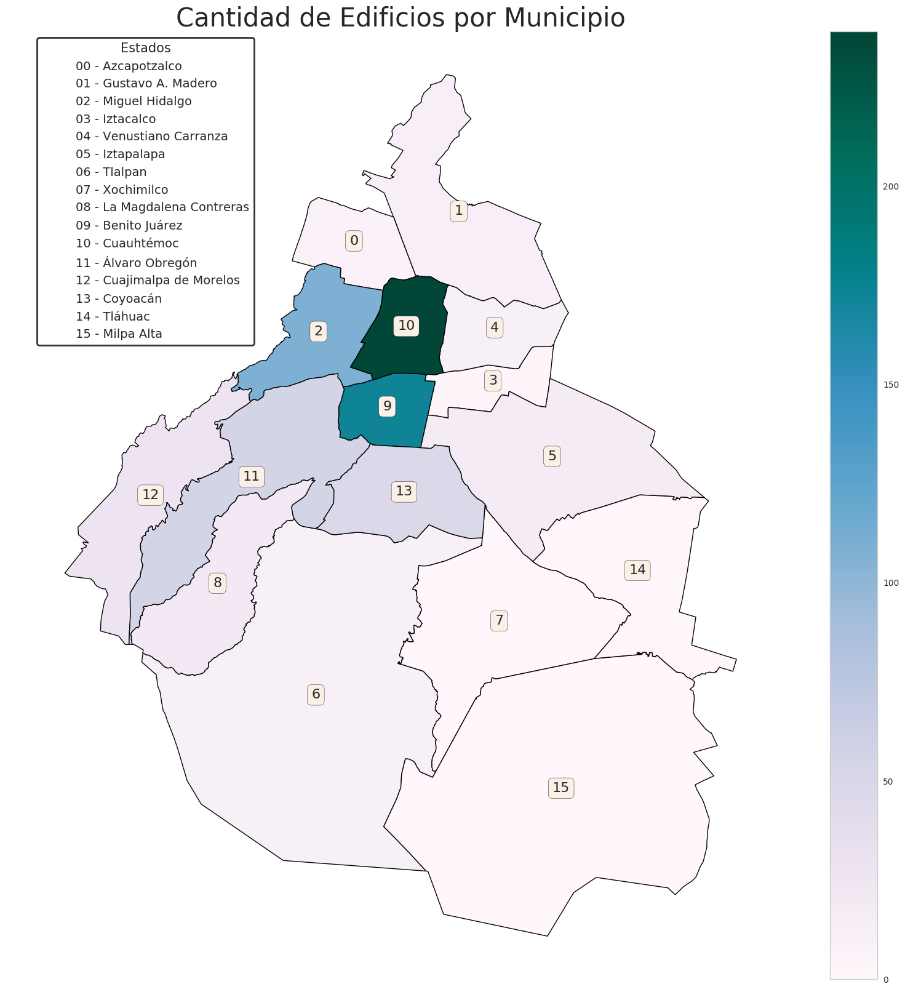

In [142]:
fig, grafico_oficina_distrito = plt.subplots(1, figsize=(25, 20))
grafico_oficina=df_oficina_muni.plot(column='cantidad',cmap='PuBuGn', edgecolor='black',ax=grafico_oficina_distrito,legend=True,figsize=(30,30),linewidth=1.0)
grafico_oficina_distrito.axis('off')
grafico_oficina_distrito.set_title("Cantidad de Edificios por Municipio",fontsize=30)
for punto in df_oficina_muni.iterrows():
    grafico_oficina.text(punto[1]['geometry'].centroid.x,punto[1]['geometry'].centroid.y,punto[0],horizontalalignment='center',fontsize=16,bbox=dict(boxstyle='round', facecolor='linen', alpha=1))
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)   

## 8) Metros

### 8.1) Metros Totales

#### 8.1.1) Por Provincia

In [153]:
#Tomamos solamente los cuales la diferencia entre metros es mayor a 0
filtrado_metros=propiedades[(propiedades['difmetros']>=0.0)]
metros_totales=filtrado_metros.groupby(['provincia']).agg({'metrostotales':'mean'})
metros_totales.reset_index(inplace=True)
metros_totales

,provincia,metrostotales
0,Aguascalientes,173.553679
1,Baja California Norte,129.352162
2,Baja California Sur,181.482362
3,Campeche,206.518248
4,Chiapas,197.726862
5,Chihuahua,211.106124
6,Coahuila,210.720730
7,Colima,170.044405
8,Distrito Federal,147.190325
9,Durango,181.250435


In [336]:
metros_totales_mex=pd.merge(mex,metros_totales,on='provincia',how='left')
metros_totales_mex.fillna(0,inplace=True)
metros_totales_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,metrostotales
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",173.553679
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",129.352162
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",206.518248
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,197.726862
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",211.106124


Text(0.5,1,'Promedio de Metros Totales por Estado')

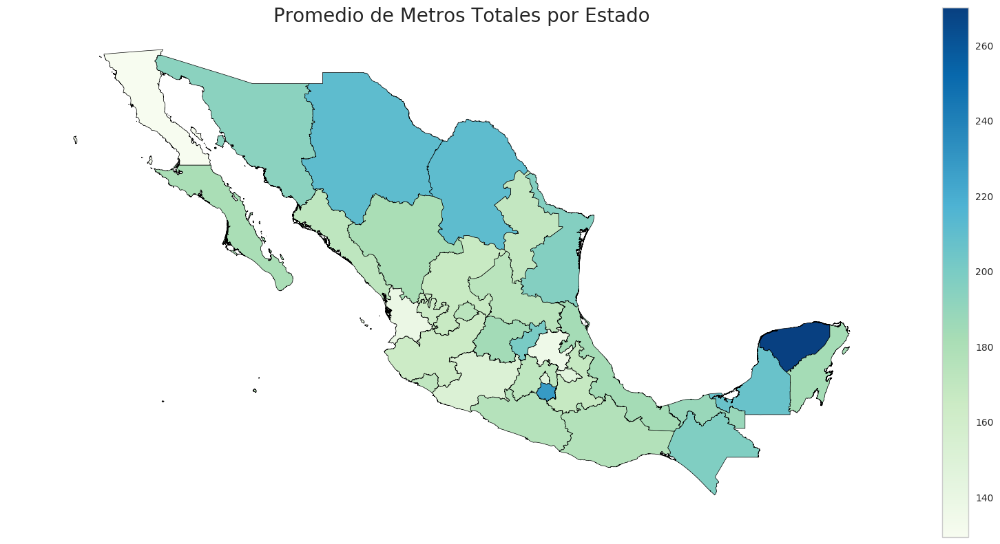

In [337]:
fig, grafico_metros_totales_provincia = plt.subplots(1, figsize=(20, 10))
metros_totales_mex.plot(column='metrostotales',cmap='GnBu', edgecolor='black',ax=grafico_metros_totales_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_metros_totales_provincia.axis('off')
grafico_metros_totales_provincia.set_title("Promedio de Metros Totales por Estado",fontsize=20)

#### 7.1.2) Por Habitaciones

In [160]:
habitaciones_metros_totales=filtrado_metros[['habitaciones','metrostotales']].copy()
habitaciones_metros_totales.dropna(inplace=True)
habitaciones_metros_totales['habitaciones']=habitaciones_metros_totales['habitaciones'].astype('int32')
group_habitaciones_metros_totales=habitaciones_metros_totales.groupby(['habitaciones']).agg({'metrostotales':'mean'})
group_habitaciones_metros_totales

,metrostotales
habitaciones,
1,108.044826
2,112.258623
3,200.099377
4,262.411973
5,272.454627
6,274.915068
7,274.588785
8,291.273810
9,294.967742


Text(0,0.5,'Metros Totales Promedio')

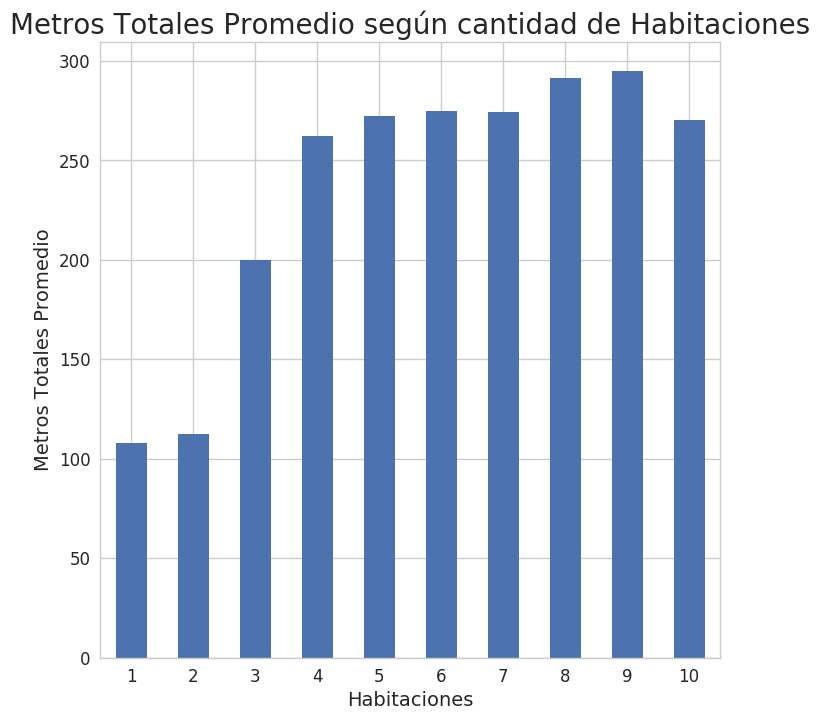

In [162]:
grafico_habitaciones_metros_totales=group_habitaciones_metros_totales.plot(kind='bar',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_habitaciones_metros_totales.set_title("Metros Totales Promedio según cantidad de Habitaciones",fontsize=20)
grafico_habitaciones_metros_totales.set_xlabel("Habitaciones",fontsize=14)
grafico_habitaciones_metros_totales.set_ylabel("Metros Totales Promedio",fontsize=14)

#### 7.1.3) Por Antigüedad

In [165]:
antiguedad_metros_totales=filtrado_metros[['antiguedad','metrostotales']].copy()
antiguedad_metros_totales.dropna(inplace=True)
group_antiguedad_metros_totales=antiguedad_metros_totales.groupby(['antiguedad']).agg({'metrostotales':'mean'})
group_antiguedad_metros_totales.head()

,metrostotales
antiguedad,
0.0,180.642182
1.0,183.266540
2.0,175.386225
3.0,168.409695
4.0,163.801962


Text(0,0.5,'Metros Totales Promedio')

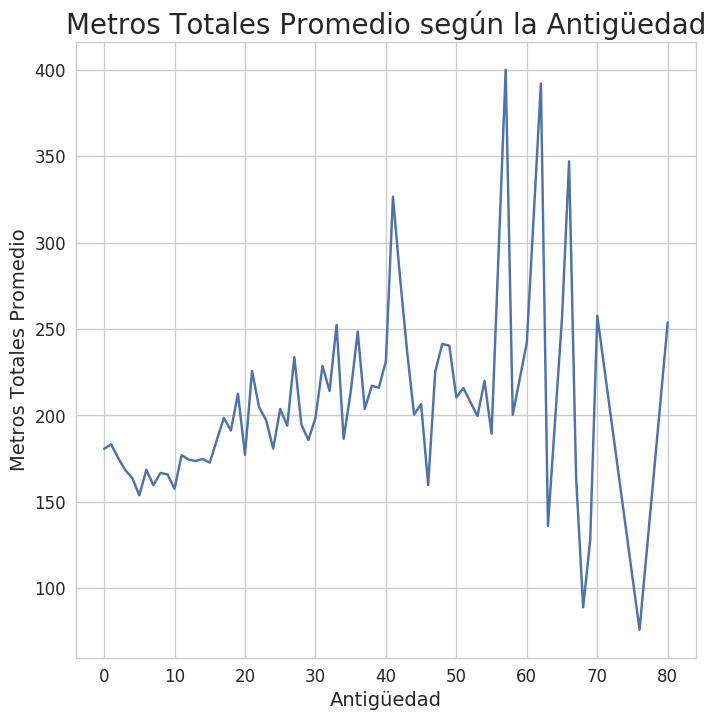

In [166]:
grafico_antiguedad_metros_totales=group_antiguedad_metros_totales.plot(kind='line',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_antiguedad_metros_totales.set_title("Metros Totales Promedio según la Antigüedad",fontsize=20)
grafico_antiguedad_metros_totales.set_xlabel("Antigüedad",fontsize=14)
grafico_antiguedad_metros_totales.set_ylabel("Metros Totales Promedio",fontsize=14)

#### 7.1.4) Por Baños

In [167]:
baños_metros_totales=filtrado_metros[['banos','metrostotales']].copy()
baños_metros_totales.dropna(inplace=True)
baños_metros_totales['banos']=baños_metros_totales['banos'].astype('int32')
group_baños_metros_totales=baños_metros_totales.groupby(['banos']).agg({'metrostotales':'mean'})
group_baños_metros_totales

,metrostotales
banos,
1,108.745222
2,174.698203
3,257.649813
4,301.108796


Text(0,0.5,'Metros Totales Promedio')

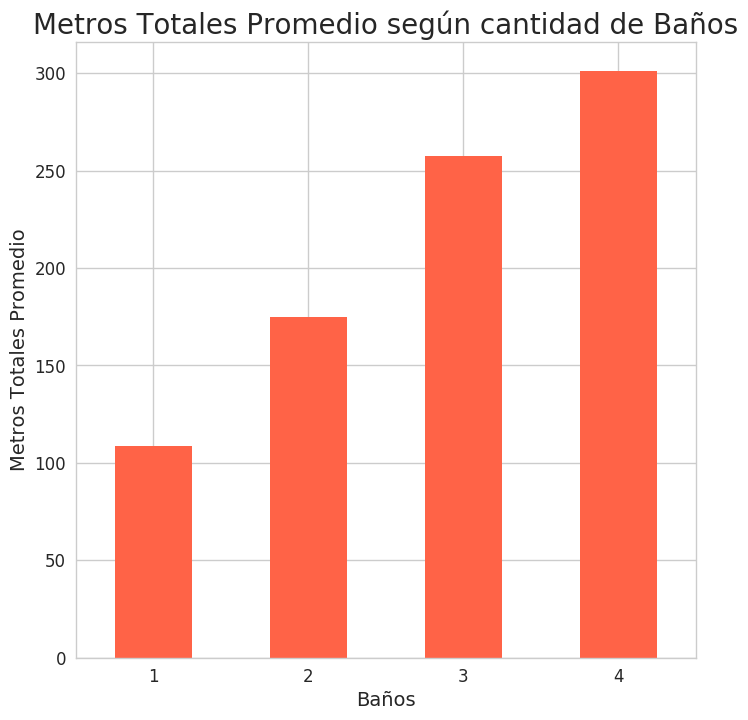

In [169]:
grafico_baños_metros_totales=group_baños_metros_totales.plot(kind='bar',color='tomato',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_baños_metros_totales.set_title("Metros Totales Promedio según cantidad de Baños",fontsize=20)
grafico_baños_metros_totales.set_xlabel("Baños",fontsize=14)
grafico_baños_metros_totales.set_ylabel("Metros Totales Promedio",fontsize=14)

#### 7.1.5) Por Garage

In [176]:
garage_metros_totales=filtrado_metros[['garages','metrostotales']].copy()
garage_metros_totales.dropna(inplace=True)
garage_metros_totales['garages']=garage_metros_totales['garages'].astype('int32')
group_garage_metros_totales=garage_metros_totales.groupby(['garages']).agg({'metrostotales':'mean'})
group_garage_metros_totales

,metrostotales
garages,
0,168.796489
1,108.973278
2,190.325083
3,265.765697


Text(0,0.5,'Metros Totales Promedio')

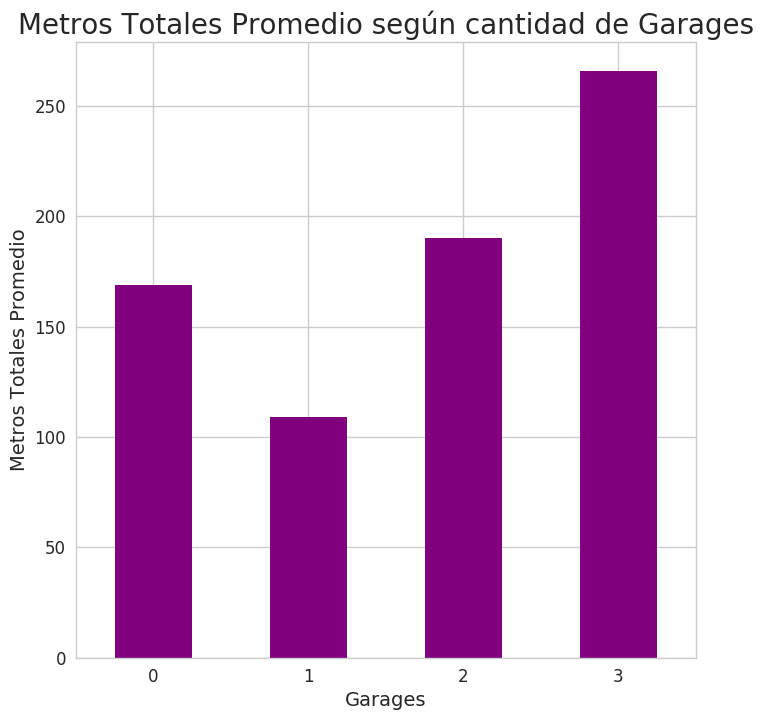

In [177]:
grafico_garage_metros_totales=group_garage_metros_totales.plot(kind='bar',color='purple',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_garage_metros_totales.set_title("Metros Totales Promedio según cantidad de Garages",fontsize=20)
grafico_garage_metros_totales.set_xlabel("Garages",fontsize=14)
grafico_garage_metros_totales.set_ylabel("Metros Totales Promedio",fontsize=14)

#### 7.1.6) Por Gimnasio

In [170]:
gimnasio_metros_totales=filtrado_metros[['gimnasio','metrostotales']].copy()
gimnasio_metros_totales.dropna(inplace=True)
gimnasio_metros_totales['gimnasio'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_gimnasio_metros_totales=gimnasio_metros_totales.groupby(['gimnasio']).agg({'metrostotales':'mean'})
group_gimnasio_metros_totales

,metrostotales
gimnasio,
NO,173.919016
SI,183.593951


Text(0,0.5,'Metros Totales Promedio')

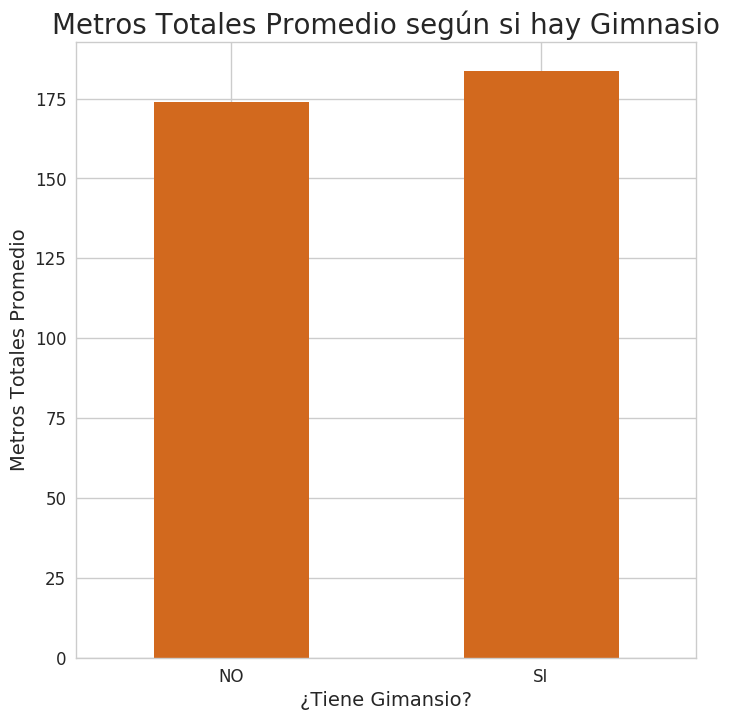

In [171]:
grafico_gimnasio_metros_totales=group_gimnasio_metros_totales.plot(kind='bar',color='chocolate',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_gimnasio_metros_totales.set_title("Metros Totales Promedio según si hay Gimnasio",fontsize=20)
grafico_gimnasio_metros_totales.set_xlabel("¿Tiene Gimansio?",fontsize=14)
grafico_gimnasio_metros_totales.set_ylabel("Metros Totales Promedio",fontsize=14)

#### 7.1.7) Por Piscina

In [172]:
piscina_metros_totales=filtrado_metros[['piscina','metrostotales']].copy()
piscina_metros_totales.dropna(inplace=True)
piscina_metros_totales['piscina'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_piscina_metros_totales=piscina_metros_totales.groupby(['piscina']).agg({'metrostotales':'mean'})
group_piscina_metros_totales

,metrostotales
piscina,
NO,171.420963
SI,206.221748


Text(0,0.5,'Metros Totales Promedio')

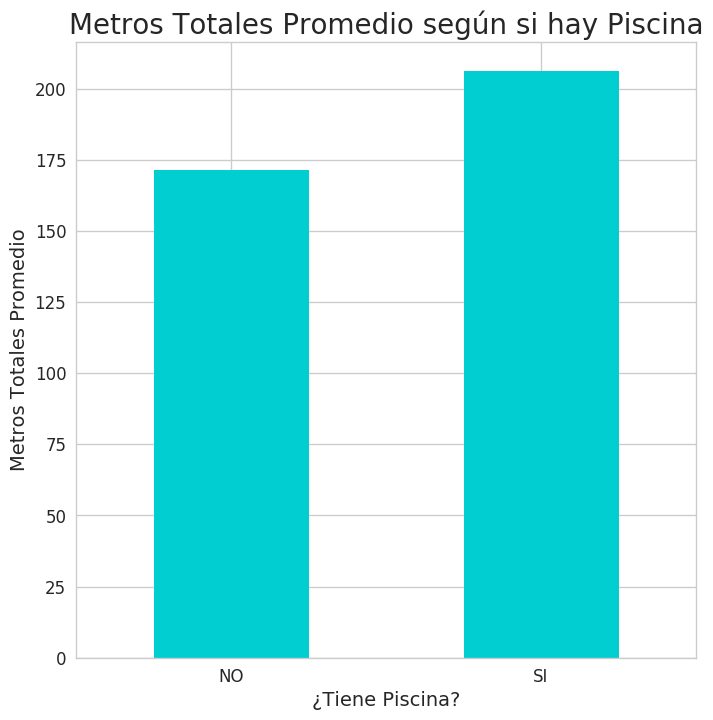

In [178]:
grafico_piscina_metros_totales=group_piscina_metros_totales.plot(kind='bar',color='darkturquoise',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_piscina_metros_totales.set_title("Metros Totales Promedio según si hay Piscina",fontsize=20)
grafico_piscina_metros_totales.set_xlabel("¿Tiene Piscina?",fontsize=14)
grafico_piscina_metros_totales.set_ylabel("Metros Totales Promedio",fontsize=14)

#### 7.1.8) Por SUM

In [174]:
sum_metros_totales=filtrado_metros[['usosmultiples','metrostotales']].copy()
sum_metros_totales.dropna(inplace=True)
sum_metros_totales['usosmultiples'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_sum_metros_totales=sum_metros_totales.groupby(['usosmultiples']).agg({'metrostotales':'mean'})
group_sum_metros_totales

,metrostotales
usosmultiples,
NO,174.145225
SI,181.858895


Text(0,0.5,'Metros Totales Promedio')

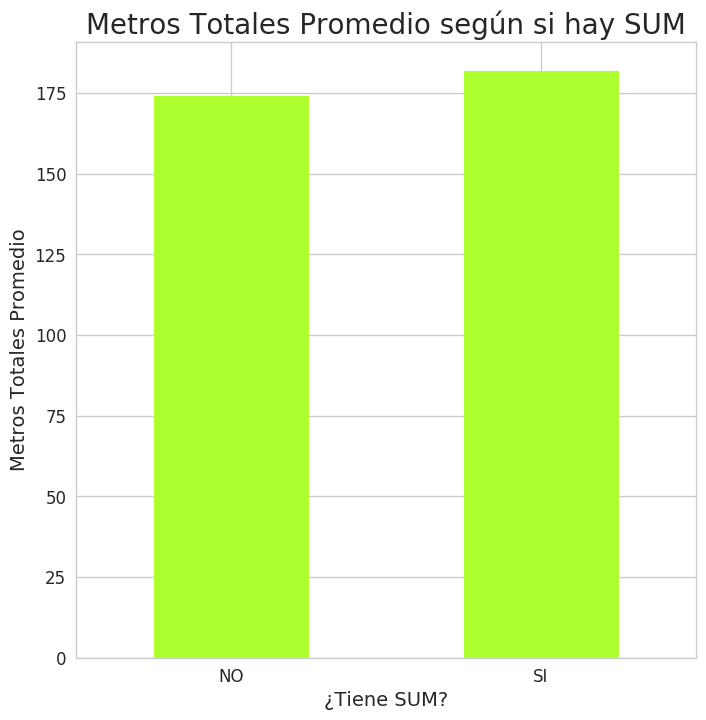

In [175]:
grafico_sum_metros_totales=group_sum_metros_totales.plot(kind='bar',color='greenyellow',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_sum_metros_totales.set_title("Metros Totales Promedio según si hay SUM",fontsize=20)
grafico_sum_metros_totales.set_xlabel("¿Tiene SUM?",fontsize=14)
grafico_sum_metros_totales.set_ylabel("Metros Totales Promedio",fontsize=14)

#### 7.1.9) Relación entre Tipo de Propiedad y Gimnasio

In [28]:
gimnasio_tipo_metros=propiedades[['tipodepropiedad','metrostotales','metroscubiertos','gimnasio']].copy()
gimnasio_tipo_metros.dropna(inplace=True)
gimnasio_tipo_metros['gimnasio'].replace({0.0:'NO',1.0:'SI'},inplace=True)
pivot_gimnasio_tipo_metrostotales=gimnasio_tipo_metros.pivot_table(index='tipodepropiedad',columns='gimnasio',values='metrostotales',aggfunc='mean')
pivot_gimnasio_tipo_metrostotales.dropna(inplace=True)
pivot_gimnasio_tipo_metrostotales

gimnasio,NO,SI
tipodepropiedad,,
Apartamento,110.781222,155.627790
Casa,177.969736,198.840218
Casa en condominio,164.544668,190.978363
Departamento Compartido,111.930556,172.444444
Oficina comercial,154.620853,172.000000


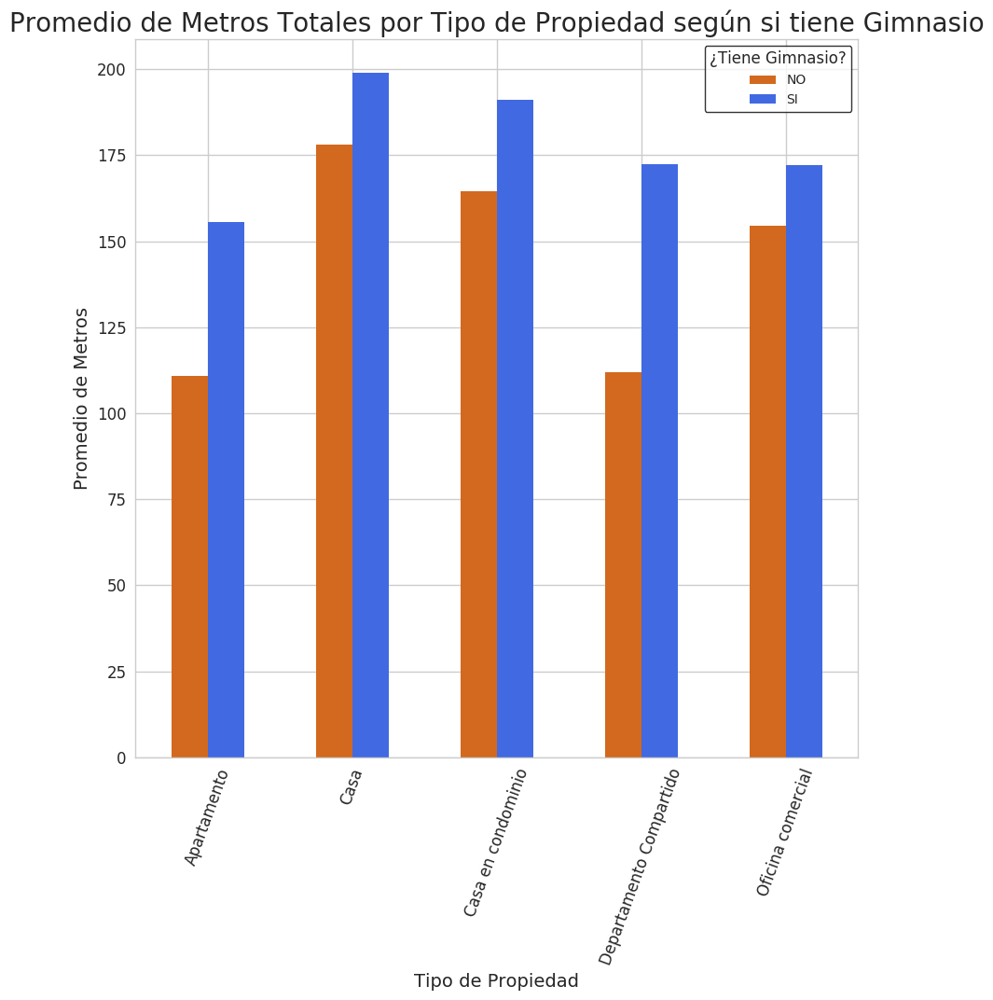

In [29]:
grafico_gimnasio_tipo_metrostotales=pivot_gimnasio_tipo_metrostotales.plot(kind='bar',color=['chocolate','royalblue'],rot=70,fontsize=12,figsize=(10,10))
grafico_gimnasio_tipo_metrostotales.set_title("Promedio de Metros Totales por Tipo de Propiedad según si tiene Gimnasio",fontsize=20)
grafico_gimnasio_tipo_metrostotales.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_gimnasio_tipo_metrostotales.set_ylabel("Promedio de Metros",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene Gimnasio?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

#### 7.1.10) Relación entre Tipo de Propiedad y Piscina

In [30]:
piscina_tipo_metros=propiedades[['tipodepropiedad','metrostotales','metroscubiertos','piscina']].copy()
piscina_tipo_metros.dropna(inplace=True)
piscina_tipo_metros['piscina'].replace({0.0:'NO',1.0:'SI'},inplace=True)
pivot_piscina_tipo_metrostotales=piscina_tipo_metros.pivot_table(index='tipodepropiedad',columns='piscina',values='metrostotales',aggfunc='mean')
pivot_piscina_tipo_metrostotales.dropna(inplace=True)
pivot_piscina_tipo_metrostotales

piscina,NO,SI
tipodepropiedad,,
Apartamento,110.174711,161.015438
Casa,176.311206,222.971242
Casa en condominio,164.886827,174.100205
Departamento Compartido,114.800000,185.842105
Oficina comercial,154.620853,172.000000
Quinta Vacacional,228.037037,206.111111
Terreno,252.836621,249.654867
Villa,194.125000,186.901235


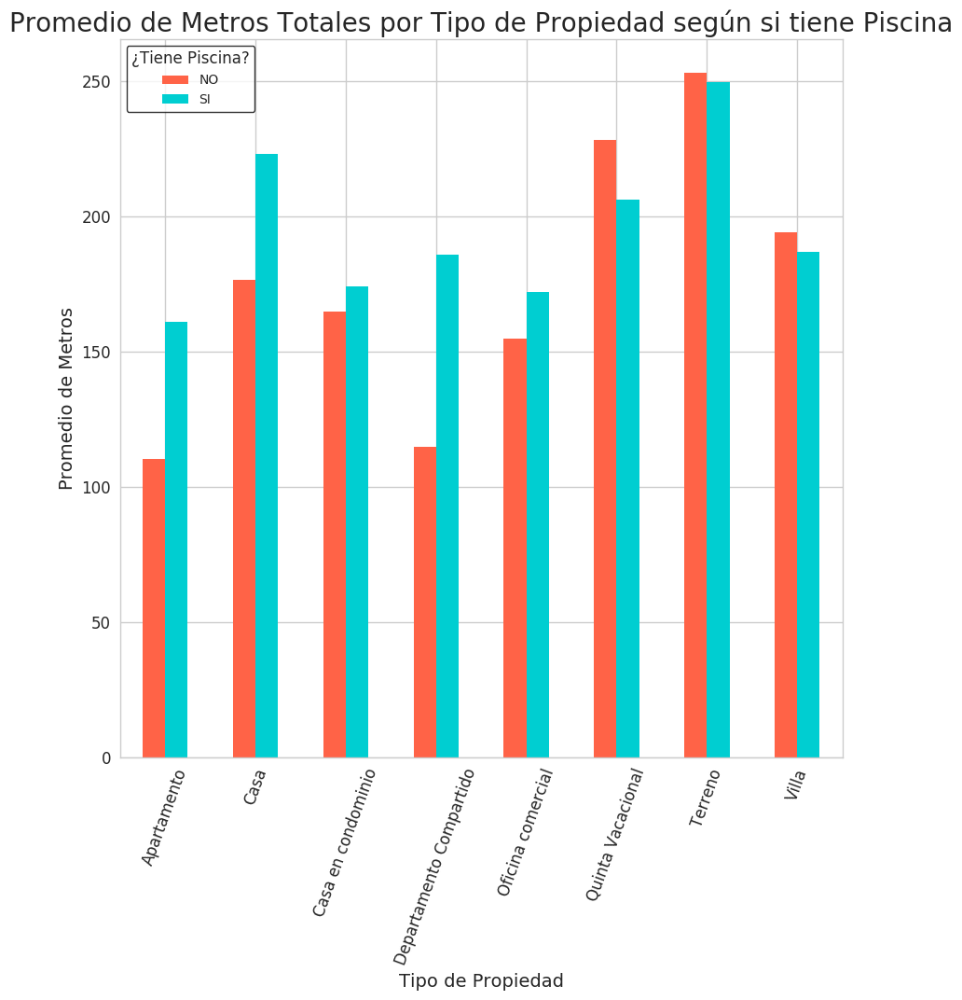

In [31]:
grafico_piscina_tipo_metrostotales=pivot_piscina_tipo_metrostotales.plot(kind='bar',color=['tomato','darkturquoise'],rot=70,fontsize=12,figsize=(10,10))
grafico_piscina_tipo_metrostotales.set_title("Promedio de Metros Totales por Tipo de Propiedad según si tiene Piscina",fontsize=20)
grafico_piscina_tipo_metrostotales.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_piscina_tipo_metrostotales.set_ylabel("Promedio de Metros",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene Piscina?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

#### 7.1.11) Relación entre Tipo de Propiedad y SUM

In [32]:
sum_tipo_metros=propiedades[['tipodepropiedad','metrostotales','metroscubiertos','usosmultiples']].copy()
sum_tipo_metros.dropna(inplace=True)
sum_tipo_metros['usosmultiples'].replace({0.0:'NO',1.0:'SI'},inplace=True)
pivot_sum_tipo_metrostotales=sum_tipo_metros.pivot_table(index='tipodepropiedad',columns='usosmultiples',values='metrostotales',aggfunc='mean')
pivot_sum_tipo_metrostotales.dropna(inplace=True)
pivot_sum_tipo_metrostotales

usosmultiples,NO,SI
tipodepropiedad,,
Apartamento,112.806826,150.290941
Casa,178.003351,203.249430
Casa en condominio,163.871050,187.659394
Departamento Compartido,119.407407,169.055556
Edificio,193.388112,74.000000
Oficina comercial,154.565836,186.500000


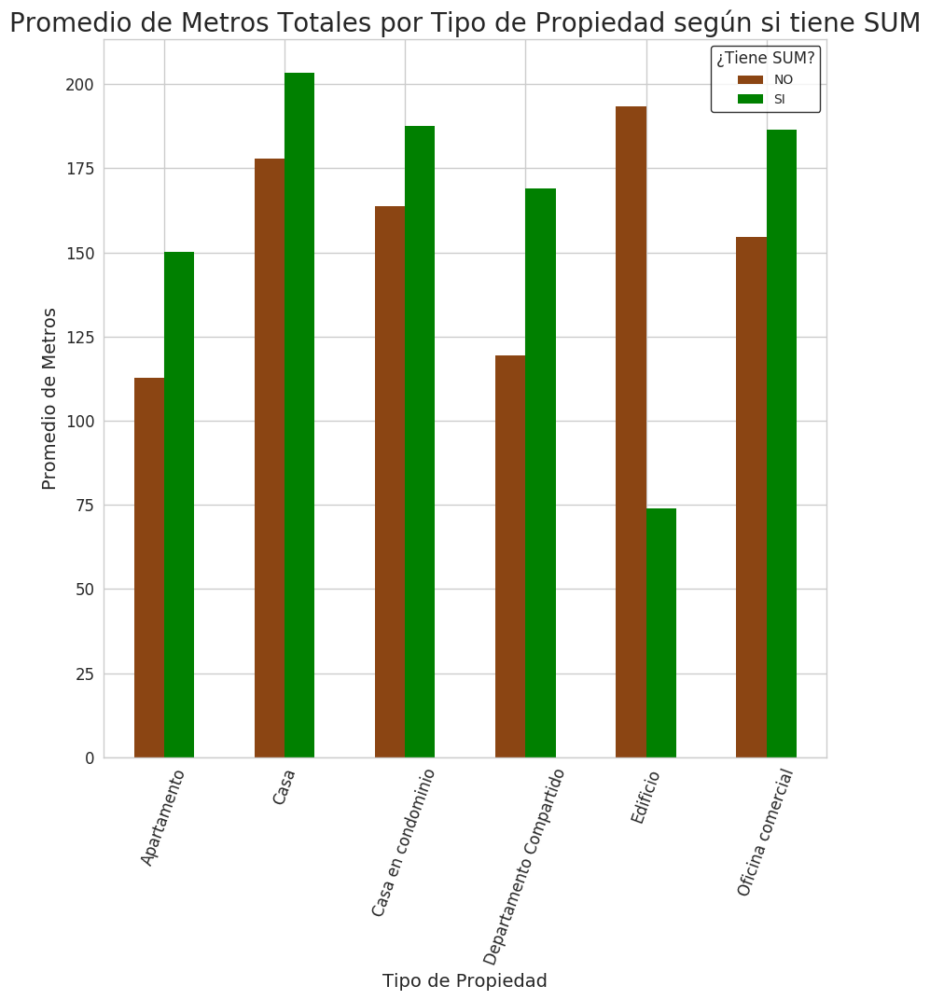

In [33]:
grafico_sum_tipo_metrostotales=pivot_sum_tipo_metrostotales.plot(kind='bar',color=['saddlebrown','green'],rot=70,fontsize=12,figsize=(10,10))
grafico_sum_tipo_metrostotales.set_title("Promedio de Metros Totales por Tipo de Propiedad según si tiene SUM",fontsize=20)
grafico_sum_tipo_metrostotales.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_sum_tipo_metrostotales.set_ylabel("Promedio de Metros",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene SUM?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

### 7.2) Metros Cubiertos

#### 7.2.1) Por Provincia

In [146]:
metros_cubiertos=filtrado_metros.groupby(['provincia']).agg({'metroscubiertos':'mean'})
metros_cubiertos.reset_index(inplace=True)
metros_cubiertos

,provincia,metroscubiertos
0,Aguascalientes,138.516285
1,Baja California Norte,83.545773
2,Baja California Sur,101.848160
3,Campeche,139.021898
4,Chiapas,151.483070
5,Chihuahua,158.788171
6,Coahuila,163.585403
7,Colima,119.461812
8,Distrito Federal,131.185928
9,Durango,134.500870


In [338]:
metros_cubiertos_mex=pd.merge(mex,metros_cubiertos,on='provincia',how='left')
metros_cubiertos_mex.fillna(0,inplace=True)
metros_cubiertos_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,metroscubiertos
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",138.516285
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",83.545773
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",139.021898
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,151.483070
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",158.788171


Text(0.5,1,'Promedio de Metros Cubiertos por Estado')

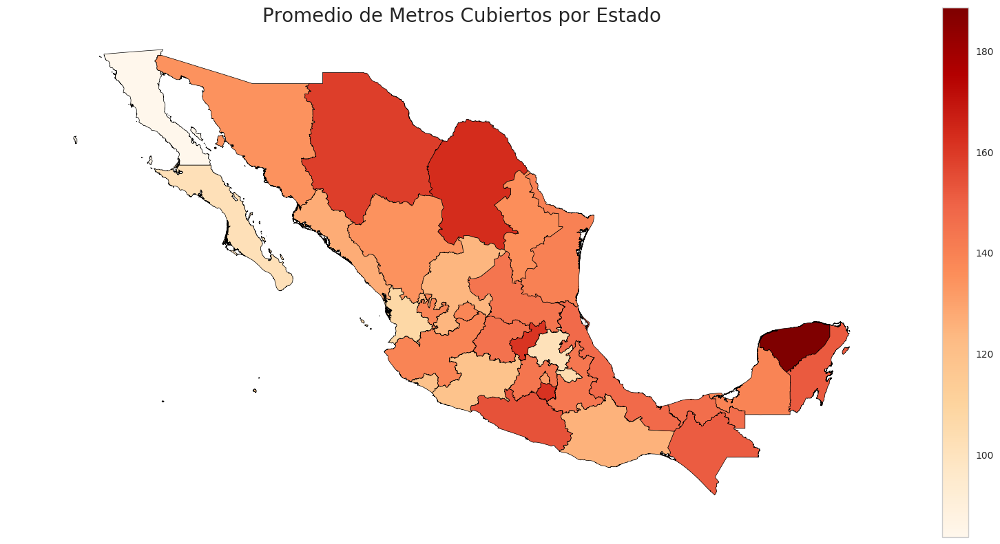

In [339]:
fig, grafico_metros_cubiertos_provincia = plt.subplots(1, figsize=(20, 10))
metros_cubiertos_mex.plot(column='metroscubiertos',cmap='OrRd', edgecolor='black',ax=grafico_metros_cubiertos_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_metros_cubiertos_provincia.axis('off')
grafico_metros_cubiertos_provincia.set_title("Promedio de Metros Cubiertos por Estado",fontsize=20)

#### 7.2.2) Por Habitaciones

In [179]:
habitaciones_metros_cubiertos=filtrado_metros[['habitaciones','metroscubiertos']].copy()
habitaciones_metros_cubiertos.dropna(inplace=True)
habitaciones_metros_cubiertos['habitaciones']=habitaciones_metros_totales['habitaciones'].astype('int32')
group_habitaciones_metros_cubiertos=habitaciones_metros_cubiertos.groupby(['habitaciones']).agg({'metroscubiertos':'mean'})
group_habitaciones_metros_cubiertos

,metroscubiertos
habitaciones,
1,78.141203
2,87.284807
3,163.129120
4,217.320471
5,224.295597
6,224.558904
7,217.196262
8,236.488095
9,219.806452


Text(0,0.5,'Metros Cubiertos Promedio')

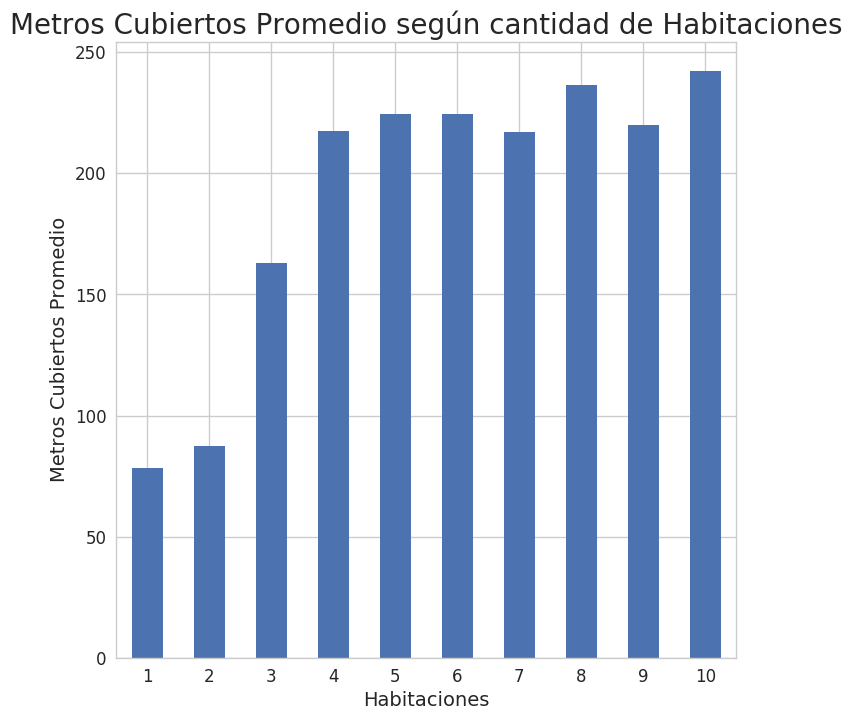

In [180]:
grafico_habitaciones_metros_cubiertos=group_habitaciones_metros_cubiertos.plot(kind='bar',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_habitaciones_metros_cubiertos.set_title("Metros Cubiertos Promedio según cantidad de Habitaciones",fontsize=20)
grafico_habitaciones_metros_cubiertos.set_xlabel("Habitaciones",fontsize=14)
grafico_habitaciones_metros_cubiertos.set_ylabel("Metros Cubiertos Promedio",fontsize=14)

#### 7.2.3) Por Antigüedad

In [181]:
antiguedad_metros_cubiertos=filtrado_metros[['antiguedad','metroscubiertos']].copy()
antiguedad_metros_cubiertos.dropna(inplace=True)
group_antiguedad_metros_cubiertos=antiguedad_metros_cubiertos.groupby(['antiguedad']).agg({'metroscubiertos':'mean'})
group_antiguedad_metros_cubiertos.head()

,metroscubiertos
antiguedad,
0.0,144.141506
1.0,145.758744
2.0,144.591979
3.0,136.201329
4.0,132.976762


Text(0,0.5,'Metros Cubiertos Promedio')

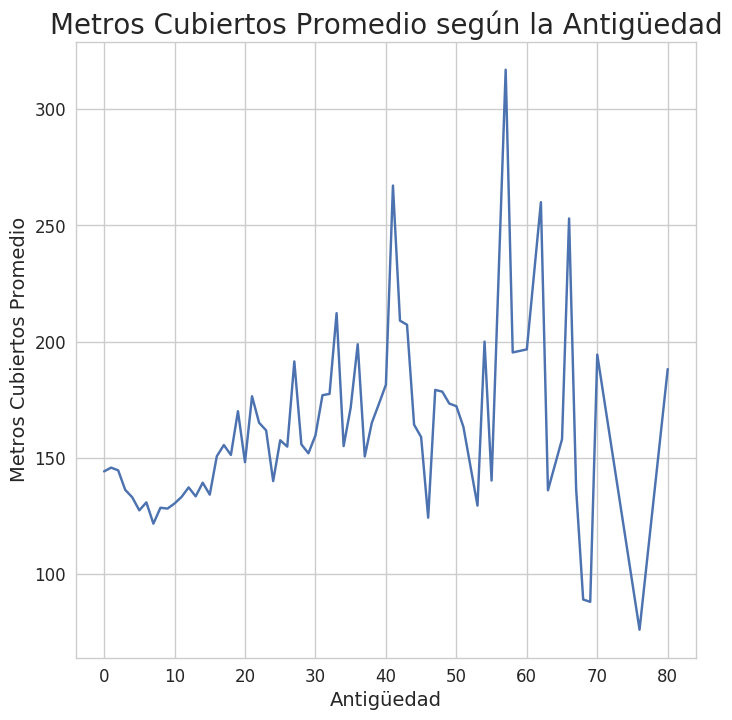

In [182]:
grafico_antiguedad_metros_cubiertos=group_antiguedad_metros_cubiertos.plot(kind='line',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_antiguedad_metros_cubiertos.set_title("Metros Cubiertos Promedio según la Antigüedad",fontsize=20)
grafico_antiguedad_metros_cubiertos.set_xlabel("Antigüedad",fontsize=14)
grafico_antiguedad_metros_cubiertos.set_ylabel("Metros Cubiertos Promedio",fontsize=14)

#### 7.2.4) Por Baños

In [183]:
baños_metros_cubiertos=filtrado_metros[['banos','metroscubiertos']].copy()
baños_metros_cubiertos.dropna(inplace=True)
baños_metros_cubiertos['banos']=baños_metros_cubiertos['banos'].astype('int32')
group_baños_metros_cubiertos=baños_metros_cubiertos.groupby(['banos']).agg({'metroscubiertos':'mean'})
group_baños_metros_cubiertos

,metroscubiertos
banos,
1,81.120719
2,141.336931
3,215.243955
4,257.827862


Text(0,0.5,'Metros Cubiertos Promedio')

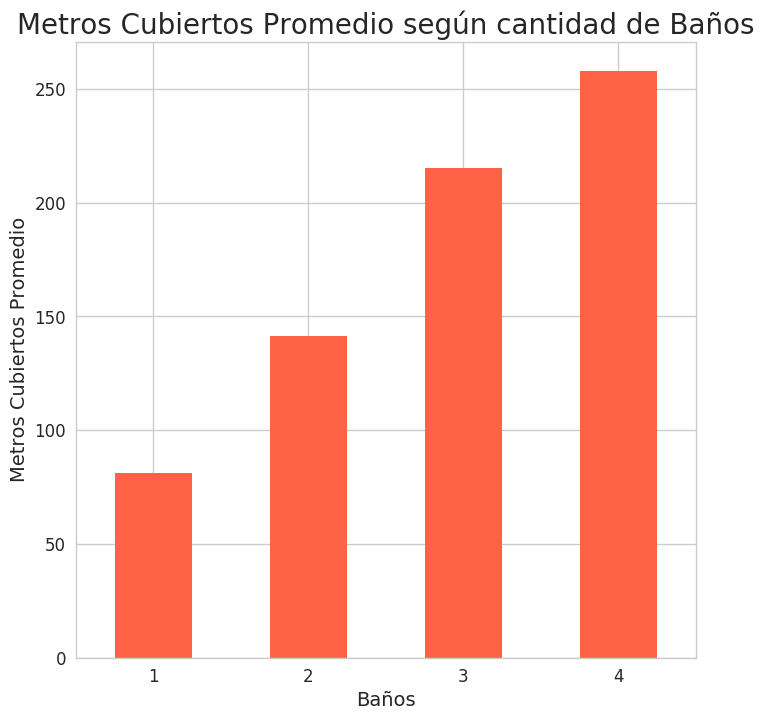

In [184]:
grafico_baños_metros_cubiertos=group_baños_metros_cubiertos.plot(kind='bar',color='tomato',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_baños_metros_cubiertos.set_title("Metros Cubiertos Promedio según cantidad de Baños",fontsize=20)
grafico_baños_metros_cubiertos.set_xlabel("Baños",fontsize=14)
grafico_baños_metros_cubiertos.set_ylabel("Metros Cubiertos Promedio",fontsize=14)

#### 7.2.5) Por Garages

In [186]:
garage_metros_cubiertos=filtrado_metros[['garages','metroscubiertos']].copy()
garage_metros_cubiertos.dropna(inplace=True)
garage_metros_cubiertos['garages']=garage_metros_cubiertos['garages'].astype('int32')
group_garage_metros_cubiertos=garage_metros_cubiertos.groupby(['garages']).agg({'metroscubiertos':'mean'})
group_garage_metros_cubiertos

,metroscubiertos
garages,
0,138.654787
1,89.067210
2,154.187553
3,218.666794


Text(0,0.5,'Metros Cubiertos Promedio')

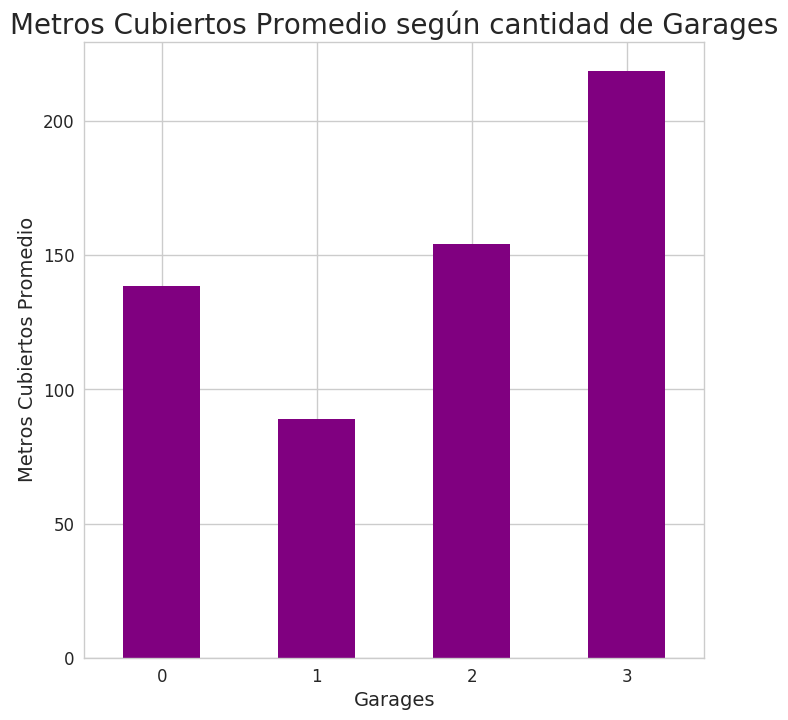

In [187]:
grafico_garage_metros_cubiertos=group_garage_metros_cubiertos.plot(kind='bar',color='purple',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_garage_metros_cubiertos.set_title("Metros Cubiertos Promedio según cantidad de Garages",fontsize=20)
grafico_garage_metros_cubiertos.set_xlabel("Garages",fontsize=14)
grafico_garage_metros_cubiertos.set_ylabel("Metros Cubiertos Promedio",fontsize=14)

#### 7.2.6) Por Gimnasio

In [188]:
gimnasio_metros_cubiertos=filtrado_metros[['gimnasio','metroscubiertos']].copy()
gimnasio_metros_cubiertos.dropna(inplace=True)
gimnasio_metros_cubiertos['gimnasio'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_gimnasio_metros_cubiertos=gimnasio_metros_cubiertos.groupby(['gimnasio']).agg({'metroscubiertos':'mean'})
group_gimnasio_metros_cubiertos

,metroscubiertos
gimnasio,
NO,139.595815
SI,161.619667


Text(0,0.5,'Metros Cubiertos Promedio')

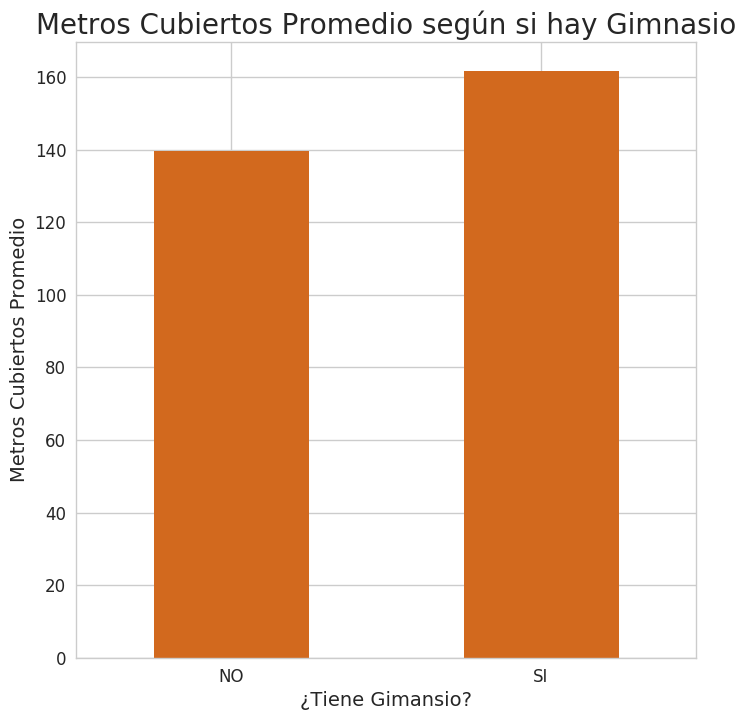

In [189]:
grafico_gimnasio_metros_cubiertos=group_gimnasio_metros_cubiertos.plot(kind='bar',color='chocolate',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_gimnasio_metros_cubiertos.set_title("Metros Cubiertos Promedio según si hay Gimnasio",fontsize=20)
grafico_gimnasio_metros_cubiertos.set_xlabel("¿Tiene Gimansio?",fontsize=14)
grafico_gimnasio_metros_cubiertos.set_ylabel("Metros Cubiertos Promedio",fontsize=14)

#### 7.2.7) Por Piscina

In [190]:
piscina_metros_cubiertos=filtrado_metros[['piscina','metroscubiertos']].copy()
piscina_metros_cubiertos.dropna(inplace=True)
piscina_metros_cubiertos['piscina'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_piscina_metros_cubiertos=piscina_metros_cubiertos.groupby(['piscina']).agg({'metroscubiertos':'mean'})
group_piscina_metros_cubiertos

,metroscubiertos
piscina,
NO,137.959421
SI,172.500711


Text(0,0.5,'Metros Cubiertos Promedio')

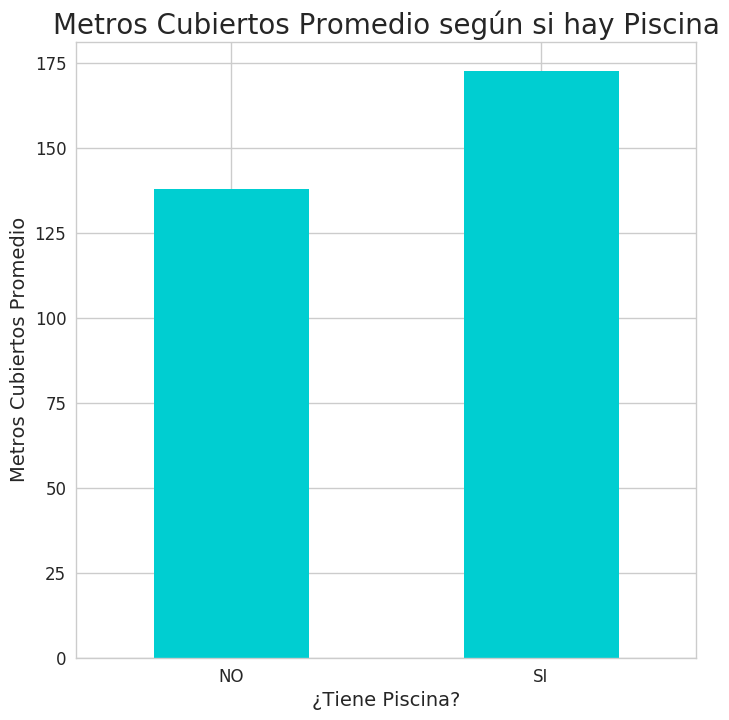

In [192]:
grafico_piscina_metros_cubiertos=group_piscina_metros_cubiertos.plot(kind='bar',color='darkturquoise',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_piscina_metros_cubiertos.set_title("Metros Cubiertos Promedio según si hay Piscina",fontsize=20)
grafico_piscina_metros_cubiertos.set_xlabel("¿Tiene Piscina?",fontsize=14)
grafico_piscina_metros_cubiertos.set_ylabel("Metros Cubiertos Promedio",fontsize=14)

#### 7.2.8) Por SUM

In [193]:
sum_metros_cubiertos=filtrado_metros[['usosmultiples','metroscubiertos']].copy()
sum_metros_cubiertos.dropna(inplace=True)
sum_metros_cubiertos['usosmultiples'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_sum_metros_cubiertos=sum_metros_cubiertos.groupby(['usosmultiples']).agg({'metroscubiertos':'mean'})
group_sum_metros_cubiertos

,metroscubiertos
usosmultiples,
NO,139.862694
SI,161.867247


Text(0,0.5,'Metros Cubiertos Promedio')

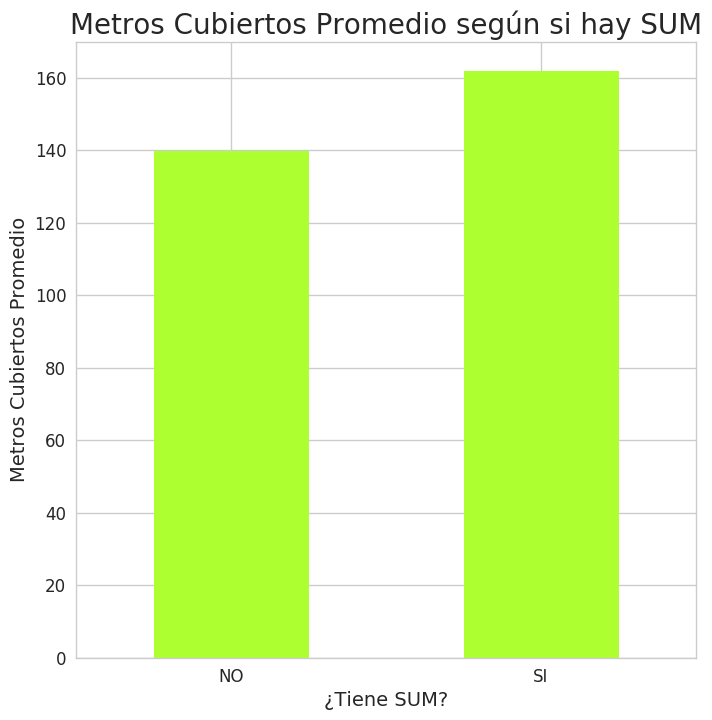

In [194]:
grafico_sum_metros_cubiertos=group_sum_metros_cubiertos.plot(kind='bar',color='greenyellow',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_sum_metros_cubiertos.set_title("Metros Cubiertos Promedio según si hay SUM",fontsize=20)
grafico_sum_metros_cubiertos.set_xlabel("¿Tiene SUM?",fontsize=14)
grafico_sum_metros_cubiertos.set_ylabel("Metros Cubiertos Promedio",fontsize=14)

#### 7.2.9) Relación entre Tipo de Propiedad y Gimnasio

In [34]:
pivot_gimnasio_tipo_metroscubiertos=gimnasio_tipo_metros.pivot_table(index='tipodepropiedad',columns='gimnasio',values='metroscubiertos',aggfunc='mean')
pivot_gimnasio_tipo_metroscubiertos.dropna(inplace=True)
pivot_gimnasio_tipo_metroscubiertos

gimnasio,NO,SI
tipodepropiedad,,
Apartamento,106.903769,150.218143
Casa,183.057447,209.352609
Casa en condominio,179.198490,206.927563
Departamento Compartido,107.972222,161.333333
Oficina comercial,166.227488,177.000000


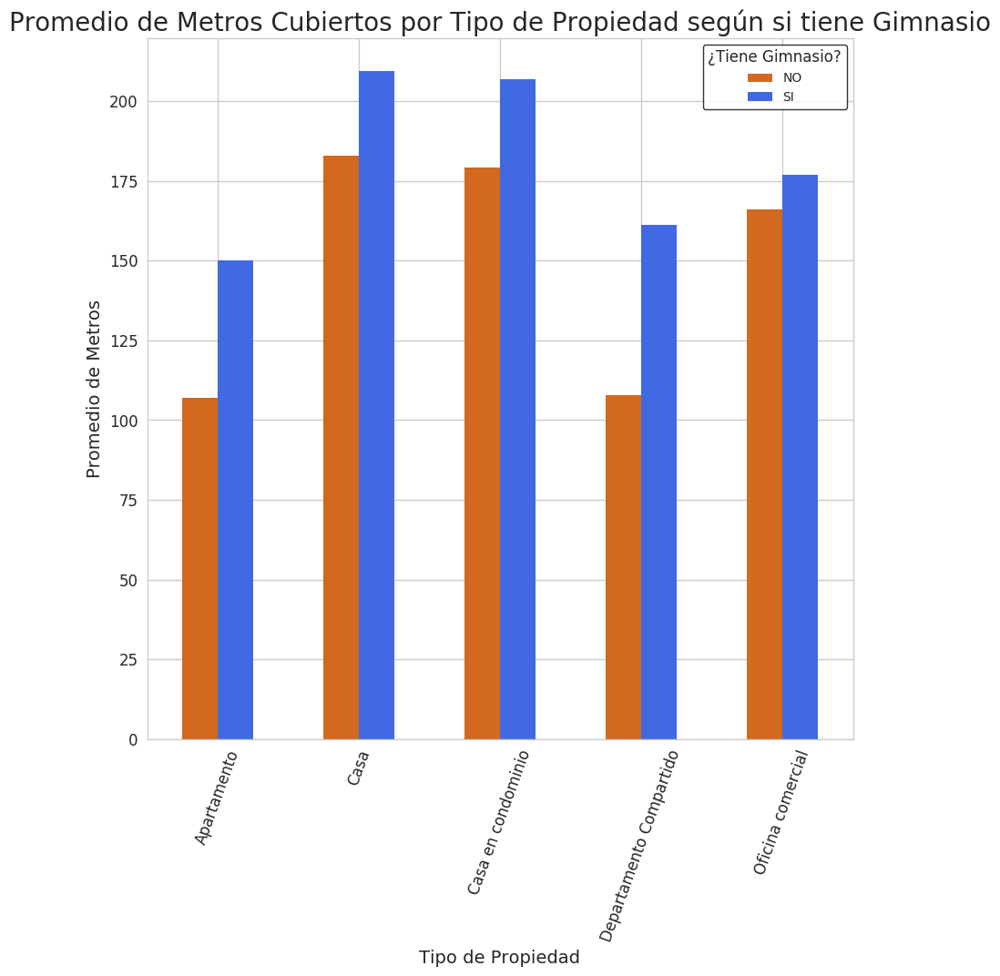

In [36]:
grafico_gimnasio_tipo_metroscubiertos=pivot_gimnasio_tipo_metroscubiertos.plot(kind='bar',color=['chocolate','royalblue'],rot=70,fontsize=12,figsize=(10,10))
grafico_gimnasio_tipo_metroscubiertos.set_title("Promedio de Metros Cubiertos por Tipo de Propiedad según si tiene Gimnasio",fontsize=20)
grafico_gimnasio_tipo_metroscubiertos.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_gimnasio_tipo_metroscubiertos.set_ylabel("Promedio de Metros",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene Gimnasio?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

#### 7.2.10) Relación entre Tipo de Propiedad y Piscina

In [37]:
pivot_piscina_tipo_metroscubiertos=piscina_tipo_metros.pivot_table(index='tipodepropiedad',columns='piscina',values='metroscubiertos',aggfunc='mean')
pivot_piscina_tipo_metroscubiertos.dropna(inplace=True)
pivot_piscina_tipo_metroscubiertos

piscina,NO,SI
tipodepropiedad,,
Apartamento,106.215553,156.046813
Casa,182.927972,205.600031
Casa en condominio,181.669759,176.973306
Departamento Compartido,110.825000,171.789474
Oficina comercial,166.227488,177.000000
Quinta Vacacional,177.407407,147.333333
Terreno,213.889026,234.884956
Villa,161.312500,203.604938


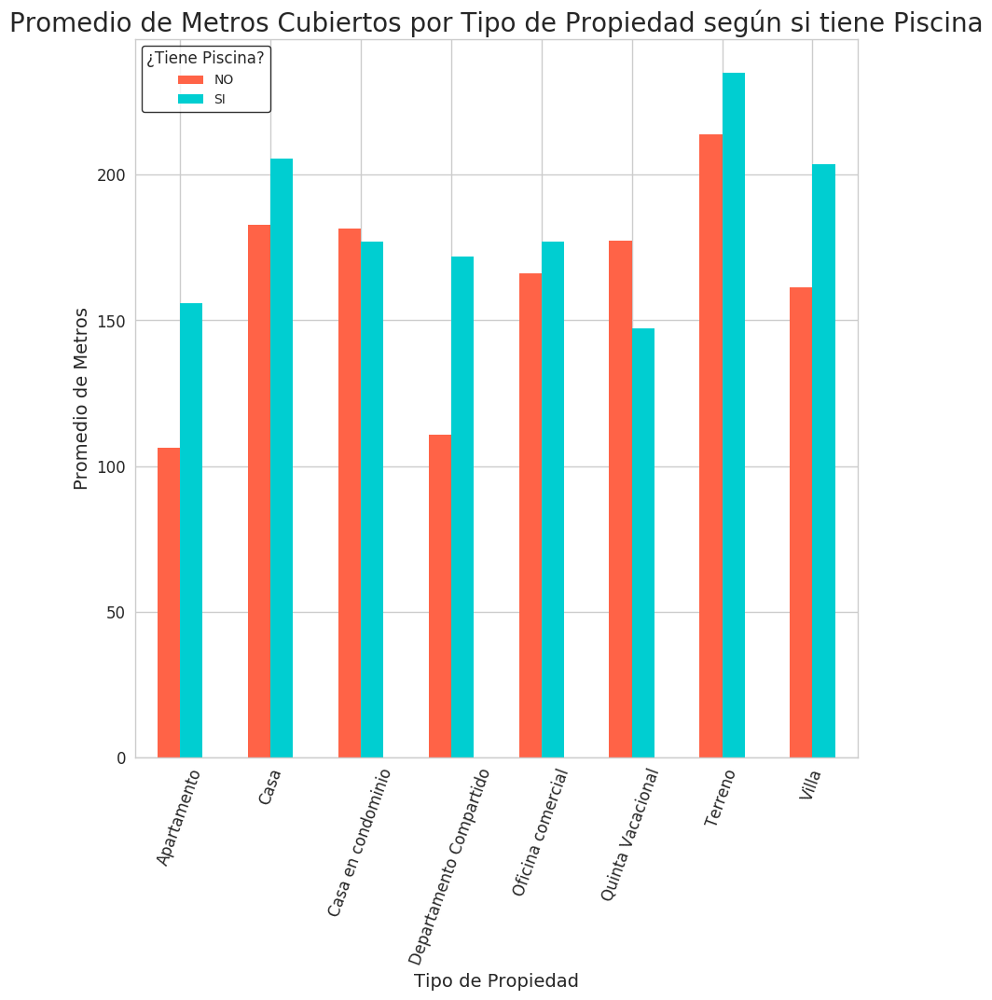

In [38]:
grafico_piscina_tipo_metroscubiertos=pivot_piscina_tipo_metroscubiertos.plot(kind='bar',color=['tomato','darkturquoise'],rot=70,fontsize=12,figsize=(10,10))
grafico_piscina_tipo_metroscubiertos.set_title("Promedio de Metros Cubiertos por Tipo de Propiedad según si tiene Piscina",fontsize=20)
grafico_piscina_tipo_metroscubiertos.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_piscina_tipo_metroscubiertos.set_ylabel("Promedio de Metros",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene Piscina?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

#### 7.2.11) Relación entre Tipo de Propiedad y SUM

In [40]:
pivot_sum_tipo_metroscubiertos=sum_tipo_metros.pivot_table(index='tipodepropiedad',columns='usosmultiples',values='metroscubiertos',aggfunc='mean')
pivot_sum_tipo_metroscubiertos.dropna(inplace=True)
pivot_sum_tipo_metroscubiertos

usosmultiples,NO,SI
tipodepropiedad,,
Apartamento,108.943025,144.460221
Casa,182.678463,227.145754
Casa en condominio,177.792821,209.760606
Departamento Compartido,113.308642,164.000000
Edificio,291.508741,186.000000
Oficina comercial,166.027284,256.000000


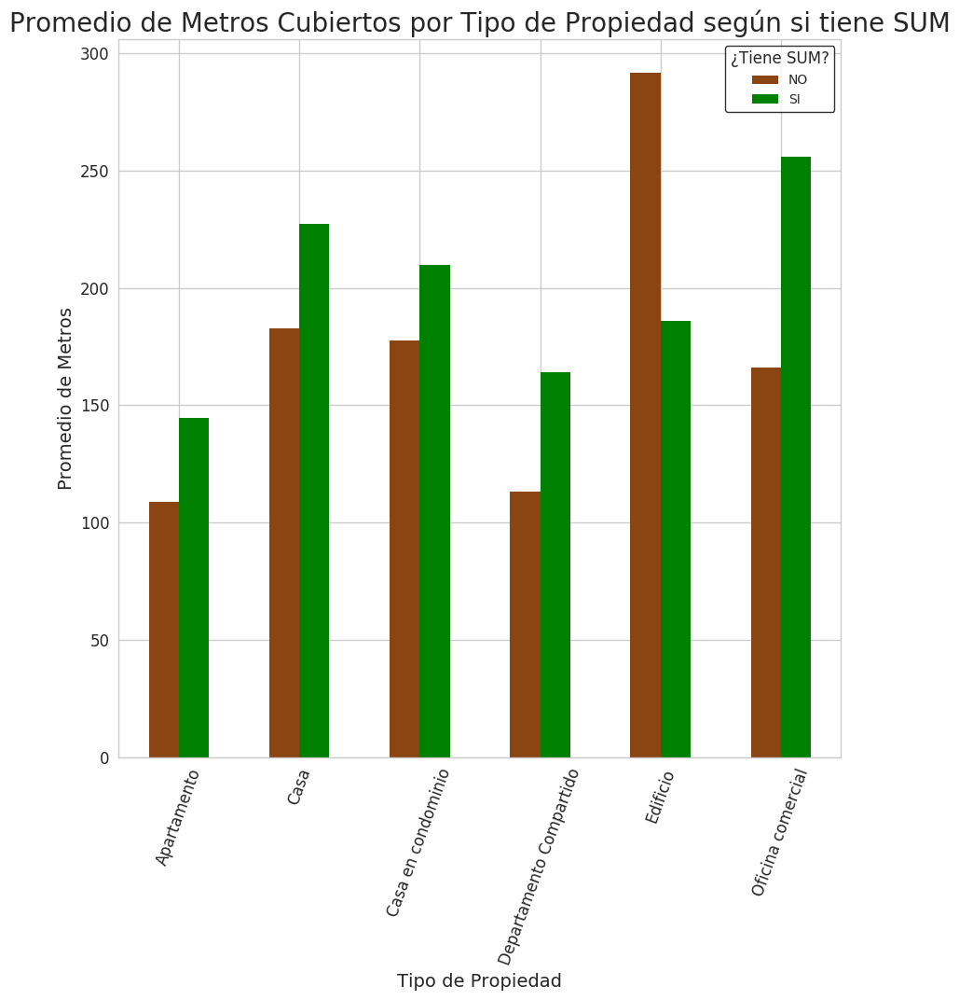

In [41]:
grafico_sum_tipo_metroscubiertos=pivot_sum_tipo_metroscubiertos.plot(kind='bar',color=['saddlebrown','green'],rot=70,fontsize=12,figsize=(10,10))
grafico_sum_tipo_metroscubiertos.set_title("Promedio de Metros Cubiertos por Tipo de Propiedad según si tiene SUM",fontsize=20)
grafico_sum_tipo_metroscubiertos.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_sum_tipo_metroscubiertos.set_ylabel("Promedio de Metros",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene SUM?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

### 7.3) Diferencia entre Metros Totales y Cubiertos

#### 7.3.1) Por Provincia

In [149]:
dif_metros=filtrado_metros.groupby(['provincia']).agg({'difmetros':'mean'})
dif_metros.reset_index(inplace=True)
dif_metros

,provincia,difmetros
0,Aguascalientes,35.037394
1,Baja California Norte,45.806389
2,Baja California Sur,79.634202
3,Campeche,67.496350
4,Chiapas,46.243792
5,Chihuahua,52.317953
6,Coahuila,47.135327
7,Colima,50.582593
8,Distrito Federal,16.004398
9,Durango,46.749565


In [340]:
dif_metros_mex=pd.merge(mex,dif_metros,on='provincia',how='left')
dif_metros_mex.fillna(0,inplace=True)
dif_metros_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,difmetros
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",35.037394
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",45.806389
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",67.496350
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,46.243792
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",52.317953


Text(0.5,1,'Promedio de la Diferencia de Metros Totales y Cubiertos por Estado')

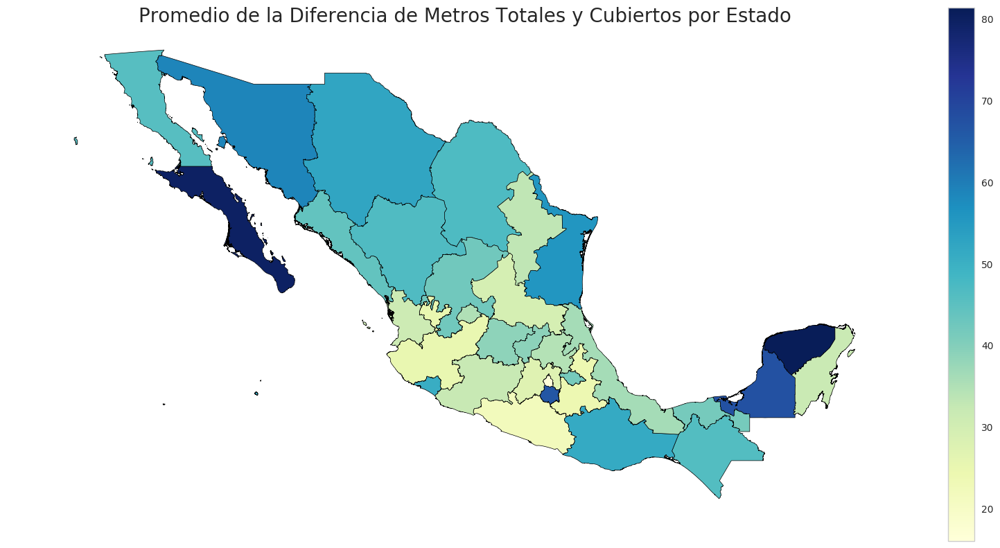

In [341]:
fig, grafico_dif_metros_provincia = plt.subplots(1, figsize=(20, 10))
dif_metros_mex.plot(column='difmetros',cmap='YlGnBu', edgecolor='black',ax=grafico_dif_metros_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_dif_metros_provincia.axis('off')
grafico_dif_metros_provincia.set_title("Promedio de la Diferencia de Metros Totales y Cubiertos por Estado",fontsize=20)

#### 7.3.2) Por Habitacion

In [195]:
habitaciones_metros_difmetros=filtrado_metros[['habitaciones','difmetros']].copy()
habitaciones_metros_difmetros.dropna(inplace=True)
habitaciones_metros_difmetros['habitaciones']=habitaciones_metros_difmetros['habitaciones'].astype('int32')
group_habitaciones_metros_difmetros=habitaciones_metros_difmetros.groupby(['habitaciones']).agg({'difmetros':'mean'})
group_habitaciones_metros_difmetros

,difmetros
habitaciones,
1,29.903623
2,24.973816
3,36.970257
4,45.091502
5,48.159030
6,50.356164
7,57.392523
8,54.785714
9,75.161290


Text(0,0.5,'Promedio de Diferencia de Metros')

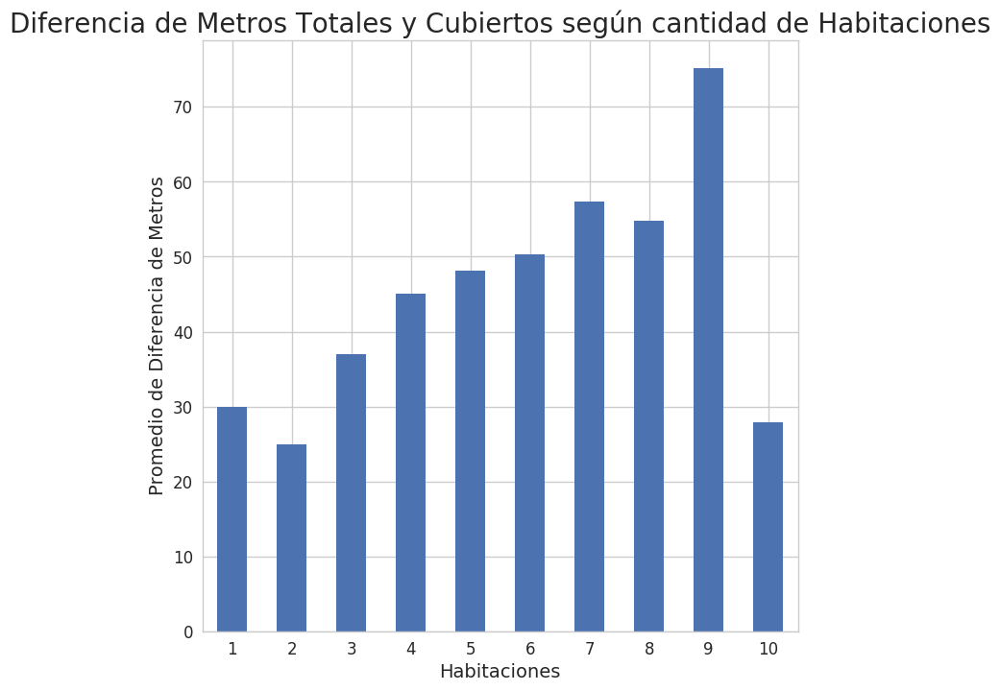

In [202]:
grafico_habitaciones_metros_difmetros=group_habitaciones_metros_difmetros.plot(kind='bar',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_habitaciones_metros_difmetros.set_title("Diferencia de Metros Totales y Cubiertos según cantidad de Habitaciones",fontsize=20)
grafico_habitaciones_metros_difmetros.set_xlabel("Habitaciones",fontsize=14)
grafico_habitaciones_metros_difmetros.set_ylabel("Promedio de Diferencia de Metros",fontsize=14)

#### 7.3.3) Por Antigüedad

In [198]:
antiguedad_metros_difmetros=filtrado_metros[['antiguedad','difmetros']].copy()
antiguedad_metros_difmetros.dropna(inplace=True)
group_antiguedad_metros_difmetros=antiguedad_metros_difmetros.groupby(['antiguedad']).agg({'difmetros':'mean'})
group_antiguedad_metros_difmetros.head()

,difmetros
antiguedad,
0.0,36.500676
1.0,37.507796
2.0,30.794246
3.0,32.208366
4.0,30.825200


Text(0,0.5,'Promedio de Diferencia de Metros')

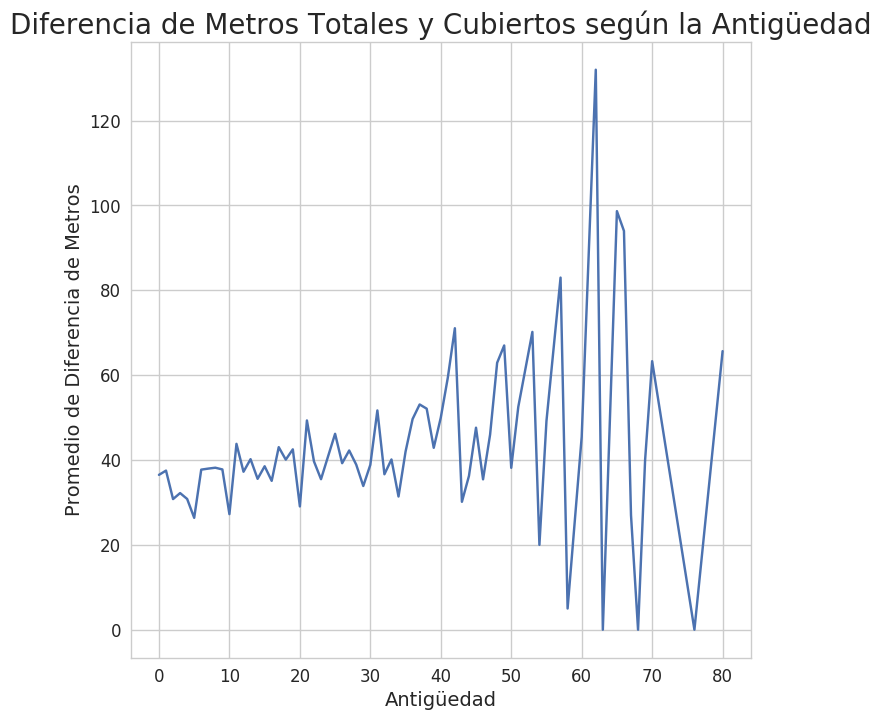

In [200]:
grafico_antiguedad_metros_difmetros=group_antiguedad_metros_difmetros.plot(kind='line',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_antiguedad_metros_difmetros.set_title("Diferencia de Metros Totales y Cubiertos según la Antigüedad",fontsize=20)
grafico_antiguedad_metros_difmetros.set_xlabel("Antigüedad",fontsize=14)
grafico_antiguedad_metros_difmetros.set_ylabel("Promedio de Diferencia de Metros",fontsize=14)

#### 7.3.4) Por Baños

In [203]:
baños_metros_difmetros=filtrado_metros[['banos','difmetros']].copy()
baños_metros_difmetros.dropna(inplace=True)
baños_metros_difmetros['banos']=baños_metros_difmetros['banos'].astype('int32')
group_baños_metros_difmetros=baños_metros_difmetros.groupby(['banos']).agg({'difmetros':'mean'})
group_baños_metros_difmetros

,difmetros
banos,
1,27.624504
2,33.361272
3,42.405858
4,43.280934


Text(0,0.5,'Promedio de Diferencia de Metros')

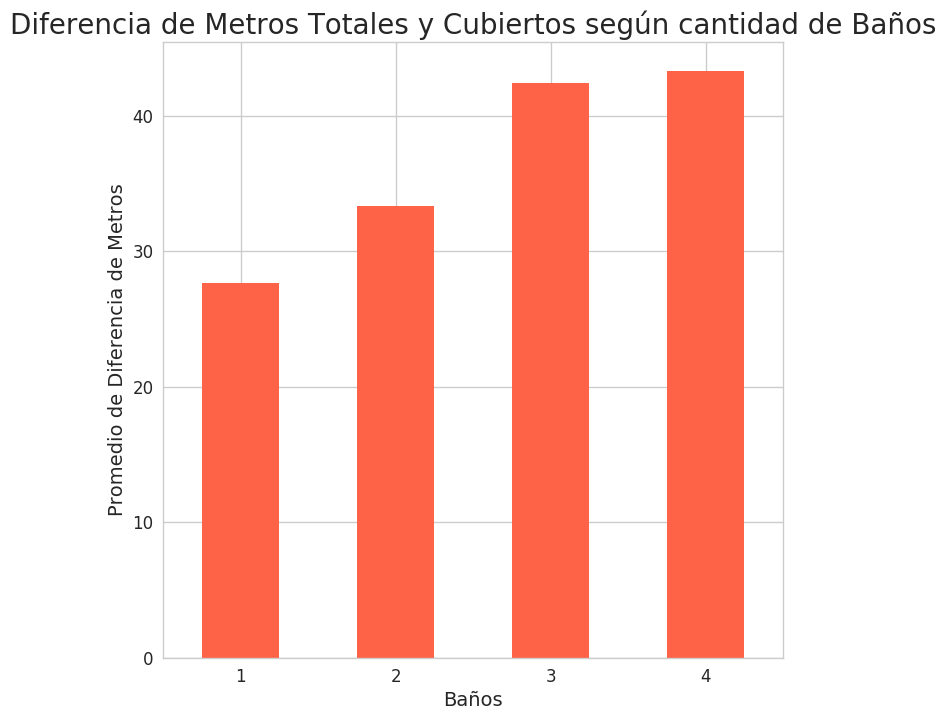

In [204]:
grafico_baños_metros_difmetros=group_baños_metros_difmetros.plot(kind='bar',color='tomato',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_baños_metros_difmetros.set_title("Diferencia de Metros Totales y Cubiertos según cantidad de Baños",fontsize=20)
grafico_baños_metros_difmetros.set_xlabel("Baños",fontsize=14)
grafico_baños_metros_difmetros.set_ylabel("Promedio de Diferencia de Metros",fontsize=14)

#### 7.3.5) Por Garage

In [205]:
garage_metros_difmetros=filtrado_metros[['garages','difmetros']].copy()
garage_metros_difmetros.dropna(inplace=True)
garage_metros_difmetros['garages']=garage_metros_difmetros['garages'].astype('int32')
group_garage_metros_difmetros=garage_metros_difmetros.groupby(['garages']).agg({'difmetros':'mean'})
group_garage_metros_difmetros

,difmetros
garages,
0,30.141702
1,19.906068
2,36.137530
3,47.098903


Text(0,0.5,'Promedio de Diferencia de Metros')

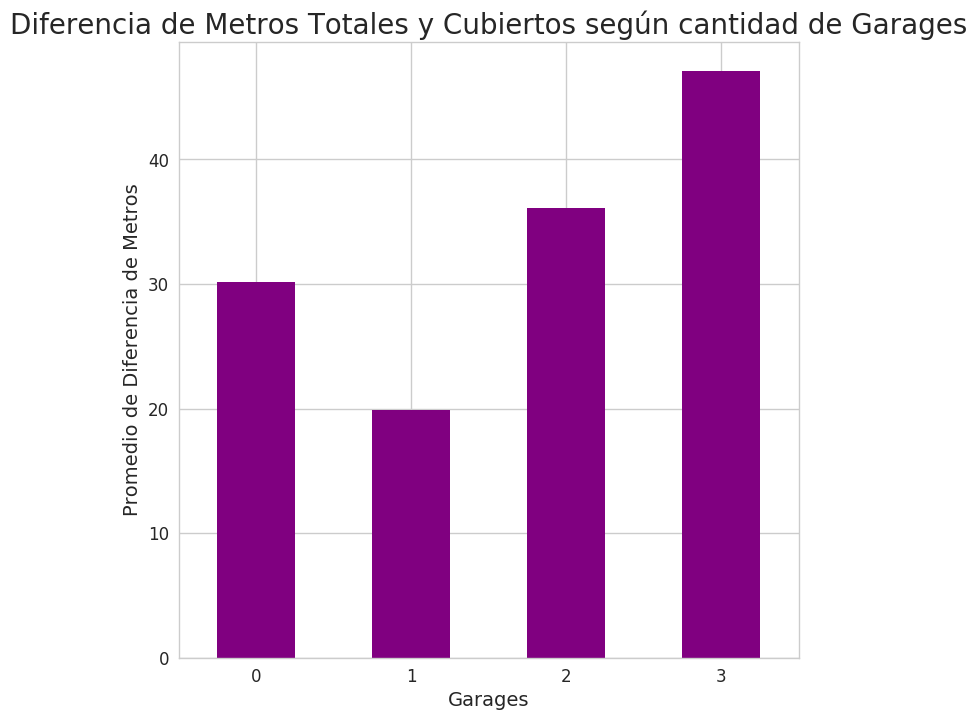

In [206]:
grafico_garage_metros_difmetros=group_garage_metros_difmetros.plot(kind='bar',color='purple',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_garage_metros_difmetros.set_title("Diferencia de Metros Totales y Cubiertos según cantidad de Garages",fontsize=20)
grafico_garage_metros_difmetros.set_xlabel("Garages",fontsize=14)
grafico_garage_metros_difmetros.set_ylabel("Promedio de Diferencia de Metros",fontsize=14)

#### 7.3.6) Por Gimnasio

In [207]:
gimnasio_metros_difmetros=filtrado_metros[['gimnasio','difmetros']].copy()
gimnasio_metros_difmetros.dropna(inplace=True)
gimnasio_metros_difmetros['gimnasio'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_gimnasio_metros_difmetros=gimnasio_metros_difmetros.groupby(['gimnasio']).agg({'difmetros':'mean'})
group_gimnasio_metros_difmetros

,difmetros
gimnasio,
NO,34.323201
SI,21.974284


Text(0,0.5,'Promedio de Diferencia de Metros')

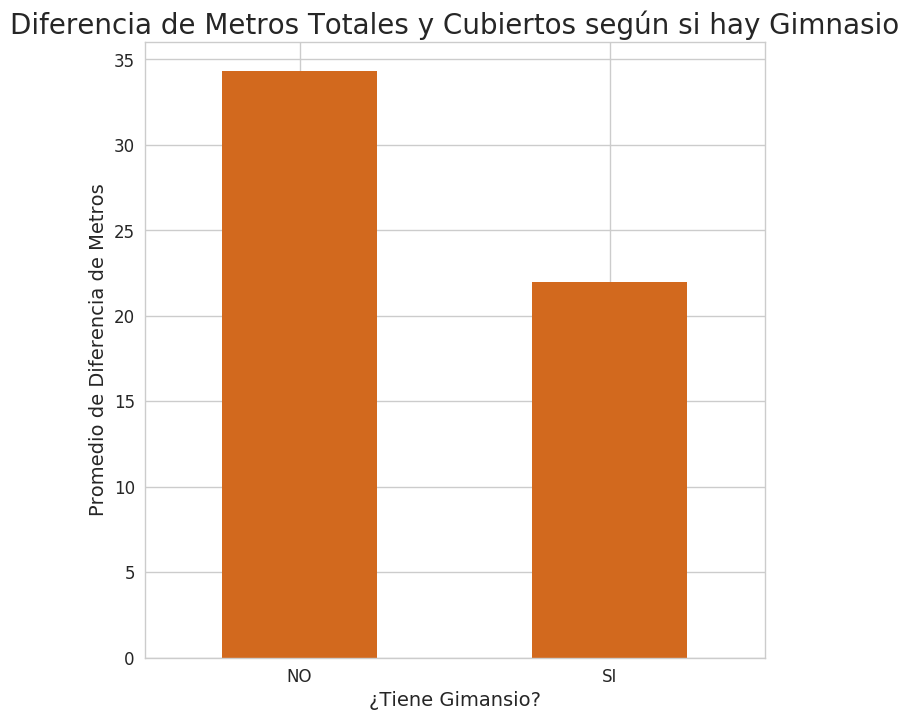

In [208]:
grafico_gimnasio_metros_difmetros=group_gimnasio_metros_difmetros.plot(kind='bar',color='chocolate',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_gimnasio_metros_difmetros.set_title("Diferencia de Metros Totales y Cubiertos según si hay Gimnasio",fontsize=20)
grafico_gimnasio_metros_difmetros.set_xlabel("¿Tiene Gimansio?",fontsize=14)
grafico_gimnasio_metros_difmetros.set_ylabel("Promedio de Diferencia de Metros",fontsize=14)

#### 7.3.7) Por Piscina

In [209]:
piscina_metros_difmetros=filtrado_metros[['piscina','difmetros']].copy()
piscina_metros_difmetros.dropna(inplace=True)
piscina_metros_difmetros['piscina'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_piscina_metros_difmetros=piscina_metros_difmetros.groupby(['piscina']).agg({'difmetros':'mean'})
group_piscina_metros_difmetros

,difmetros
piscina,
NO,33.461542
SI,33.721037


Text(0,0.5,'Promedio de Diferencia de Metros')

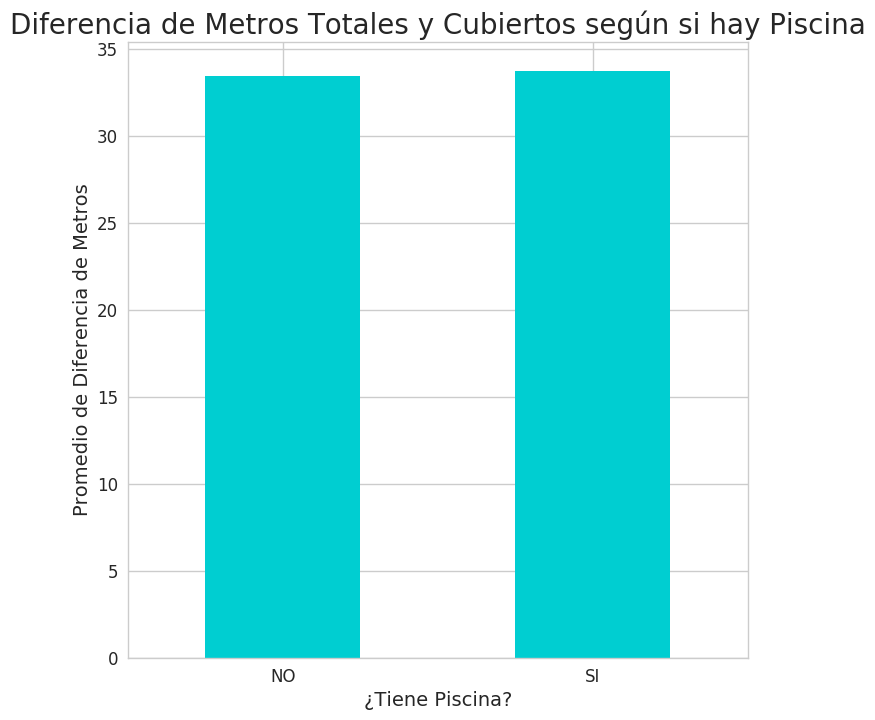

In [210]:
grafico_piscina_metros_difmetros=group_piscina_metros_difmetros.plot(kind='bar',color='darkturquoise',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_piscina_metros_difmetros.set_title("Diferencia de Metros Totales y Cubiertos según si hay Piscina",fontsize=20)
grafico_piscina_metros_difmetros.set_xlabel("¿Tiene Piscina?",fontsize=14)
grafico_piscina_metros_difmetros.set_ylabel("Promedio de Diferencia de Metros",fontsize=14)

#### 7.3.8) Por SUM

In [211]:
sum_metros_difmetros=filtrado_metros[['usosmultiples','difmetros']].copy()
sum_metros_difmetros.dropna(inplace=True)
sum_metros_difmetros['usosmultiples'].replace({0.0:'NO',1.0:'SI'},inplace=True)
group_sum_metros_difmetros=sum_metros_difmetros.groupby(['usosmultiples']).agg({'difmetros':'mean'})
group_sum_metros_difmetros

,difmetros
usosmultiples,
NO,34.282530
SI,19.991647


Text(0,0.5,'Promedio de Diferencia de Metros')

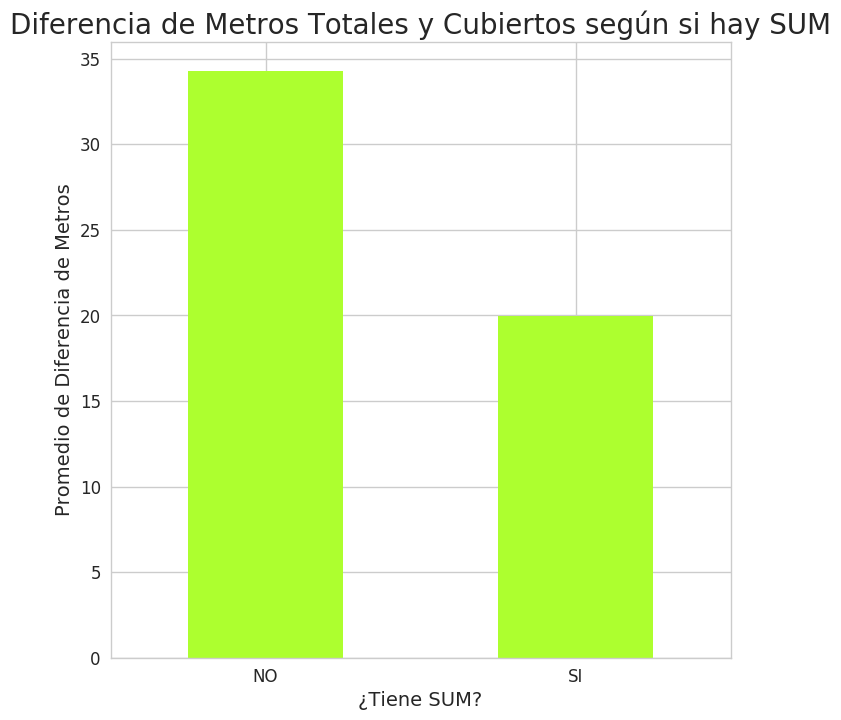

In [212]:
grafico_sum_metros_difmetros=group_sum_metros_difmetros.plot(kind='bar',color='greenyellow',fontsize=12,figsize=(8,8),rot=0,legend=False)
grafico_sum_metros_difmetros.set_title("Diferencia de Metros Totales y Cubiertos según si hay SUM",fontsize=20)
grafico_sum_metros_difmetros.set_xlabel("¿Tiene SUM?",fontsize=14)
grafico_sum_metros_difmetros.set_ylabel("Promedio de Diferencia de Metros",fontsize=14)

## 8) Propiedades en Avenidas

### 8.1) Cantidad de Propieadades

In [262]:
direccion=propiedades[['provincia','tipodepropiedad','direccion']].copy()
direccion.dropna(inplace=True)
direccion['avenida']=direccion.direccion.str.contains('AV|av|Avenida|avenida')
direccion.head()

,provincia,tipodepropiedad,direccion,avenida
0,Distrito Federal,Apartamento,Avenida Division del Norte 2005,True
1,Distrito Federal,Casa en condominio,AV. MEXICO,True
2,Jalisco,Casa,Urbi Tonala,False
3,Edo. de México,Casa,IGNACIO MANUEL ALTAMIRANO 128,False
4,Jalisco,Apartamento,PASEOS DEL SOL,False


In [263]:
cantidad_direcciones_avenida=direccion['avenida'].value_counts().reset_index()
cantidad_direcciones_avenida.replace({False:'NO',True:'SI'},inplace=True)
cantidad_direcciones_avenida.set_index('index',inplace=True)
cantidad_direcciones_avenida

,avenida
index,
NO,174344
SI,12515


Text(0,0.5,'¿Está en una Avenida?')

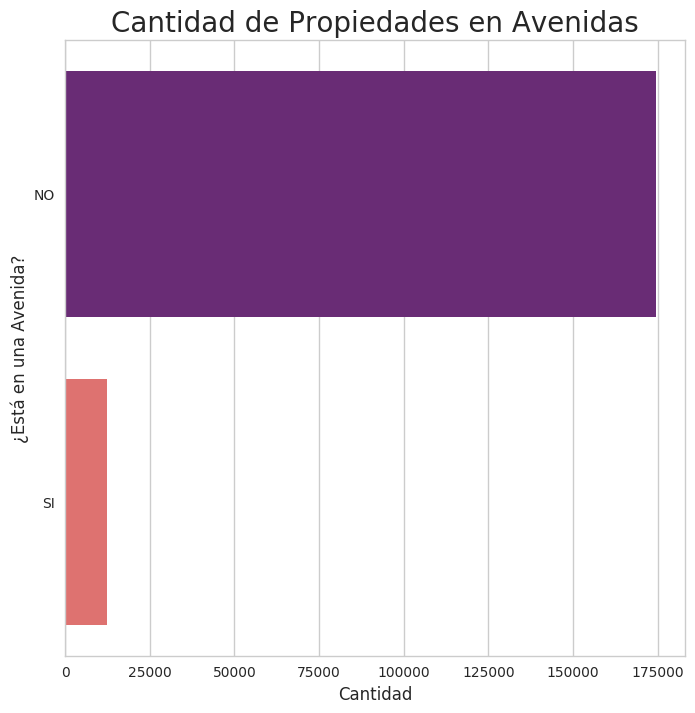

In [265]:
plt.subplots(figsize=(8,8))
grafico_avenida=sns.barplot(x=cantidad_direcciones_avenida['avenida'],y=cantidad_direcciones_avenida.index,orient='h',palette='magma')
grafico_avenida.set_title("Cantidad de Propiedades en Avenidas",fontsize=20)
grafico_avenida.set_xlabel("Cantidad",fontsize=12)
grafico_avenida.set_ylabel("¿Está en una Avenida?",fontsize=12)

### 8.2) Tipo de Propiedad en Avenida

In [266]:
propiedades_avenida=direccion[(direccion['avenida']==True)]
tipo_avenida=propiedades_avenida['tipodepropiedad'].value_counts().head(8)
tipo_avenida

Casa                  6170
Apartamento           4097
Casa en condominio    1071
Terreno                423
Local Comercial        255
Oficina comercial      138
Edificio                92
Bodega comercial        67
Name: tipodepropiedad, dtype: int64

Text(0,0.5,'Tipo de Propiedad')

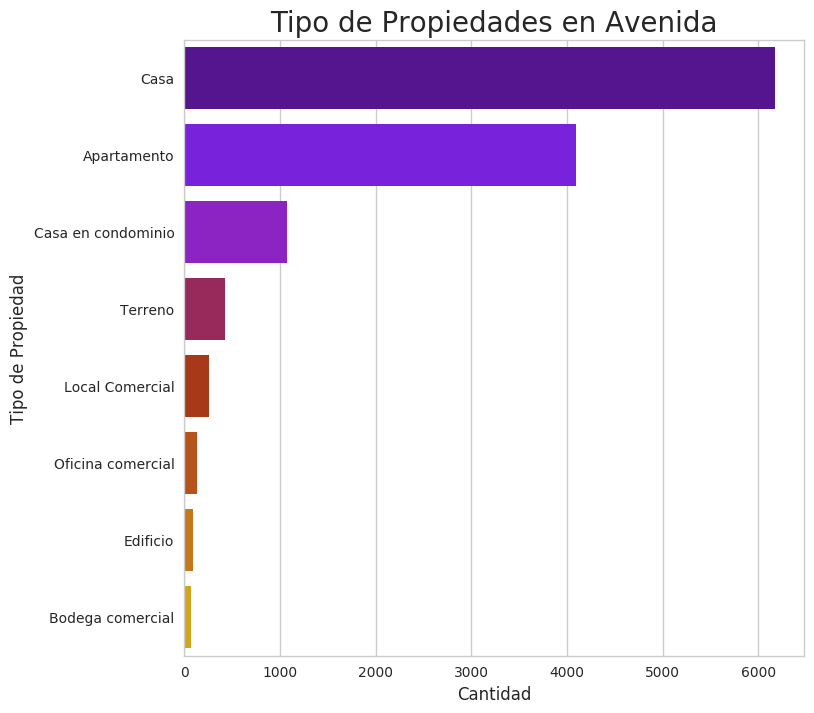

In [267]:
plt.subplots(figsize=(8,8))
grafico_tipo_avenida=sns.barplot(x=tipo_avenida.values,y=tipo_avenida.index,orient='h',palette='gnuplot')
grafico_tipo_avenida.set_title("Tipo de Propiedades en Avenida",fontsize=20)
grafico_tipo_avenida.set_xlabel("Cantidad",fontsize=12)
grafico_tipo_avenida.set_ylabel("Tipo de Propiedad",fontsize=12)

### 8.3) Cantidad según Provincia

In [268]:
cantidad_provincia_avenida=propiedades_avenida['provincia'].value_counts().reset_index()
cantidad_provincia_avenida.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_provincia_avenida

,provincia,cantidad
0,Distrito Federal,3927
1,Edo. de México,2690
2,Jalisco,1569
3,Morelos,582
4,Querétaro,502
5,Puebla,442
6,Nuevo León,400
7,Quintana Roo,386
8,San luis Potosí,262
9,Baja California Norte,205


In [269]:
provincia_avenida=pd.merge(mex,cantidad_provincia_avenida,on='provincia',how='left')
provincia_avenida.fillna(0,inplace=True)
provincia_avenida.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",76
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",205
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",11
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,72
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",88


Text(0.5,1,'Cantidad de Propiedades sobre Avenidas por Provincia')

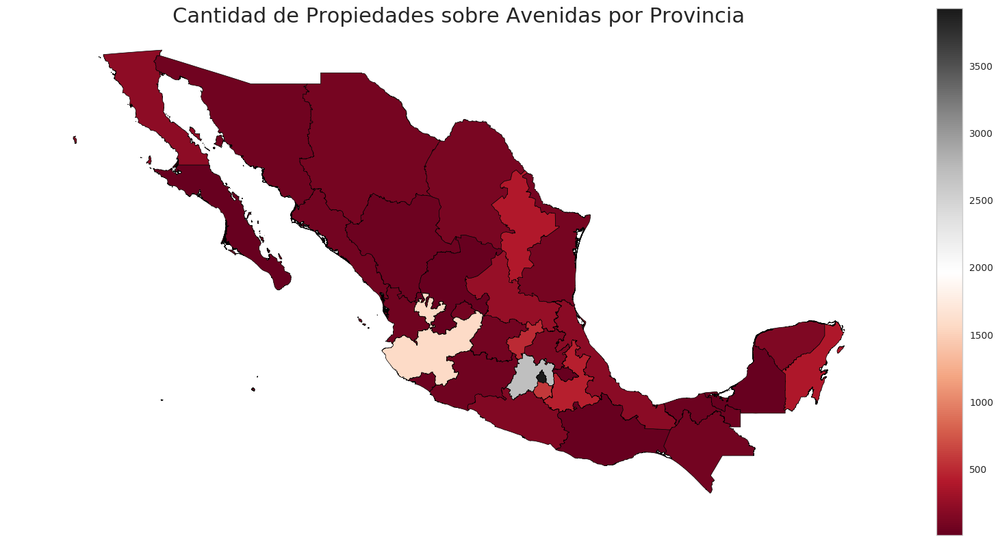

In [271]:
fig, grafico_provincia_avenida = plt.subplots(1, figsize=(20, 10))
provincia_avenida.plot(column='cantidad',cmap='RdGy', edgecolor='black',ax=grafico_provincia_avenida,legend=True,figsize=(30,30),linewidth=0.5)
grafico_provincia_avenida.axis('off')
grafico_provincia_avenida.set_title("Cantidad de Propiedades sobre Avenidas por Provincia",fontsize=22)

## 9) Tipos de Propiedades

In [272]:
baños_hab_garages_tipo=propiedades[['tipodepropiedad','habitaciones','garages','banos']].copy()
baños_hab_garages_tipo.dropna(inplace=True)
baños_hab_garages_tipo['Valor']=1
baños_hab_garages_tipo['Valor']=baños_hab_garages_tipo['Valor'].astype('int32')
baños_hab_garages_tipo['habitaciones']=baños_hab_garages_tipo['habitaciones'].astype('int32')
baños_hab_garages_tipo['garages']=baños_hab_garages_tipo['garages'].astype('int32')
baños_hab_garages_tipo['banos']=baños_hab_garages_tipo['banos'].astype('int32')
baños_tipo=baños_hab_garages_tipo.pivot_table(index='tipodepropiedad',columns='banos',values='Valor',aggfunc='sum')
habitaciones_tipo=baños_hab_garages_tipo.pivot_table(index='tipodepropiedad',columns='habitaciones',values='Valor',aggfunc='sum')
garages_tipo=baños_hab_garages_tipo.pivot_table(index='tipodepropiedad',columns='garages',values='Valor',aggfunc='sum')
baños_tipo.fillna(0,inplace=True)
habitaciones_tipo.fillna(0,inplace=True)
garages_tipo.fillna(0,inplace=True)

### 9.1) Según Baños

[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Departamento Compartido'),
 Text(0,6.5,'Duplex'),
 Text(0,7.5,'Edificio'),
 Text(0,8.5,'Huerta'),
 Text(0,9.5,'Inmuebles productivos urbanos'),
 Text(0,10.5,'Local Comercial'),
 Text(0,11.5,'Local en centro comercial'),
 Text(0,12.5,'Nave industrial'),
 Text(0,13.5,'Oficina comercial'),
 Text(0,14.5,'Otros'),
 Text(0,15.5,'Quinta Vacacional'),
 Text(0,16.5,'Rancho'),
 Text(0,17.5,'Terreno'),
 Text(0,18.5,'Terreno comercial'),
 Text(0,19.5,'Terreno industrial'),
 Text(0,20.5,'Villa')]

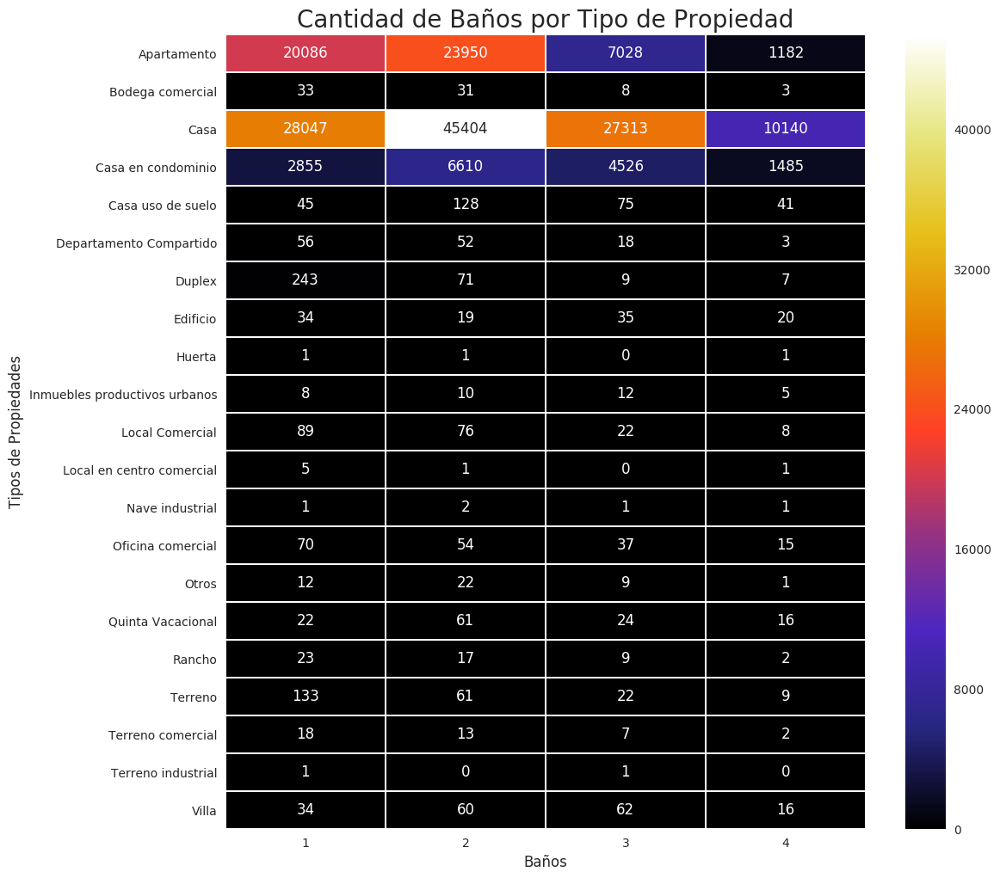

In [273]:
plt.subplots(figsize=(12,12))
grafico_baño_tipo=sns.heatmap(baños_tipo,linewidths=.5,fmt=".0f",annot=True,cmap="CMRmap")
grafico_baño_tipo.set_title("Cantidad de Baños por Tipo de Propiedad",fontsize=20)
grafico_baño_tipo.set_xlabel("Baños",fontsize=12)
grafico_baño_tipo.set_ylabel("Tipos de Propiedades",fontsize=12)
grafico_baño_tipo.set_yticklabels(grafico_baño_tipo.get_yticklabels(),rotation=0)

### 9.2) Según  Habitaciones

[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Departamento Compartido'),
 Text(0,6.5,'Duplex'),
 Text(0,7.5,'Edificio'),
 Text(0,8.5,'Huerta'),
 Text(0,9.5,'Inmuebles productivos urbanos'),
 Text(0,10.5,'Local Comercial'),
 Text(0,11.5,'Local en centro comercial'),
 Text(0,12.5,'Nave industrial'),
 Text(0,13.5,'Oficina comercial'),
 Text(0,14.5,'Otros'),
 Text(0,15.5,'Quinta Vacacional'),
 Text(0,16.5,'Rancho'),
 Text(0,17.5,'Terreno'),
 Text(0,18.5,'Terreno comercial'),
 Text(0,19.5,'Terreno industrial'),
 Text(0,20.5,'Villa')]

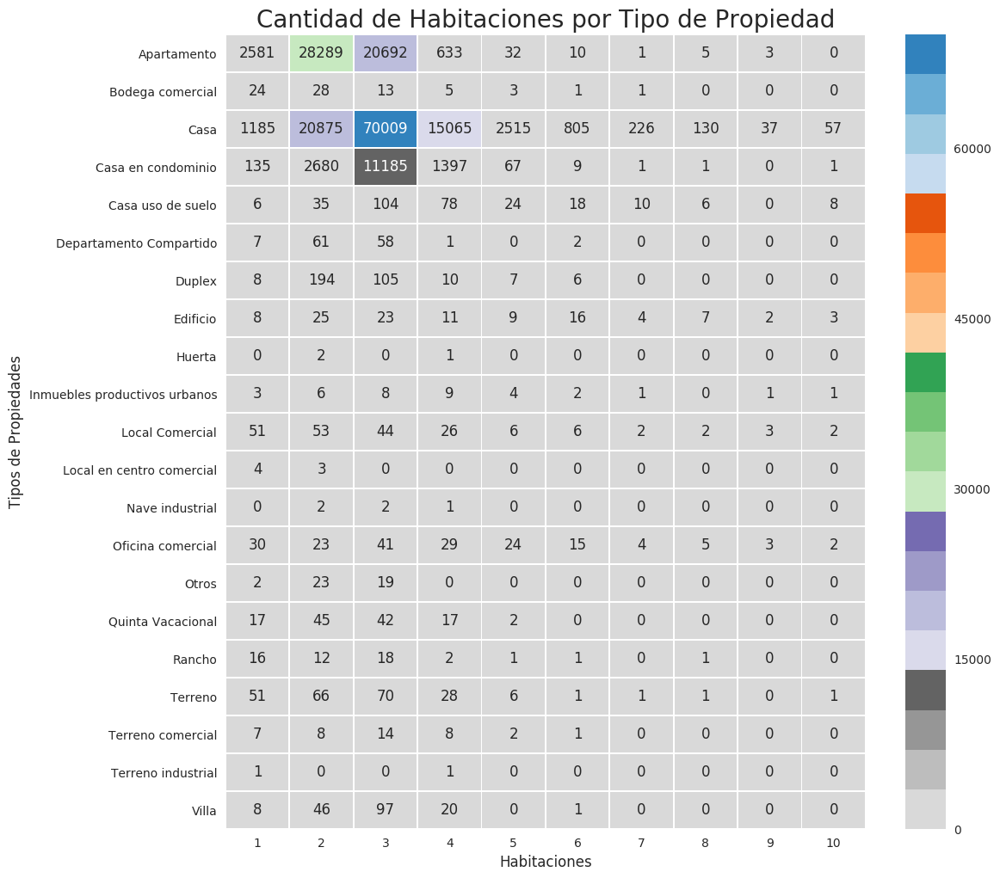

In [274]:
plt.subplots(figsize=(12,12))
grafico_habitaciones_tipo=sns.heatmap(habitaciones_tipo,linewidths=.5,fmt=".0f",annot=True,cmap="tab20c_r")
grafico_habitaciones_tipo.set_title("Cantidad de Habitaciones por Tipo de Propiedad",fontsize=20)
grafico_habitaciones_tipo.set_xlabel("Habitaciones",fontsize=12)
grafico_habitaciones_tipo.set_ylabel("Tipos de Propiedades",fontsize=12)
grafico_habitaciones_tipo.set_yticklabels(grafico_baño_tipo.get_yticklabels(),rotation=0)

### 9.3) Según Garages

[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Departamento Compartido'),
 Text(0,6.5,'Duplex'),
 Text(0,7.5,'Edificio'),
 Text(0,8.5,'Huerta'),
 Text(0,9.5,'Inmuebles productivos urbanos'),
 Text(0,10.5,'Local Comercial'),
 Text(0,11.5,'Local en centro comercial'),
 Text(0,12.5,'Nave industrial'),
 Text(0,13.5,'Oficina comercial'),
 Text(0,14.5,'Otros'),
 Text(0,15.5,'Quinta Vacacional'),
 Text(0,16.5,'Rancho'),
 Text(0,17.5,'Terreno'),
 Text(0,18.5,'Terreno comercial'),
 Text(0,19.5,'Terreno industrial'),
 Text(0,20.5,'Villa')]

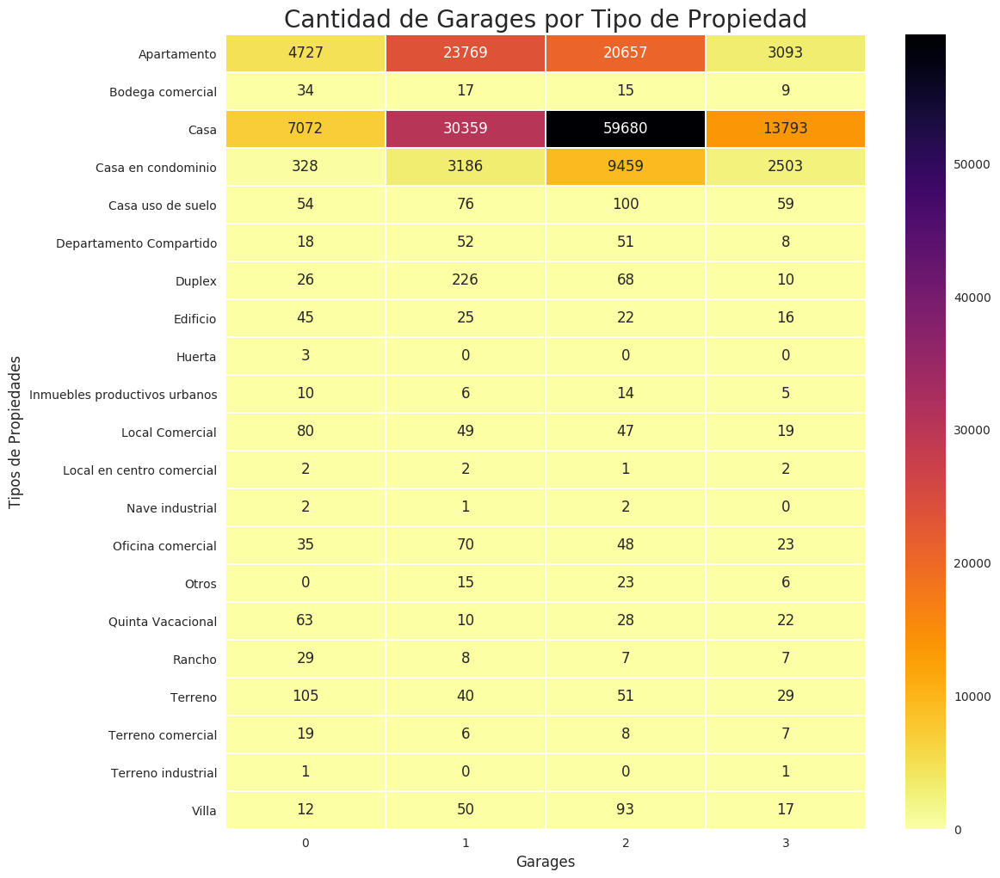

In [275]:
plt.subplots(figsize=(12,12))
grafico_garages_tipo=sns.heatmap(garages_tipo,linewidths=.5,fmt=".0f",annot=True,cmap="inferno_r")
grafico_garages_tipo.set_title("Cantidad de Garages por Tipo de Propiedad",fontsize=20)
grafico_garages_tipo.set_xlabel("Garages",fontsize=12)
grafico_garages_tipo.set_ylabel("Tipos de Propiedades",fontsize=12)
grafico_garages_tipo.set_yticklabels(grafico_baño_tipo.get_yticklabels(),rotation=0)

### 9.4) Según Piscina

In [286]:
piscina_tipo=propiedades[['tipodepropiedad','piscina']].copy()
piscina_tipo_top=pd.merge(piscina_tipo,tipo_propiedad_top,on='tipodepropiedad',how='inner')
piscina_tipo_top['piscina'].replace({0:'NO',1:'SI'},inplace=True)
piscina_tipo_top['Valor']=1
piscina_tipo_top.dropna(inplace=True)
group_piscina_top=piscina_tipo_top.pivot_table(index='tipodepropiedad',columns='piscina',values='Valor',aggfunc='sum')
group_piscina_top.fillna(0,inplace=True)
group_piscina_top

piscina,NO,SI
tipodepropiedad,,
Apartamento,49246.0,8095.0
Bodega comercial,1406.0,0.0
Casa,132608.0,9109.0
Casa en condominio,16324.0,2973.0
Casa uso de suelo,708.0,0.0
Edificio,1395.0,1.0
Local Comercial,3055.0,0.0
Oficina comercial,1740.0,1.0
Terreno,9456.0,489.0


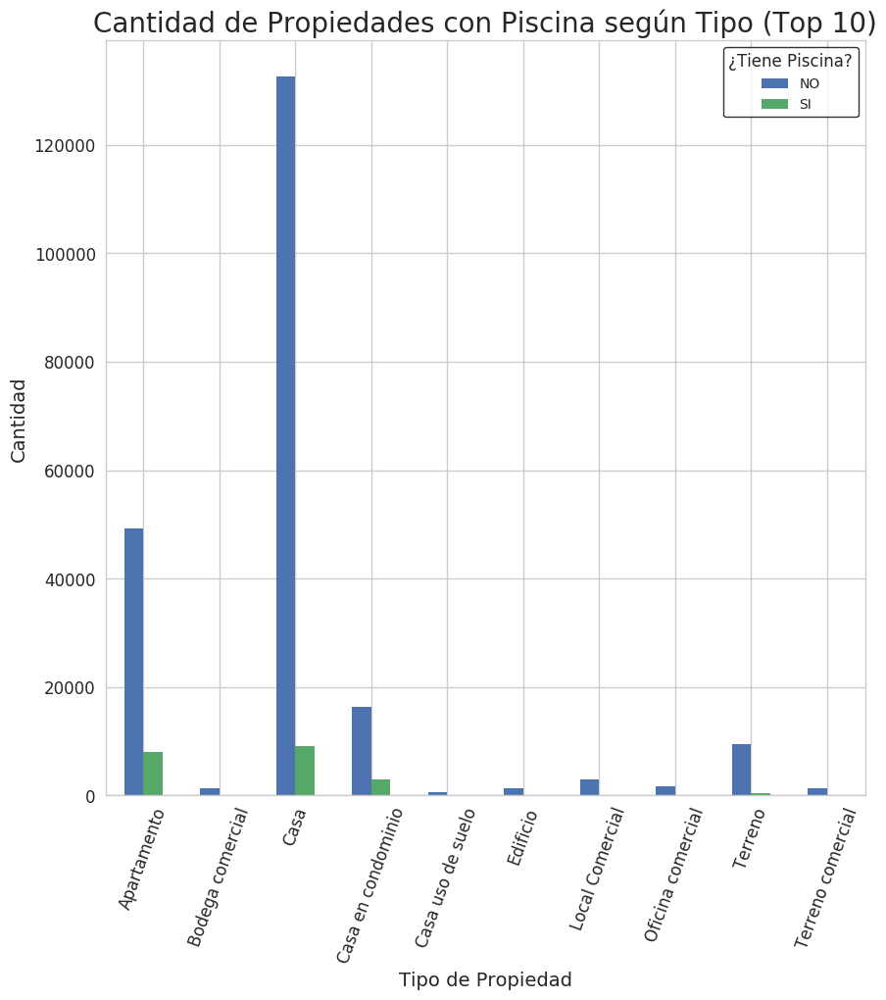

In [305]:
grafico_piscina_tipo=group_piscina_top.plot(kind='bar',rot=70,fontsize=12,figsize=(10,10))
grafico_piscina_tipo.set_title("Cantidad de Propiedades con Piscina según Tipo (Top 10)",fontsize=20)
grafico_piscina_tipo.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_piscina_tipo.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene Piscina?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

### 9.5) Según Gimnasio

In [291]:
gimnasio_tipo=propiedades[['tipodepropiedad','gimnasio']].copy()
gimnasio_tipo_top=pd.merge(gimnasio_tipo,tipo_propiedad_top,on='tipodepropiedad',how='inner')
gimnasio_tipo_top['gimnasio'].replace({0:'NO',1:'SI'},inplace=True)
gimnasio_tipo_top['Valor']=1
gimnasio_tipo_top.dropna(inplace=True)
group_gimnasio_top=gimnasio_tipo_top.pivot_table(index='tipodepropiedad',columns='gimnasio',values='Valor',aggfunc='sum')
group_gimnasio_top.fillna(0,inplace=True)
group_gimnasio_top

gimnasio,NO,SI
tipodepropiedad,,
Apartamento,49750.0,7591.0
Bodega comercial,1406.0,0.0
Casa,135612.0,6105.0
Casa en condominio,18035.0,1262.0
Casa uso de suelo,708.0,0.0
Edificio,1396.0,0.0
Local Comercial,3055.0,0.0
Oficina comercial,1740.0,1.0
Terreno,9944.0,1.0


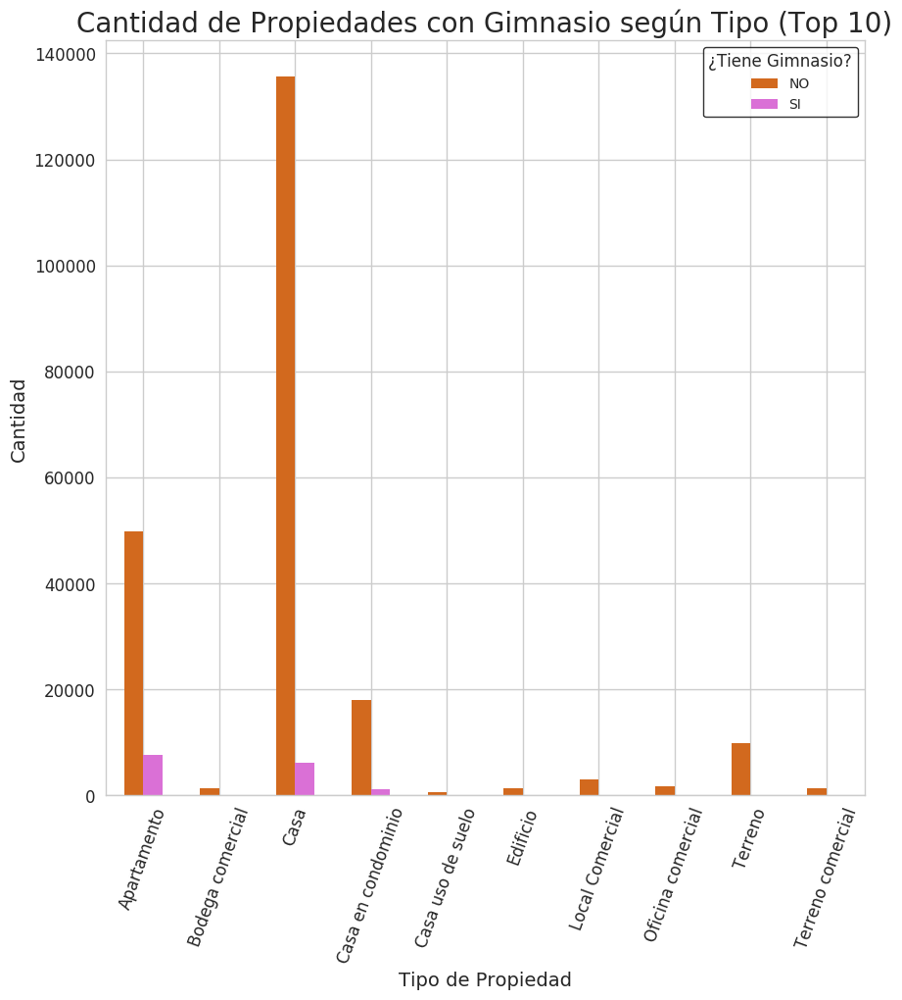

In [304]:
grafico_gimnasio_tipo=group_gimnasio_top.plot(kind='bar',color=['chocolate','orchid'],rot=70,fontsize=12,figsize=(10,10))
grafico_gimnasio_tipo.set_title("Cantidad de Propiedades con Gimnasio según Tipo (Top 10)",fontsize=20)
grafico_gimnasio_tipo.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_gimnasio_tipo.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene Gimnasio?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

### 9.6) Según SUM

In [293]:
sum_tipo=propiedades[['tipodepropiedad','usosmultiples']].copy()
sum_tipo_top=pd.merge(sum_tipo,tipo_propiedad_top,on='tipodepropiedad',how='inner')
sum_tipo_top['usosmultiples'].replace({0:'NO',1:'SI'},inplace=True)
sum_tipo_top['Valor']=1
sum_tipo_top.dropna(inplace=True)
group_sum_top=sum_tipo_top.pivot_table(index='tipodepropiedad',columns='usosmultiples',values='Valor',aggfunc='sum')
group_sum_top.fillna(0,inplace=True)
group_sum_top

usosmultiples,NO,SI
tipodepropiedad,,
Apartamento,51154.0,6187.0
Bodega comercial,1406.0,0.0
Casa,136618.0,5099.0
Casa en condominio,17390.0,1907.0
Casa uso de suelo,708.0,0.0
Edificio,1395.0,1.0
Local Comercial,3055.0,0.0
Oficina comercial,1739.0,2.0
Terreno,9945.0,0.0


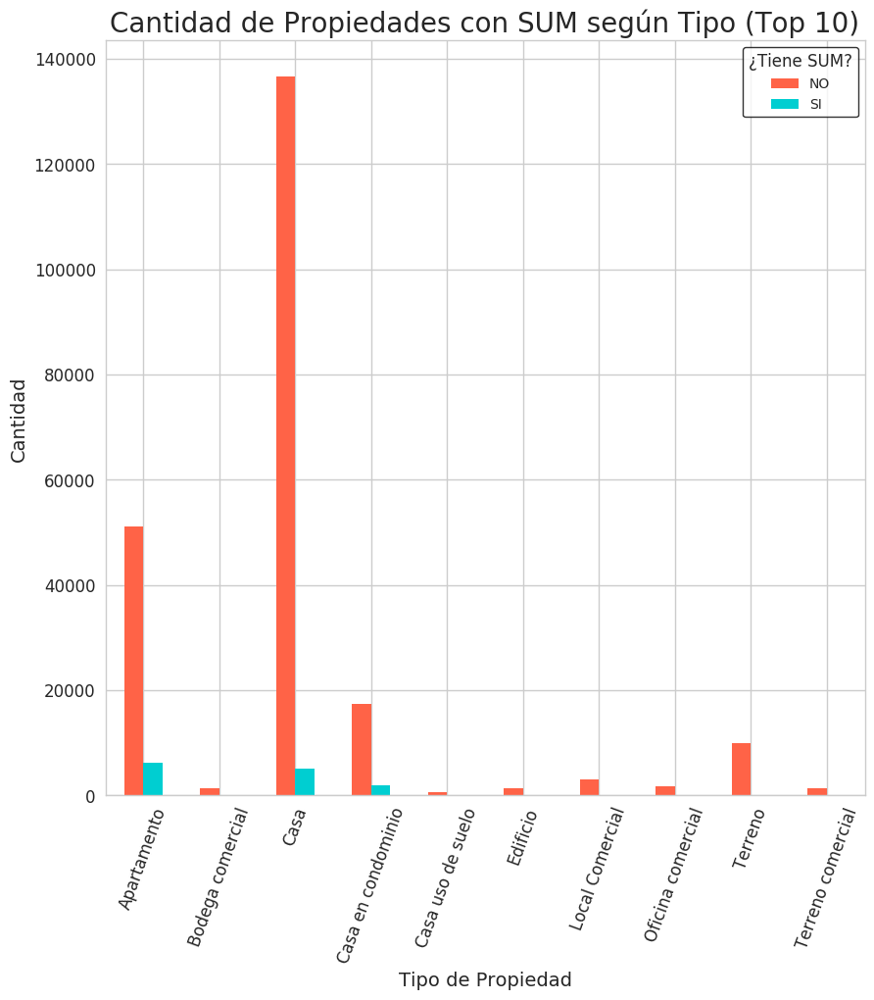

In [303]:
grafico_sum_tipo=group_sum_top.plot(kind='bar',color=['tomato','darkturquoise'],rot=70,fontsize=12,figsize=(10,10))
grafico_sum_tipo.set_title("Cantidad de Propiedades con SUM según Tipo (Top 10)",fontsize=20)
grafico_sum_tipo.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_sum_tipo.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(['NO','SI'],fontsize=10,title='¿Tiene SUM?',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

### 9.7) Según Antigüedad

In [299]:
tipo_antiguedad=propiedades[['tipodepropiedad','antiguedad']].copy()
tipo_antiguedad_top=pd.merge(tipo_antiguedad,tipo_propiedad_top,on='tipodepropiedad',how='inner')
tipo_antiguedad_top.dropna(inplace=True)
tipo_antiguedad_top['antiguedad'].fillna(0,inplace=True)
group_tipo_antiguedad_top=tipo_antiguedad_top.groupby(['tipodepropiedad']).agg({'antiguedad':'mean'})
group_tipo_antiguedad_top

,antiguedad
tipodepropiedad,
Apartamento,8.362021
Bodega comercial,9.635961
Casa,8.272588
Casa en condominio,6.328626
Casa uso de suelo,17.998377
Edificio,15.890924
Local Comercial,9.119196
Oficina comercial,12.840426
Terreno,1.031443


Text(0,0.5,'Tipo de Propiedad')

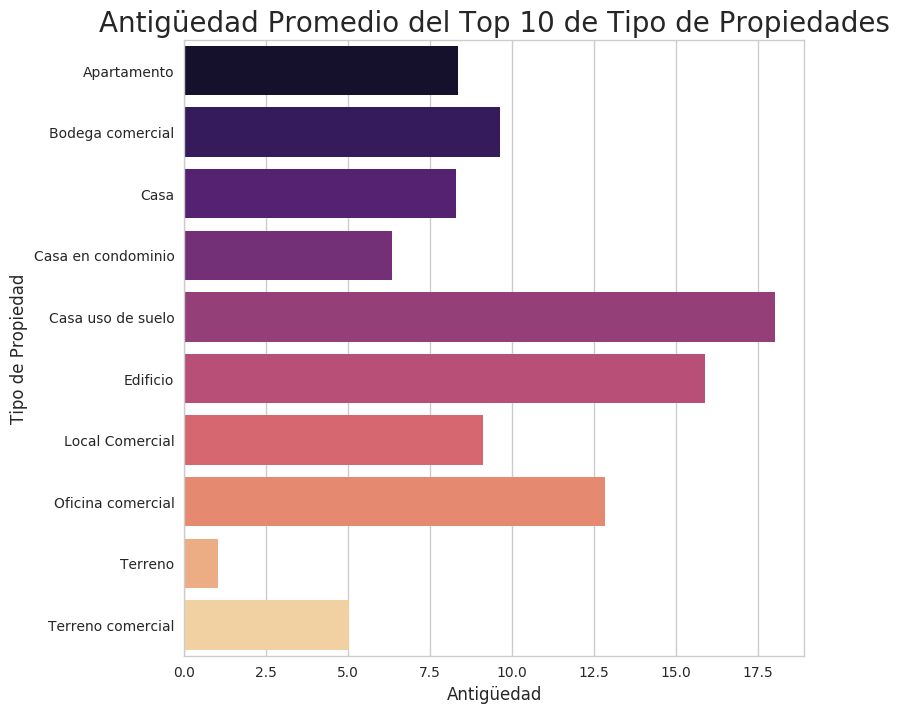

In [302]:
plt.subplots(figsize=(8,8))
grafico_tipo_antiguedad_top=sns.barplot(x=group_tipo_antiguedad_top['antiguedad'],y=group_tipo_antiguedad_top.index,orient='h',palette='magma')
grafico_tipo_antiguedad_top.set_title("Antigüedad Promedio del Top 10 de Tipo de Propiedades",fontsize=20)
grafico_tipo_antiguedad_top.set_xlabel("Antigüedad",fontsize=12)
grafico_tipo_antiguedad_top.set_ylabel("Tipo de Propiedad",fontsize=12)

## 10) Análisis General

### 10.1) Baños

In [3]:
cantidad_banos=propiedades['banos'].value_counts().sort_index().reset_index()
cantidad_banos['index']=cantidad_banos['index'].astype('int32')
cantidad_banos['banos']=cantidad_banos['banos'].astype('int32')
cantidad_banos.set_index('index',inplace=True)
cantidad_banos

,banos
index,
1,58173
2,87683
3,49365
4,18558


Text(0,0.5,'Cantidad de Baños')

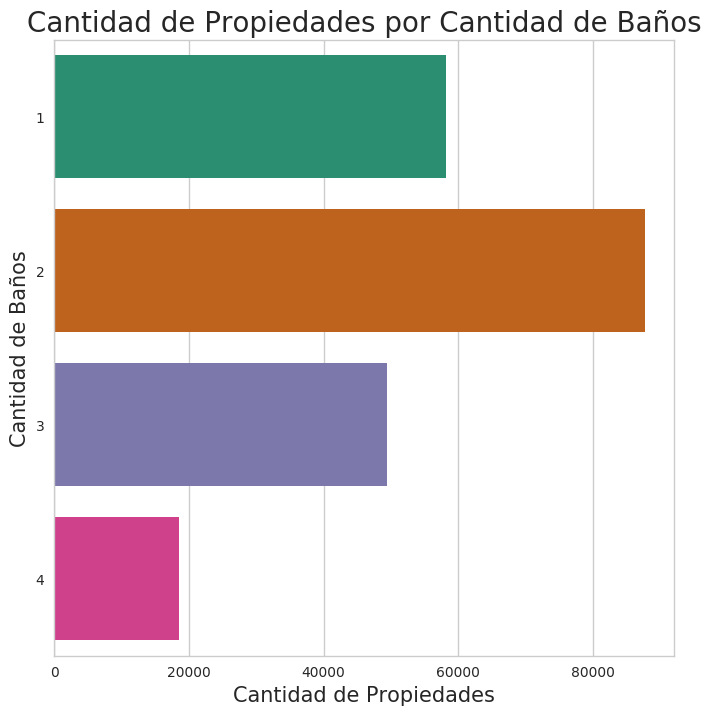

In [6]:
plt.subplots(figsize=(8,8))
grafico_cantidad_banos=sns.barplot(x=cantidad_banos['banos'],y=cantidad_banos.index,orient='h',palette='Dark2')
grafico_cantidad_banos.set_title("Cantidad de Propiedades por Cantidad de Baños",fontsize=20)
grafico_cantidad_banos.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_banos.set_ylabel("Cantidad de Baños",fontsize=15)

### 10.2) Habitaciones

In [7]:
cantidad_habitaciones=propiedades['habitaciones'].value_counts().sort_index().reset_index()
cantidad_habitaciones['index']=cantidad_habitaciones['index'].astype('int32')
cantidad_habitaciones.set_index('index',inplace=True)
cantidad_habitaciones_top=cantidad_habitaciones.head(5)
cantidad_habitaciones_resto=cantidad_habitaciones.tail(5)
cantidad_habitaciones_top

,habitaciones
index,
1,5069
2,57808
3,121887
4,25068
5,4596


In [8]:
cantidad_habitaciones_resto

,habitaciones
index,
6,1669
7,539
8,398
9,179
10,316


#### 10.2.1) Top

Text(0,0.5,'Cantidad de Propiedades')

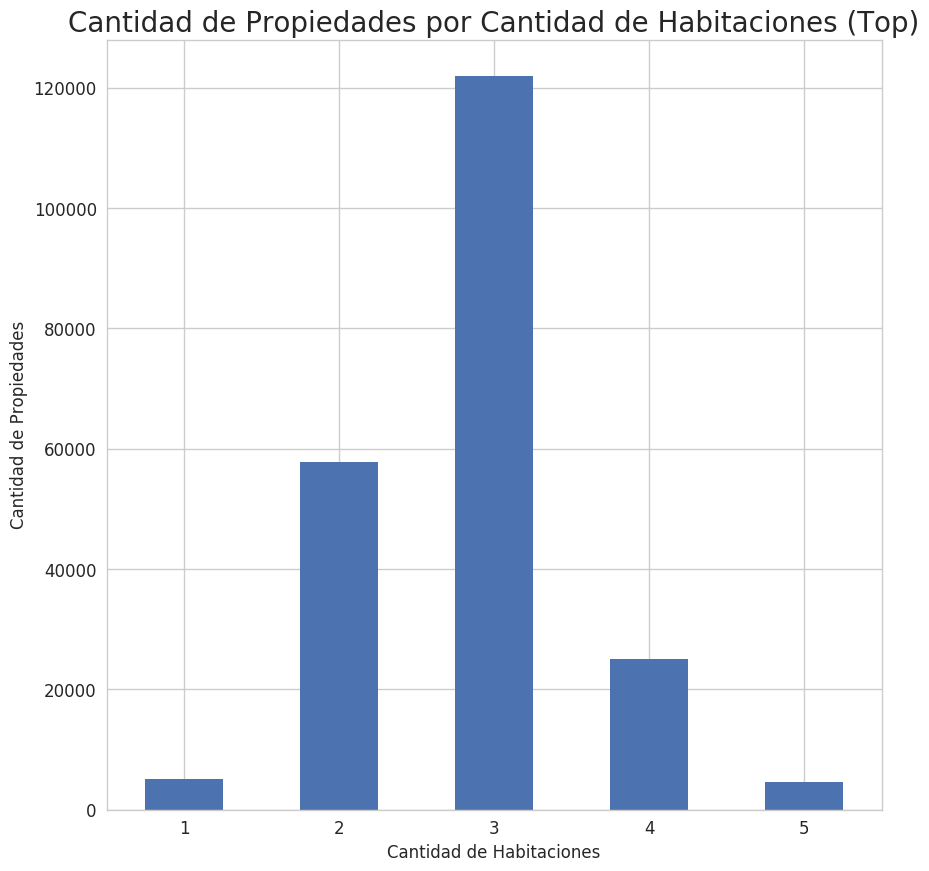

In [9]:
grafico_cantidad_habitaciones_top=cantidad_habitaciones_top.plot(kind='bar',rot=0,legend=False,fontsize=12,figsize=(10,10))
grafico_cantidad_habitaciones_top.set_title("Cantidad de Propiedades por Cantidad de Habitaciones (Top)",fontsize=20)
grafico_cantidad_habitaciones_top.set_xlabel("Cantidad de Habitaciones",fontsize=12)
grafico_cantidad_habitaciones_top.set_ylabel("Cantidad de Propiedades",fontsize=12)

#### 10.2.2) Resto

Text(0,0.5,'Cantidad de Propiedades')

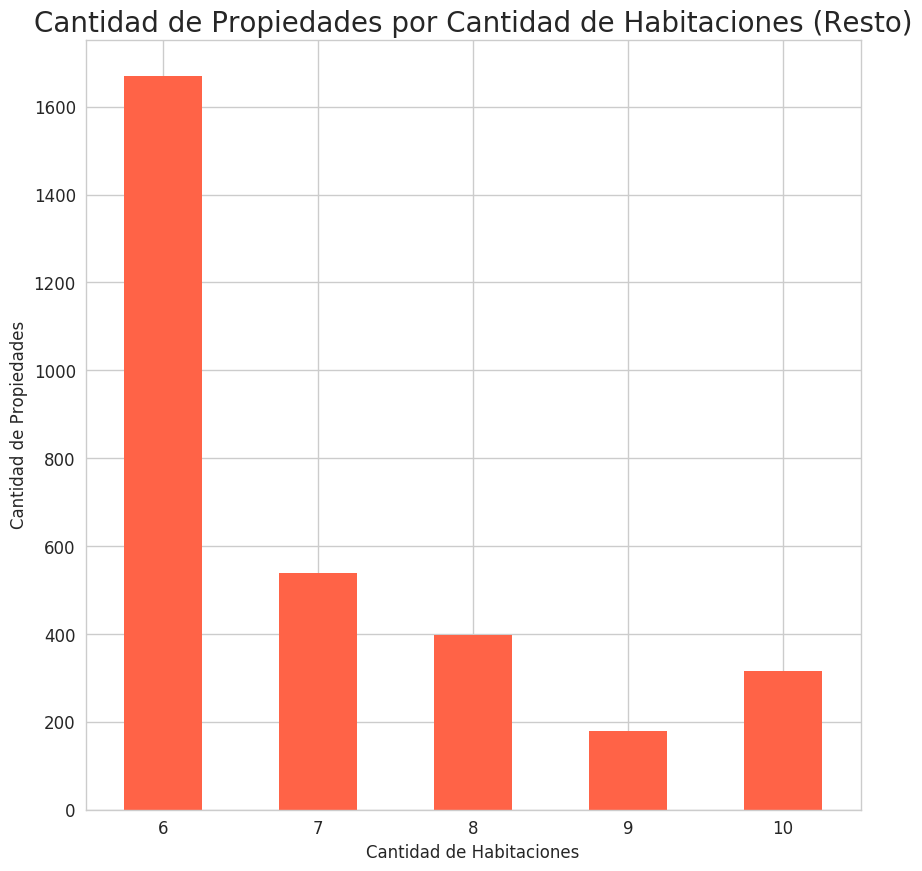

In [10]:
grafico_cantidad_habitaciones_resto=cantidad_habitaciones_resto.plot(kind='bar',color='tomato',rot=0,legend=False,fontsize=12,figsize=(10,10))
grafico_cantidad_habitaciones_resto.set_title("Cantidad de Propiedades por Cantidad de Habitaciones (Resto)",fontsize=20)
grafico_cantidad_habitaciones_resto.set_xlabel("Cantidad de Habitaciones",fontsize=12)
grafico_cantidad_habitaciones_resto.set_ylabel("Cantidad de Propiedades",fontsize=12)

### 10.3) Garages

In [11]:
cantidad_garages=propiedades['garages'].value_counts().sort_index().reset_index()
cantidad_garages['index']=cantidad_garages['index'].astype('int32')
cantidad_garages['garages']=cantidad_garages['garages'].astype('int32')
cantidad_garages.set_index('index',inplace=True)
cantidad_garages

,garages
index,
0,26926
1,59464
2,94167
3,21678


Text(0,0.5,'Cantidad de Garages')

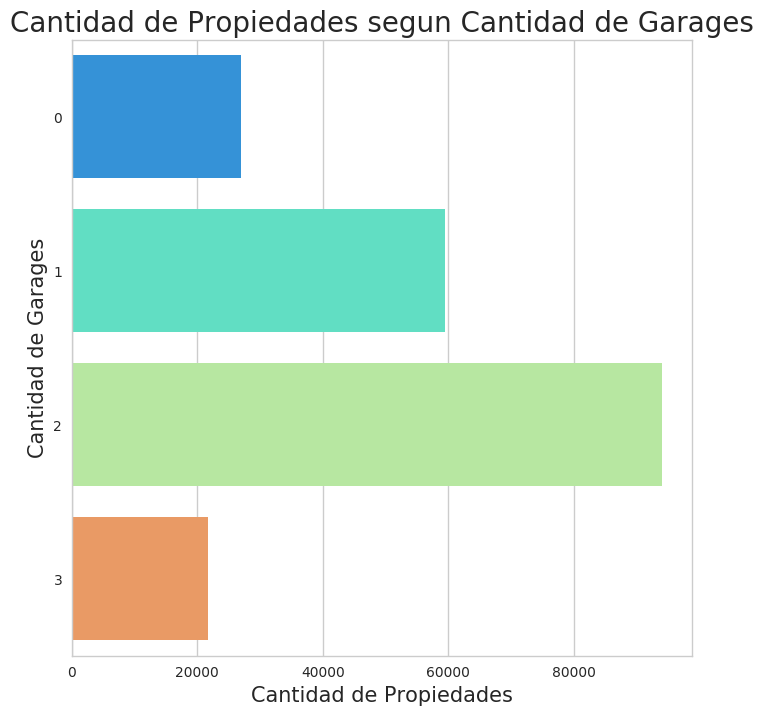

In [12]:
plt.subplots(figsize=(8,8))
grafico_cantidad_garages=sns.barplot(x=cantidad_garages['garages'],y=cantidad_garages.index,orient='h',palette='rainbow')
grafico_cantidad_garages.set_title("Cantidad de Propiedades segun Cantidad de Garages",fontsize=20)
grafico_cantidad_garages.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_garages.set_ylabel("Cantidad de Garages",fontsize=15)

### 10.4) Piscina

In [13]:
cantidad_piscina=propiedades['piscina'].value_counts().reset_index()
cantidad_piscina['index'].replace({0:'NO',1:'SI'},inplace=True)
cantidad_piscina.set_index('index',inplace=True)
cantidad_piscina

,piscina
index,
NO,219028
SI,20972


Text(0,0.5,'¿Tiene Piscina?')

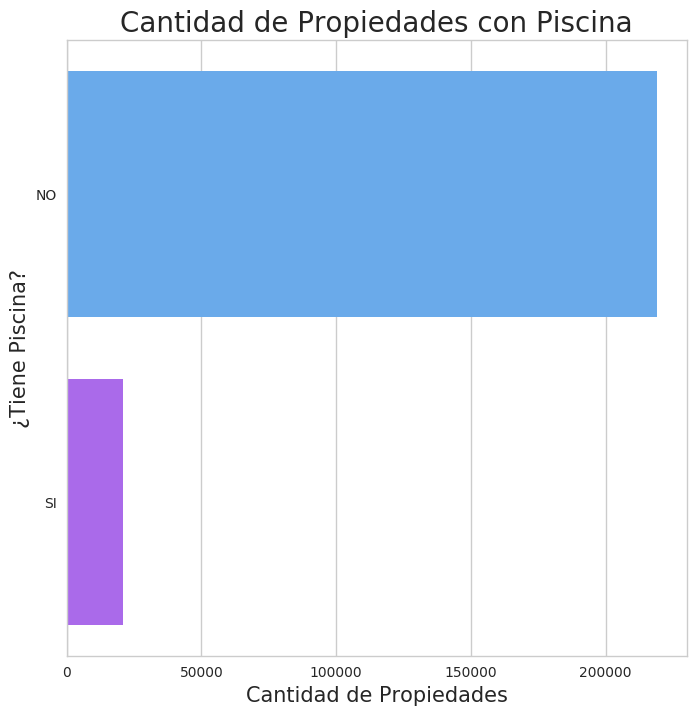

In [14]:
plt.subplots(figsize=(8,8))
grafico_cantidad_piscina=sns.barplot(x=cantidad_piscina['piscina'],y=cantidad_piscina.index,orient='h',palette='cool')
grafico_cantidad_piscina.set_title("Cantidad de Propiedades con Piscina",fontsize=20)
grafico_cantidad_piscina.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_piscina.set_ylabel("¿Tiene Piscina?",fontsize=15)

### 10.5) Gimansio

In [15]:
cantidad_gimnasio=propiedades['gimnasio'].value_counts().reset_index()
cantidad_gimnasio['index'].replace({0:'NO',1:'SI'},inplace=True)
cantidad_gimnasio.set_index('index',inplace=True)
cantidad_gimnasio

,gimnasio
index,
NO,225006
SI,14994


Text(0,0.5,'¿Tiene Gimnasio?')

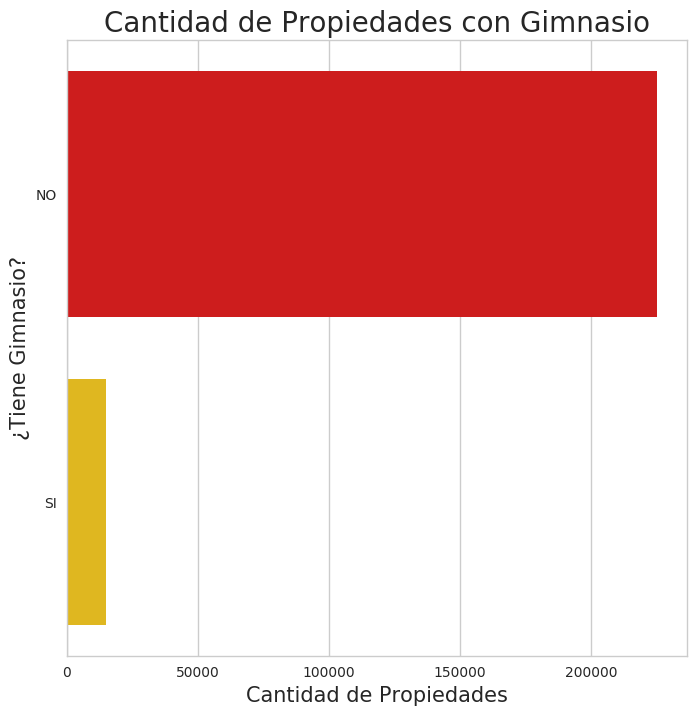

In [16]:
plt.subplots(figsize=(8,8))
grafico_cantidad_gimnasio=sns.barplot(x=cantidad_gimnasio['gimnasio'],y=cantidad_gimnasio.index,orient='h',palette='hot')
grafico_cantidad_gimnasio.set_title("Cantidad de Propiedades con Gimnasio",fontsize=20)
grafico_cantidad_gimnasio.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_gimnasio.set_ylabel("¿Tiene Gimnasio?",fontsize=15)

### 10.6) SUM

In [17]:
cantidad_sum=propiedades['usosmultiples'].value_counts().reset_index()
cantidad_sum['index'].replace({0:'NO',1:'SI'},inplace=True)
cantidad_sum.set_index('index',inplace=True)
cantidad_sum

,usosmultiples
index,
NO,226778
SI,13222


Text(0,0.5,'¿Tiene SUM?')

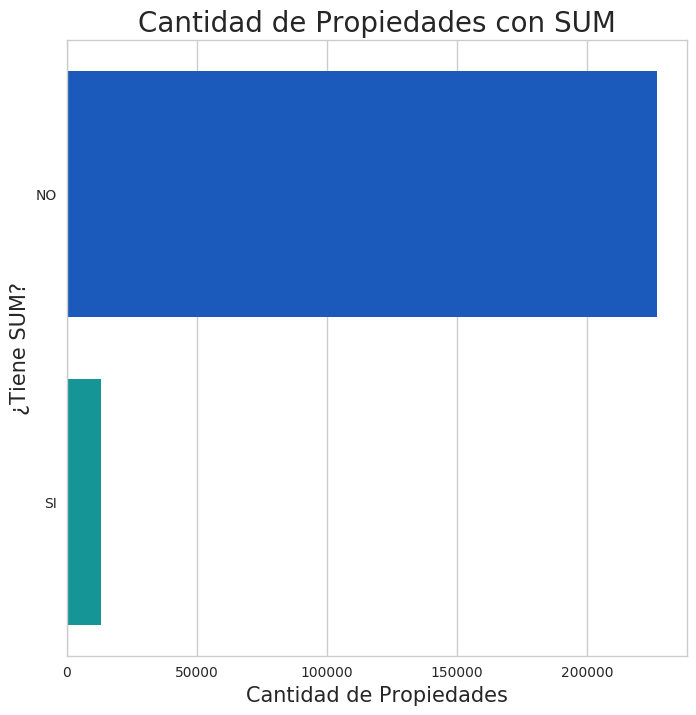

In [18]:
plt.subplots(figsize=(8,8))
grafico_cantidad_sum=sns.barplot(x=cantidad_sum['usosmultiples'],y=cantidad_sum.index,orient='h',palette='winter')
grafico_cantidad_sum.set_title("Cantidad de Propiedades con SUM",fontsize=20)
grafico_cantidad_sum.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_sum.set_ylabel("¿Tiene SUM?",fontsize=15)

### 10.7) Escuelas Cercanas

In [19]:
cantidad_escuelas=propiedades['escuelascercanas'].value_counts().reset_index()
cantidad_escuelas['index'].replace({0:'NO',1:'SI'},inplace=True)
cantidad_escuelas.set_index('index',inplace=True)
cantidad_escuelas

,escuelascercanas
index,
NO,133406
SI,106594


Text(0,0.5,'¿Tiene Escuelas Cercanas?')

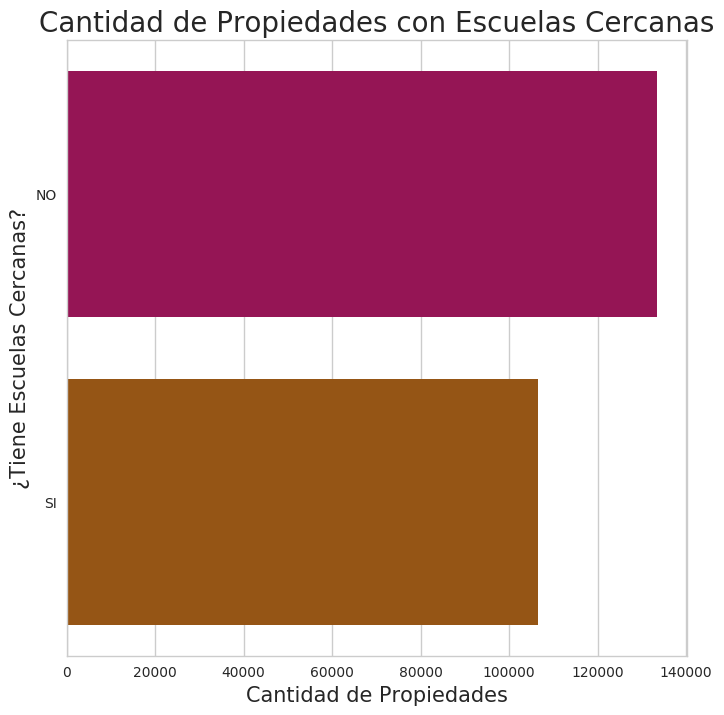

In [20]:
plt.subplots(figsize=(8,8))
grafico_cantidad_escuelas=sns.barplot(x=cantidad_escuelas['escuelascercanas'],y=cantidad_escuelas.index,orient='h',palette='brg')
grafico_cantidad_escuelas.set_title("Cantidad de Propiedades con Escuelas Cercanas",fontsize=20)
grafico_cantidad_escuelas.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_escuelas.set_ylabel("¿Tiene Escuelas Cercanas?",fontsize=15)

### 10.8) Centros Comerciales Cercanos

In [21]:
cantidad_centros=propiedades['centroscomercialescercanos'].value_counts().reset_index()
cantidad_centros['index'].replace({0:'NO',1:'SI'},inplace=True)
cantidad_centros.set_index('index',inplace=True)
cantidad_centros

,centroscomercialescercanos
index,
NO,144832
SI,95168


Text(0,0.5,'¿Tiene Centros Comeciales Cercanos?')

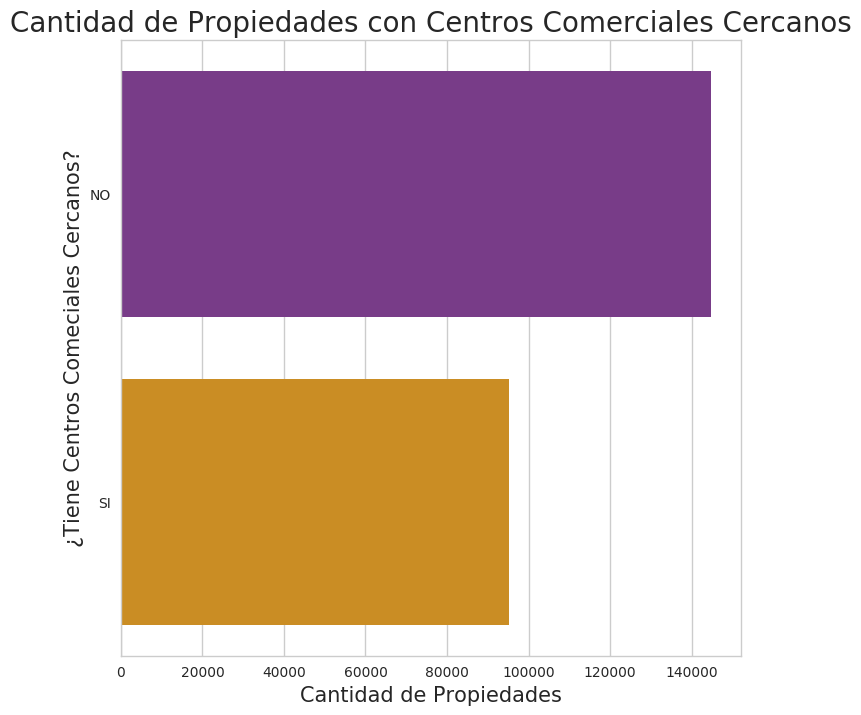

In [22]:
plt.subplots(figsize=(8,8))
grafico_cantidad_centros=sns.barplot(x=cantidad_centros['centroscomercialescercanos'],y=cantidad_centros.index,orient='h',palette='CMRmap')
grafico_cantidad_centros.set_title("Cantidad de Propiedades con Centros Comerciales Cercanos",fontsize=20)
grafico_cantidad_centros.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_centros.set_ylabel("¿Tiene Centros Comeciales Cercanos?",fontsize=15)

### 10.9) Tipo de Propiedades

In [23]:
cantidad_tipo_propiedad_top=propiedades['tipodepropiedad'].value_counts().head(10)
cantidad_tipo_propiedad_top

Casa                  141717
Apartamento            57341
Casa en condominio     19297
Terreno                 9945
Local Comercial         3055
Oficina comercial       1741
Bodega comercial        1406
Edificio                1396
Terreno comercial       1326
Casa uso de suelo        708
Name: tipodepropiedad, dtype: int64

Text(0,0.5,'Tipo de Propiedad')

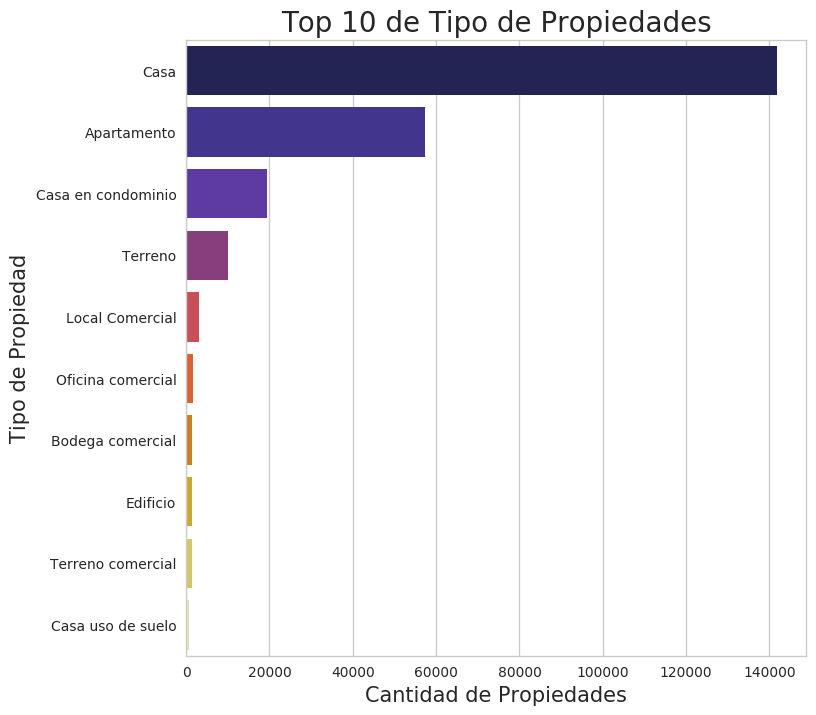

In [24]:
plt.subplots(figsize=(8,8))
grafico_cantidad_tipo_top=sns.barplot(x=cantidad_tipo_propiedad_top.values,y=cantidad_tipo_propiedad_top.index,orient='h',palette='CMRmap')
grafico_cantidad_tipo_top.set_title("Top 10 de Tipo de Propiedades",fontsize=20)
grafico_cantidad_tipo_top.set_xlabel("Cantidad de Propiedades",fontsize=15)
grafico_cantidad_tipo_top.set_ylabel("Tipo de Propiedad",fontsize=15)

### 10.10) Antigüedad

In [25]:
cantidad_antiguedad=propiedades['antiguedad'].value_counts().sort_index().reset_index()
cantidad_antiguedad.drop(columns={'index'},inplace=True)
cantidad_antiguedad_top=cantidad_antiguedad.head(40)
cantidad_antiguedad_resto=cantidad_antiguedad.tail(38)

#### 10.10.1) Top

Text(0,0.5,'Cantidad de Propiedades')

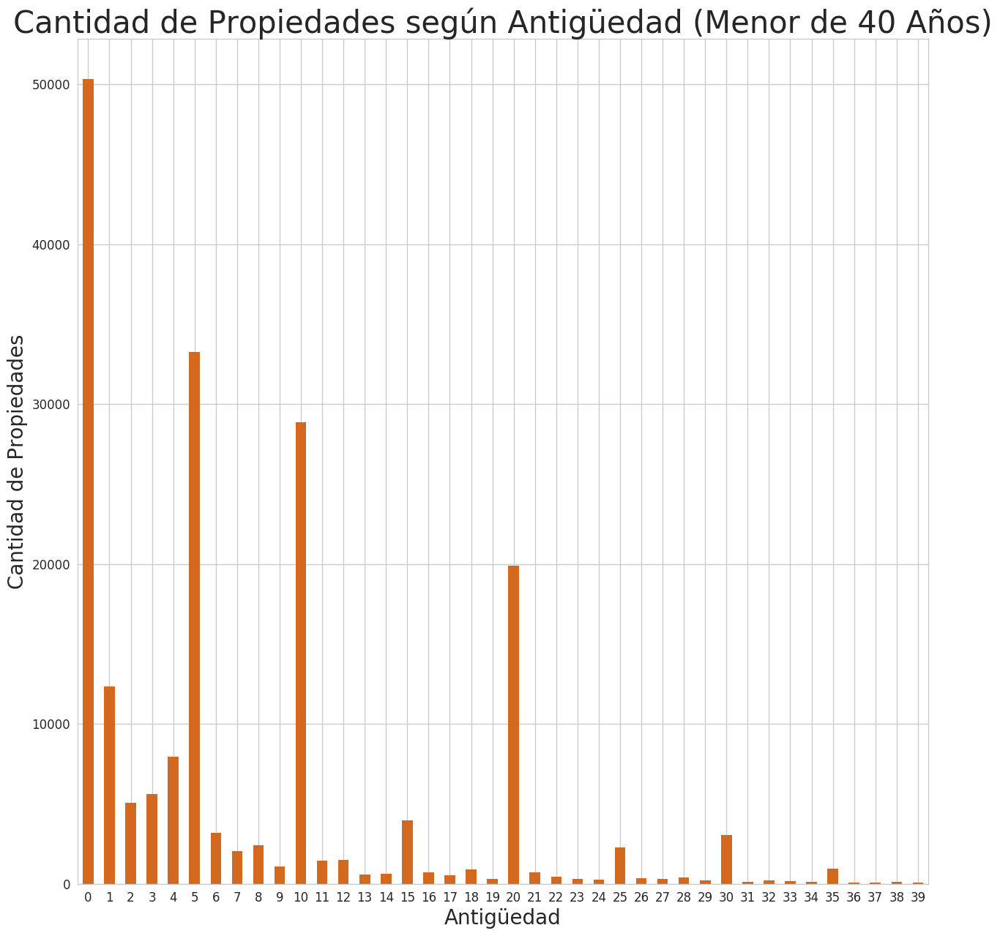

In [26]:
grafico_antiguedad_top=cantidad_antiguedad_top.plot(kind='bar',color='chocolate',fontsize=12,figsize=(15,15),rot=0,legend=False)
grafico_antiguedad_top.set_title("Cantidad de Propiedades según Antigüedad (Menor de 40 Años)",fontsize=30)
grafico_antiguedad_top.set_xlabel("Antigüedad",fontsize=20)
grafico_antiguedad_top.set_ylabel("Cantidad de Propiedades",fontsize=20)

#### 10.10.2) Resto

Text(0,0.5,'Cantidad de Propiedades')

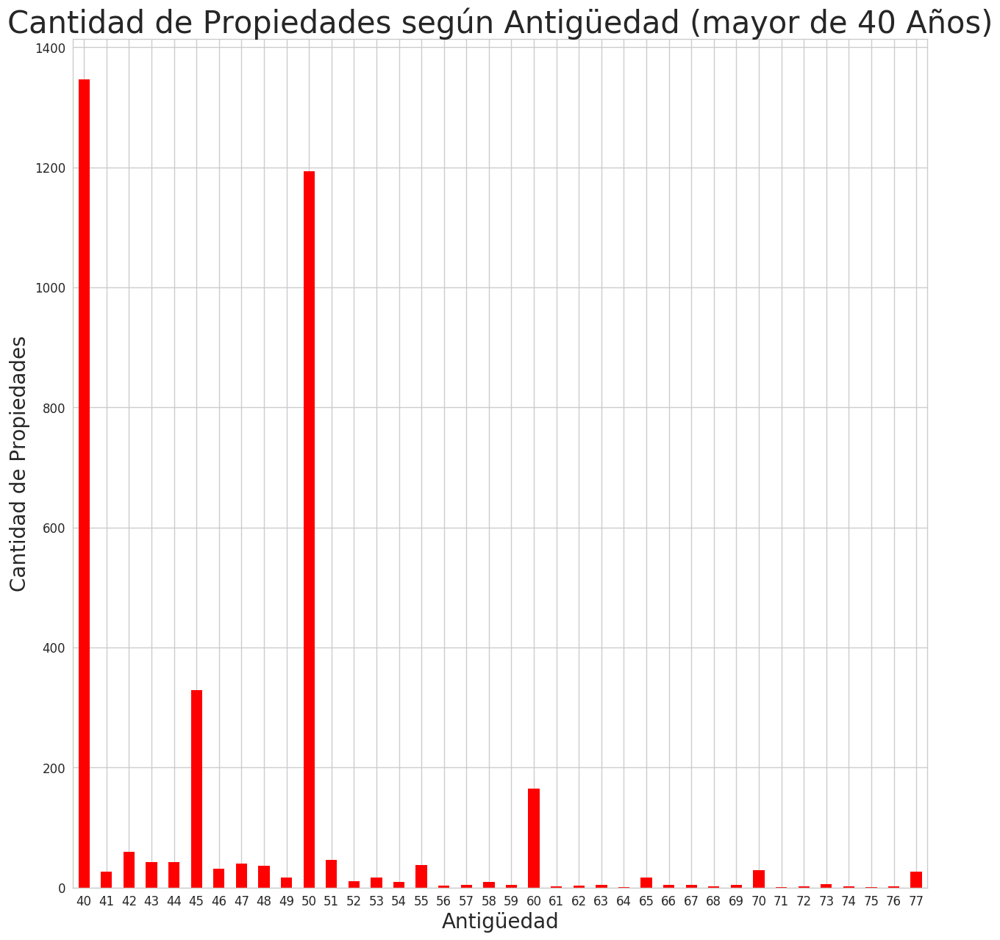

In [27]:
grafico_antiguedad_resto=cantidad_antiguedad_resto.plot(kind='bar',color='r',fontsize=12,figsize=(15,15),rot=0,legend=False)
grafico_antiguedad_resto.set_title("Cantidad de Propiedades según Antigüedad (mayor de 40 Años)",fontsize=30)
grafico_antiguedad_resto.set_xlabel("Antigüedad",fontsize=20)
grafico_antiguedad_resto.set_ylabel("Cantidad de Propiedades",fontsize=20)